In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import os
import sys
import pathlib
from fnmatch import fnmatch

from astropy.constants import au, R_sun, R_earth, R_jup
from astropy.stats import SigmaClip

from wotan import flatten

from astropy import units as u

from astropy.constants import au, R_sun, R_earth, R_jup, G, M_sun


In [2]:
from tensorflow import keras


In [3]:
parent = os.path.dirname(os.path.abspath(''))
sys.path.append(parent)

from BRITE_Cookbook.BRITE import BRITE, plot_brite


from light_curve_util_new import *
from inject_transit_new import *

In [4]:
stellar_data = pd.read_csv('../stellar_radius.csv', sep = ';')
stellar_data

,Name,stellar radius
0,HD 017163,1.76896
1,HD 161912,77.97130
2,HD 022468,3.03985
3,HD 095880,69.67230
4,HD 017943,2.57020
...,...,...
531,HD 030652,2.50000
532,HD 074071,3.20000
533,HD 056456,3.51579
534,HD 071935,3.04036


### Load model

In [5]:
final_model = keras.models.load_model(f'../models/FINAL_astronet_final.h5')
final_model.summary()

Model: "model_36"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_global (InputLayer)      [(None, 201, 1)]     0           []                               
                                                                                                  
 conv1d_504 (Conv1D)            (None, 201, 16)      96          ['Input_global[0][0]']           
                                                                                                  
 conv1d_505 (Conv1D)            (None, 201, 16)      1296        ['conv1d_504[0][0]']             
                                                                                                  
 max_pooling1d_252 (MaxPooling1  (None, 99, 16)      0           ['conv1d_505[0][0]']             
 D)                                                                                        

### Load dataset

In [6]:
data_labeled_selected = pd.read_csv("../data_labeled_selected.csv")

In [7]:
#index = 2376
index = 16550
data_labeled_selected[data_labeled_selected["index"] == index]

,target,satellite,label,index,filename,view,period,t0,star_radius,k,aos,i,e,w,ldcs_1,ldcs_2,n_points_transit
6948,HD36861,BHr,PC,16550,16550_curve_HD36861_BHr.npy,Curve,3.950391,3573.126927,1.9,0.067257,6.568183,1.56868,0.0,0.0,0.5,0.13,2743
6949,HD36861,BHr,PC,16550,16550_fold_HD36861_BHr.npy,PhaseFold,3.950391,3573.126927,1.9,0.067257,6.568183,1.56868,0.0,0.0,0.5,0.13,2743
6950,HD36861,BHr,PC,16550,16550_global_HD36861_BHr.npy,Global,3.950391,3573.126927,1.9,0.067257,6.568183,1.56868,0.0,0.0,0.5,0.13,2743
6951,HD36861,BHr,PC,16550,16550_local_HD36861_BHr.npy,Local,3.950391,3573.126927,1.9,0.067257,6.568183,1.56868,0.0,0.0,0.5,0.13,2743


## Experimento 1  

¿Cuanta diferencia en t0 es suficiente para que el modelo no detecte el tránsito?

Resultados:

In [8]:
print(len( range(-1440, 1440, 100)))
for difference_t0 in  range(-1440, 1440, 100):
    print(difference_t0)

29
-1440
-1340
-1240
-1140
-1040
-940
-840
-740
-640
-540
-440
-340
-240
-140
-40
60
160
260
360
460
560
660
760
860
960
1060
1160
1260
1360


In [9]:
def time_epoch_experiment(index, plot = False):

    #difference_t0 = 0 # days
    difference_p0 = 0 # 20/1440# days
    j = 0
    
    query_index = data_labeled_selected[data_labeled_selected["index"] == index]

    #print(query_index)

    filename = query_index[query_index["view"] == "Curve"]["filename"].values[0]

    folder = "../GeneratedSamples"

    
    data_curve = np.load(f"{folder}/{filename}")    
    
    if (plot):
        plt.title(f"Curve", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
        plt.show()

        filename_phasefold = query_index[query_index["view"] == "PhaseFold"]["filename"].values[0]
        data_curve_phasefold = np.load(f"{folder}/{filename_phasefold}")    
        plt.title(f"Phase fold", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve_phasefold[0, :], data_curve_phasefold[1,:], 'b.')
        plt.show()

        print("period", query_index["period"].values[0])
        print("t0", query_index["t0"].values[0])
        print("star_radius, ", query_index["star_radius"].values[0])
        print("k, ", query_index["k"].values[0])
        print("aos, ",query_index["aos"].values[0])
        print("i", query_index["i"].values[0])



    difference_t0_list = []
    score_list = []

    for difference_t0 in  range(-1440, 1440, 100):


        difference_t0 = difference_t0/1440

        difference_t0_list.append(difference_t0*1440)

        r_p = query_index["period"].values[0] + difference_p0 # days

        t0 = query_index["t0"].values[0] + j*r_p + difference_t0 # days

        r_a = query_index["aos"].values[0]
        star_radius = query_index["star_radius"].values[0]
        r_k = query_index["k"].values[0]
        r_i = query_index["i"].values[0]

        sma = (star_radius*R_sun*r_a).to(u.au).value # sma = sr * aos [AU]
        #print("sma [AU]: ", sma)
        planet_factor = r_k*star_radius*R_sun/R_jup # k = planet_radius/star_radius => planet_radius = k*radius_star
        #print("Radius planet (Rjup): ", planet_factor)
        transit_duration = calculate_transit_duration(sma = sma, rp = planet_factor, rs = star_radius, i = r_i, period = r_p).value
        #print("transit_duration: ", transit_duration)
        #print("aos: ", (sma * u.au).to(u.m).value/(R_sun*star_radius).value)


        #bin_width_factor_global = 1.2/201
        #bin_width_factor_local = 0.16
        bin_width_factor_global=5*1.2/201
        bin_width_factor_local=3*0.16

        t_ = data_curve[0, :]
        f_ =  data_curve[1, :]

        #t0 = np.min(t_)

        time_fold, flux_fold = phase_fold_and_sort_light_curve(t_, f_, r_p, t0)
        global_view_result = global_view(time_fold, flux_fold, r_p, bin_width_factor = bin_width_factor_global)
        local_view_result = local_view(time_fold, flux_fold, r_p, transit_duration, bin_width_factor = bin_width_factor_local)

        score = final_model.predict( [global_view_result.reshape(1,-1), local_view_result.reshape(1,-1) ] )[0][0][0]
        print("Prediction: ", score)
        score_list.append(score)
        
        if (plot):
            fig = plt.figure(figsize=(16, 4)) 
            ax = fig.add_subplot(1, 3, 1)
            plt.title(f"Curve", fontsize = 15)
            plt.ylabel("Relative Magnitude", fontsize = 13)
            plt.xlabel("HJD - 2456000.0", fontsize = 13)
            plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
            plt.gca().invert_yaxis() # invert y axis
            #plt.show()

            ax = fig.add_subplot(1, 3, 2)
            plt.title("PC - Global view. Score: {:.2f}\nDifference t0: {:.2f} [min]".format(score, difference_t0*1440), fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylabel("Normalized Brightness", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(global_view_result)), global_view_result, 'b.')
            #plt.show()

            ax = fig.add_subplot(1, 3, 3)
            plt.title(f"PC - Local view", fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(local_view_result)), local_view_result, 'b.')
            #plt.show()
        
    return difference_t0_list, score_list



In [ ]:
#np.random.seed(3874182)
np.random.seed(3874183)
N = 10
list_random_selected = np.random.choice(np.unique(data_labeled_selected[data_labeled_selected["label"] == "PC"]["index"]), N)


difference_t0_list_full = []
score_list_full = []

for index in list_random_selected:
    print(index)
    difference_t0_list, score_list = time_epoch_experiment(index, plot = True)
    difference_t0_list_full.append(difference_t0_list)
    score_list_full.append(score_list)
    

4.489471512787317
4.59656801772906
1.072515115114998
3.124362654772073
3.209984655647398
3.645167015117528
2.780839115447985
1.259180696411612
1.5305709882834406
3.137743902998775
1.072515115114998
1.259180696411612
1.5305709882834406
2.780839115447985
3.124362654772073
3.137743902998775
3.209984655647398
3.645167015117528
4.489471512787317
4.59656801772906


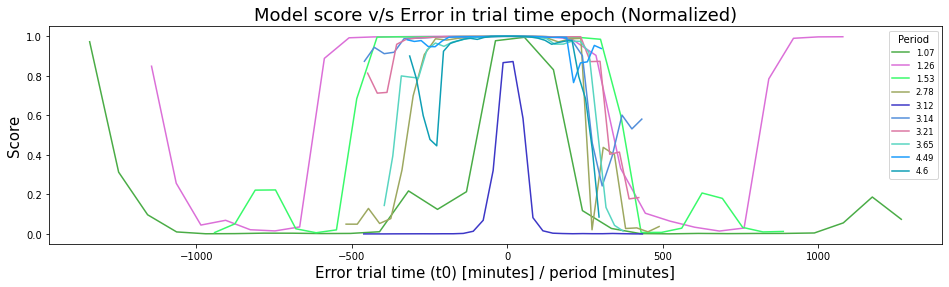

In [61]:

fig = plt.figure(figsize=(16, 4)) 
ax = fig.add_subplot(1, 1, 1)
plt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial time (t0) [minutes] / period [minutes]", fontsize = 15)
#plt.xlim([-800, 800])

#np.random.seed(34324)


period_list = []
for i in range(N):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    period_list.append(period)
    

    
#np.random.seed(34324)
np.random.seed(34329)
for i in np.argsort(period_list):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    plt.plot(np.array(difference_t0_list_full[i])/period, score_list_full[i], c=np.random.rand(3,) , label = f'{np.round(period,2)}')
    #plt.plot(np.array(difference_t0_list_full[i])/np.min(period_list), score_list_full[i], c=np.random.rand(3,) , label = f'{np.round(period,2)}')
plt.legend( title="Period", fontsize='small')    
plt.show()

In [62]:
'''

fig = plt.figure(figsize=(16, 4)) 
ax = fig.add_subplot(1, 1, 1)
plt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial time (t0) [minutes] / period [minutes]", fontsize = 15)
#plt.xlim([-800, 800])

print(difference_t0_list_full[5])
print(score_list_full[5])

plt.plot(np.array(difference_t0_list_full[5])/period, score_list_full[5], c=np.random.rand(3,))
plt.show()
'''

'\n\nfig = plt.figure(figsize=(16, 4)) \nax = fig.add_subplot(1, 1, 1)\nplt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)\nplt.ylabel("Score", fontsize = 15)\nplt.xlabel("Error trial time (t0) [minutes] / period [minutes]", fontsize = 15)\n#plt.xlim([-800, 800])\n\nprint(difference_t0_list_full[5])\nprint(score_list_full[5])\n\nplt.plot(np.array(difference_t0_list_full[5])/period, score_list_full[5], c=np.random.rand(3,))\nplt.show()\n'

In [10]:
#np.random.seed(3874182)
np.random.seed(3874183)
N = 500
list_random_selected = np.random.choice(np.unique(data_labeled_selected[data_labeled_selected["label"] == "PC"]["index"]), N, replace = False)


difference_t0_list_full = []
score_list_full = []

for index in list_random_selected:
    print("index: ", index)
    difference_t0_list, score_list = time_epoch_experiment(index, plot = False)
    difference_t0_list_full.append(difference_t0_list)
    score_list_full.append(score_list)
    

index:  7982
1/1 [==============================] - 1s 558ms/step
Prediction:  0.0028203304
1/1 [==============================] - 0s 22ms/step
Prediction:  0.0036728596
1/1 [==============================] - 0s 22ms/step
Prediction:  0.0019809336
1/1 [==============================] - 0s 27ms/step
Prediction:  0.001911772
1/1 [==============================] - 0s 20ms/step
Prediction:  0.00311806
1/1 [==============================] - 0s 25ms/step
Prediction:  0.006563661
1/1 [==============================] - 0s 21ms/step
Prediction:  0.14076637
1/1 [==============================] - 0s 21ms/step
Prediction:  0.20092095
1/1 [==============================] - 0s 20ms/step
Prediction:  0.17621972
1/1 [==============================] - 0s 20ms/step
Prediction:  0.13352083
1/1 [==============================] - 0s 19ms/step
Prediction:  0.16344182
1/1 [==============================] - 0s 17ms/step
Prediction:  0.44606486
1/1 [==============================] - 0s 21ms/step
Prediction:  0

1/1 [==============================] - 0s 15ms/step
Prediction:  0.98965085
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98936343
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9928823
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9963785
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9980173
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99736154
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9911398
1/1 [==============================] - 0s 15ms/step
Prediction:  0.977212
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9847887
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9906966
1/1 [==============================] - 0s 15ms/step
Prediction:  0.94796973
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9597862
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9173369
1/1 [=================

1/1 [==============================] - 0s 16ms/step
Prediction:  0.12349458
1/1 [==============================] - 0s 15ms/step
Prediction:  0.030819638
1/1 [==============================] - 0s 15ms/step
Prediction:  0.21163803
1/1 [==============================] - 0s 18ms/step
Prediction:  0.7472384
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8818179
1/1 [==============================] - 0s 15ms/step
Prediction:  0.8657321
1/1 [==============================] - 0s 15ms/step
Prediction:  0.633102
1/1 [==============================] - 0s 15ms/step
Prediction:  0.27869213
1/1 [==============================] - 0s 19ms/step
Prediction:  0.93783194
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9710034
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9628711
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9850985
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9965888
1/1 [===============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.85206646
1/1 [==============================] - 0s 16ms/step
Prediction:  0.41013777
1/1 [==============================] - 0s 16ms/step
Prediction:  0.45865828
1/1 [==============================] - 0s 16ms/step
Prediction:  0.51211065
1/1 [==============================] - 0s 23ms/step
Prediction:  0.30176565
1/1 [==============================] - 0s 15ms/step
Prediction:  0.13112865
1/1 [==============================] - 0s 16ms/step
Prediction:  0.05980385
index:  9881
1/1 [==============================] - 0s 16ms/step
Prediction:  0.040300112
1/1 [==============================] - 0s 16ms/step
Prediction:  0.03658944
1/1 [==============================] - 0s 16ms/step
Prediction:  0.013489237
1/1 [==============================] - 0s 15ms/step
Prediction:  0.022596573
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0146842
1/1 [==============================] - 0s 17ms/step
Prediction:  0.016844

1/1 [==============================] - 0s 20ms/step
Prediction:  0.9990999
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998123
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99969304
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9990493
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9978337
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99638754
1/1 [==============================] - 0s 15ms/step
Prediction:  0.95469624
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7989645
1/1 [==============================] - 0s 16ms/step
Prediction:  0.6400152
1/1 [==============================] - 0s 15ms/step
Prediction:  0.10993286
1/1 [==============================] - 0s 15ms/step
Prediction:  0.15798597
1/1 [==============================] - 0s 16ms/step
Prediction:  0.15573528
1/1 [==============================] - 0s 15ms/step
Prediction:  0.13827322
1/1 [=============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99986446
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99975
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99815416
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98599356
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9337627
1/1 [==============================] - 0s 15ms/step
Prediction:  0.49693134
1/1 [==============================] - 0s 15ms/step
Prediction:  0.06659712
1/1 [==============================] - 0s 17ms/step
Prediction:  0.015512421
1/1 [==============================] - 0s 15ms/step
Prediction:  0.028480258
1/1 [==============================] - 0s 15ms/step
Prediction:  0.37107927
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7922211
1/1 [==============================] - 0s 19ms/step
Prediction:  0.15295243
1/1 [==============================] - 0s 15ms/step
Prediction:  0.030442998
1/1 [=========

1/1 [==============================] - 0s 15ms/step
Prediction:  0.99988717
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99971694
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9990586
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9982922
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99905956
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9981524
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98937
1/1 [==============================] - 0s 14ms/step
Prediction:  0.88606364
1/1 [==============================] - 0s 15ms/step
Prediction:  0.42333284
1/1 [==============================] - 0s 16ms/step
Prediction:  0.21491897
1/1 [==============================] - 0s 16ms/step
Prediction:  0.050281428
1/1 [==============================] - 0s 16ms/step
Prediction:  0.042799696
1/1 [==============================] - 0s 18ms/step
Prediction:  0.07565707
1/1 [===========

1/1 [==============================] - 0s 24ms/step
Prediction:  0.682678
1/1 [==============================] - 0s 19ms/step
Prediction:  0.88950837
1/1 [==============================] - 0s 22ms/step
Prediction:  0.359719
1/1 [==============================] - 0s 19ms/step
Prediction:  0.057464257
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9164275
1/1 [==============================] - 0s 16ms/step
Prediction:  0.95908993
1/1 [==============================] - 0s 20ms/step
Prediction:  0.94820684
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9894976
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99851996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99918026
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99593425
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9832766
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98101074
1/1 [=============

Prediction:  0.0014430776
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0025413686
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0028498578
index:  13984
1/1 [==============================] - 0s 26ms/step
Prediction:  0.0056398977
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0017267212
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0006759817
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0006176138
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0003254886
1/1 [==============================] - 0s 19ms/step
Prediction:  0.000551647
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0006271076
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00050338474
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0014582125
1/1 [==============================] - 0s 21ms/step
Prediction:  0.004692282
1/1 [====================

Prediction:  0.9754383
1/1 [==============================] - 0s 19ms/step
Prediction:  0.97369236
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99142176
1/1 [==============================] - 0s 19ms/step
Prediction:  0.98596674
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9929352
1/1 [==============================] - 0s 24ms/step
Prediction:  0.99854517
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996282
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997234
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9991236
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99471885
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9878809
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9915839
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98522365
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9754

1/1 [==============================] - 0s 15ms/step
Prediction:  0.4782372
1/1 [==============================] - 0s 15ms/step
Prediction:  0.3536639
1/1 [==============================] - 0s 16ms/step
Prediction:  0.14600436
1/1 [==============================] - 0s 16ms/step
Prediction:  0.016540412
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0028076929
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0022101537
1/1 [==============================] - 0s 22ms/step
Prediction:  0.0017172456
1/1 [==============================] - 0s 15ms/step
Prediction:  0.002284222
index:  16361
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0012062754
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0035964467
1/1 [==============================] - 0s 17ms/step
Prediction:  0.019664448
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0027935132
1/1 [==============================] - 0s 17ms/step
Predictio

1/1 [==============================] - 0s 15ms/step
Prediction:  0.017777517
1/1 [==============================] - 0s 16ms/step
Prediction:  0.02447239
1/1 [==============================] - 0s 17ms/step
Prediction:  0.02674036
1/1 [==============================] - 0s 16ms/step
Prediction:  0.03231453
1/1 [==============================] - 0s 17ms/step
Prediction:  0.03219451
1/1 [==============================] - 0s 16ms/step
Prediction:  0.22286923
1/1 [==============================] - 0s 16ms/step
Prediction:  0.3224081
1/1 [==============================] - 0s 18ms/step
Prediction:  0.35355413
1/1 [==============================] - 0s 17ms/step
Prediction:  0.25420627
1/1 [==============================] - 0s 25ms/step
Prediction:  0.46686408
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9156492
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98848885
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99829507
1/1 [========

1/1 [==============================] - 0s 21ms/step
Prediction:  0.9996766
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9998254
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998066
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962884
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99935764
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9990081
1/1 [==============================] - 0s 16ms/step
Prediction:  0.998614
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9969172
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9963726
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9974822
1/1 [==============================] - 0s 18ms/step
Prediction:  0.997997
1/1 [==============================] - 0s 30ms/step
Prediction:  0.9922393
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99492145
1/1 [===================

1/1 [==============================] - 0s 15ms/step
Prediction:  0.23147401
1/1 [==============================] - 0s 16ms/step
Prediction:  0.26155654
1/1 [==============================] - 0s 18ms/step
Prediction:  0.18914501
1/1 [==============================] - 0s 16ms/step
Prediction:  0.10660137
1/1 [==============================] - 0s 17ms/step
Prediction:  0.042957842
index:  5587
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6569964
1/1 [==============================] - 0s 15ms/step
Prediction:  0.3448414
1/1 [==============================] - 0s 19ms/step
Prediction:  0.40381914
1/1 [==============================] - 0s 16ms/step
Prediction:  0.71866477
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98275197
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9888289
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9874149
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9697541
1/1

1/1 [==============================] - 0s 17ms/step
Prediction:  0.5848847
1/1 [==============================] - 0s 18ms/step
Prediction:  0.36439034
1/1 [==============================] - 0s 18ms/step
Prediction:  0.6048679
1/1 [==============================] - 0s 22ms/step
Prediction:  0.84633297
1/1 [==============================] - 0s 19ms/step
Prediction:  0.7760815
1/1 [==============================] - 0s 21ms/step
Prediction:  0.95041126
1/1 [==============================] - 0s 19ms/step
Prediction:  0.979505
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99599797
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9991894
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99710613
1/1 [==============================] - 0s 25ms/step
Prediction:  0.9934483
1/1 [==============================] - 0s 21ms/step
Prediction:  0.94604784
1/1 [==============================] - 0s 20ms/step
Prediction:  0.8243777
1/1 [===============

1/1 [==============================] - 0s 24ms/step
Prediction:  0.7516809
1/1 [==============================] - 0s 17ms/step
Prediction:  0.2886847
1/1 [==============================] - 0s 17ms/step
Prediction:  0.26969042
1/1 [==============================] - 0s 17ms/step
Prediction:  0.13444842
1/1 [==============================] - 0s 16ms/step
Prediction:  0.058556978
1/1 [==============================] - 0s 17ms/step
Prediction:  0.007673108
1/1 [==============================] - 0s 21ms/step
Prediction:  0.018692946
1/1 [==============================] - 0s 19ms/step
Prediction:  0.011096575
1/1 [==============================] - 0s 20ms/step
Prediction:  0.015762493
1/1 [==============================] - 0s 22ms/step
Prediction:  0.05807651
1/1 [==============================] - 0s 17ms/step
Prediction:  0.09595468
1/1 [==============================] - 0s 24ms/step
Prediction:  0.025658209
1/1 [==============================] - 0s 17ms/step
Prediction:  0.005836327
index: 

1/1 [==============================] - 0s 18ms/step
Prediction:  0.021493128
1/1 [==============================] - 0s 15ms/step
Prediction:  0.021957852
1/1 [==============================] - 0s 17ms/step
Prediction:  0.95732844
index:  4674
1/1 [==============================] - 0s 17ms/step
Prediction:  0.4477656
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9322657
1/1 [==============================] - 0s 25ms/step
Prediction:  0.9764455
1/1 [==============================] - 0s 20ms/step
Prediction:  0.93420917
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9175951
1/1 [==============================] - 0s 18ms/step
Prediction:  0.97206783
1/1 [==============================] - 0s 19ms/step
Prediction:  0.93984133
1/1 [==============================] - 0s 19ms/step
Prediction:  0.7025909
1/1 [==============================] - 0s 21ms/step
Prediction:  0.7802687
1/1 [==============================] - 0s 20ms/step
Prediction:  0.8920061
1/1 

1/1 [==============================] - 0s 22ms/step
Prediction:  0.58861864
1/1 [==============================] - 0s 16ms/step
Prediction:  0.147832
1/1 [==============================] - 0s 21ms/step
Prediction:  0.5414357
1/1 [==============================] - 0s 28ms/step
Prediction:  0.92322946
1/1 [==============================] - 0s 30ms/step
Prediction:  0.9230279
1/1 [==============================] - 0s 24ms/step
Prediction:  0.99519366
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9991698
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9926746
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9568204
1/1 [==============================] - 0s 17ms/step
Prediction:  0.89912134
1/1 [==============================] - 0s 16ms/step
Prediction:  0.27385667
1/1 [==============================] - 0s 17ms/step
Prediction:  0.23877937
1/1 [==============================] - 0s 21ms/step
Prediction:  0.12027324
1/1 [==============

1/1 [==============================] - 0s 19ms/step
Prediction:  0.23299412
1/1 [==============================] - 0s 16ms/step
Prediction:  0.13565263
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0012317806
1/1 [==============================] - 0s 18ms/step
Prediction:  0.010761902
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0040361066
1/1 [==============================] - 0s 15ms/step
Prediction:  0.018434864
1/1 [==============================] - 0s 15ms/step
Prediction:  0.009272712
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0056585553
1/1 [==============================] - 0s 17ms/step
Prediction:  0.011680486
1/1 [==============================] - 0s 16ms/step
Prediction:  0.030381454
1/1 [==============================] - 0s 16ms/step
Prediction:  0.55337965
index:  5873
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9573447
1/1 [==============================] - 0s 25ms/step
Prediction:  

1/1 [==============================] - 0s 18ms/step
Prediction:  0.041237343
1/1 [==============================] - 0s 16ms/step
Prediction:  0.044288922
1/1 [==============================] - 0s 17ms/step
Prediction:  0.02607044
1/1 [==============================] - 0s 17ms/step
Prediction:  0.10568728
1/1 [==============================] - 0s 19ms/step
Prediction:  0.2850603
1/1 [==============================] - 0s 19ms/step
Prediction:  0.91752964
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9815597
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99148947
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9948372
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9990431
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99910295
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9992516
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996428
1/1 [===========

Prediction:  0.87808824
1/1 [==============================] - 0s 17ms/step
Prediction:  0.24383524
1/1 [==============================] - 0s 19ms/step
Prediction:  0.6754044
1/1 [==============================] - 0s 18ms/step
Prediction:  0.50312257
1/1 [==============================] - 0s 16ms/step
Prediction:  0.44914883
1/1 [==============================] - 0s 17ms/step
Prediction:  0.28580907
1/1 [==============================] - 0s 23ms/step
Prediction:  0.022152442
1/1 [==============================] - 0s 17ms/step
Prediction:  0.01233247
1/1 [==============================] - 0s 23ms/step
Prediction:  0.005277182
index:  7183
1/1 [==============================] - 0s 17ms/step
Prediction:  0.044537604
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00012879496
1/1 [==============================] - 0s 19ms/step
Prediction:  0.04472015
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0032771511
1/1 [==============================] - 0s 17

1/1 [==============================] - 0s 16ms/step
Prediction:  0.9977509
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999012
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995504
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995018
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9988129
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99731725
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99594104
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9945357
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9875875
1/1 [==============================] - 0s 18ms/step
Prediction:  0.987865
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9557617
1/1 [==============================] - 0s 20ms/step
Prediction:  0.96906507
1/1 [==============================] - 0s 17ms/step
Prediction:  0.89397556
1/1 [==================

1/1 [==============================] - 0s 17ms/step
Prediction:  0.1975451
1/1 [==============================] - 0s 18ms/step
Prediction:  0.145371
1/1 [==============================] - 0s 21ms/step
Prediction:  0.017907664
1/1 [==============================] - 0s 22ms/step
Prediction:  0.0143546555
1/1 [==============================] - 0s 18ms/step
Prediction:  0.03302291
1/1 [==============================] - 0s 19ms/step
Prediction:  0.042908452
1/1 [==============================] - 0s 19ms/step
Prediction:  0.018128527
index:  4638
1/1 [==============================] - 0s 20ms/step
Prediction:  0.04505837
1/1 [==============================] - 0s 19ms/step
Prediction:  0.62746185
1/1 [==============================] - 0s 18ms/step
Prediction:  0.56249255
1/1 [==============================] - 0s 20ms/step
Prediction:  0.4997861
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8884691
1/1 [==============================] - 0s 14ms/step
Prediction:  0.91124713

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994476
1/1 [==============================] - 0s 38ms/step
Prediction:  0.9993921
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9988927
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9962197
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9927827
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9886813
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9762011
1/1 [==============================] - 0s 21ms/step
Prediction:  0.95875436
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9531827
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9588939
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7918725
1/1 [==============================] - 0s 16ms/step
Prediction:  0.010696154
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0105122635
1/1 [==============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.0006761479
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0009519976
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0020136004
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0043979515
index:  1578
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9409977
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9693149
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9342999
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9514526
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9502215
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9770005
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9913633
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9924699
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98919654

1/1 [==============================] - 0s 16ms/step
Prediction:  0.1174926
1/1 [==============================] - 0s 17ms/step
Prediction:  0.008911505
1/1 [==============================] - 0s 16ms/step
Prediction:  0.007043583
1/1 [==============================] - 0s 19ms/step
Prediction:  0.00023025522
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00015420125
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00024602143
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0016903299
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0014775088
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0007084703
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00022730329
1/1 [==============================] - 0s 22ms/step
Prediction:  0.0002823343
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0012407659
1/1 [==============================] - 0s 17ms/step
Prediction:  

1/1 [==============================] - 0s 18ms/step
Prediction:  0.01108324
1/1 [==============================] - 0s 20ms/step
Prediction:  0.015965713
1/1 [==============================] - 0s 21ms/step
Prediction:  0.0042483695
1/1 [==============================] - 0s 19ms/step
Prediction:  0.005643265
index:  17520
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0047853403
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0036100997
1/1 [==============================] - 0s 18ms/step
Prediction:  0.018561212
1/1 [==============================] - 0s 18ms/step
Prediction:  0.036351588
1/1 [==============================] - 0s 16ms/step
Prediction:  0.05281519
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8189338
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9563626
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9643308
1/1 [==============================] - 0s 18ms/step
Prediction:  0.

1/1 [==============================] - 0s 16ms/step
Prediction:  0.97374505
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9967697
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9959114
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99709296
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9983287
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99888194
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995392
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99985254
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99986345
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996558
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99915975
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9972567
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9922934
1/1 [==============

1/1 [==============================] - 0s 22ms/step
Prediction:  0.0769866
index:  9082
1/1 [==============================] - 0s 16ms/step
Prediction:  0.89725405
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9588257
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9681492
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9664176
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98151433
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9944927
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99765635
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99647206
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99727654
1/1 [==============================] - 0s 19ms/step
Prediction:  0.998353
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99906236
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9991674
1/1 [==

1/1 [==============================] - 0s 16ms/step
Prediction:  0.0009932361
1/1 [==============================] - 0s 19ms/step
Prediction:  0.002316641
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0035922453
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0045697256
1/1 [==============================] - 0s 17ms/step
Prediction:  0.016455205
1/1 [==============================] - 0s 19ms/step
Prediction:  0.035630144
1/1 [==============================] - 0s 16ms/step
Prediction:  0.031125167
1/1 [==============================] - 0s 16ms/step
Prediction:  0.10496537
1/1 [==============================] - 0s 16ms/step
Prediction:  0.11441789
1/1 [==============================] - 0s 16ms/step
Prediction:  0.051924717
1/1 [==============================] - 0s 17ms/step
Prediction:  0.052457158
1/1 [==============================] - 0s 29ms/step
Prediction:  0.016452774
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00384352

Prediction:  0.42414132
1/1 [==============================] - 0s 15ms/step
Prediction:  0.27115723
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7192168
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9104089
1/1 [==============================] - 0s 18ms/step
Prediction:  0.95666015
1/1 [==============================] - 0s 16ms/step
Prediction:  0.89521915
1/1 [==============================] - 0s 19ms/step
Prediction:  0.5540448
1/1 [==============================] - 0s 16ms/step
Prediction:  0.075236626
1/1 [==============================] - 0s 17ms/step
Prediction:  0.02780165
index:  20369
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9993596
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99778444
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9838954
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7191628
1/1 [==============================] - 0s 16ms/step
Pre

1/1 [==============================] - 0s 21ms/step
Prediction:  0.7569787
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9333483
1/1 [==============================] - 0s 26ms/step
Prediction:  0.9559105
1/1 [==============================] - 0s 19ms/step
Prediction:  0.91840154
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7577403
1/1 [==============================] - 0s 17ms/step
Prediction:  0.85663944
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9774541
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9952574
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9978191
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99571335
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9830096
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9551704
1/1 [==============================] - 0s 23ms/step
Prediction:  0.938236
1/1 [==================

1/1 [==============================] - 0s 16ms/step
Prediction:  0.042564254
1/1 [==============================] - 0s 16ms/step
Prediction:  0.05990057
1/1 [==============================] - 0s 17ms/step
Prediction:  0.028306788
1/1 [==============================] - 0s 17ms/step
Prediction:  0.020074107
1/1 [==============================] - 0s 15ms/step
Prediction:  0.009571959
index:  16454
1/1 [==============================] - 0s 16ms/step
Prediction:  0.14676332
1/1 [==============================] - 0s 16ms/step
Prediction:  0.13849065
1/1 [==============================] - 0s 15ms/step
Prediction:  0.10134173
1/1 [==============================] - 0s 18ms/step
Prediction:  0.11753588
1/1 [==============================] - 0s 17ms/step
Prediction:  0.21784657
1/1 [==============================] - 0s 15ms/step
Prediction:  0.95233315
1/1 [==============================] - 0s 15ms/step
Prediction:  0.905825
1/1 [==============================] - 0s 19ms/step
Prediction:  0.96481

1/1 [==============================] - 0s 15ms/step
Prediction:  0.6383968
1/1 [==============================] - 0s 21ms/step
Prediction:  0.700622
1/1 [==============================] - 0s 16ms/step
Prediction:  0.37270302
1/1 [==============================] - 0s 18ms/step
Prediction:  0.5410909
1/1 [==============================] - 0s 16ms/step
Prediction:  0.77647316
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8323999
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9377218
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9898454
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9984639
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9978463
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98838085
1/1 [==============================] - 0s 19ms/step
Prediction:  0.93892866
1/1 [==============================] - 0s 18ms/step
Prediction:  0.7948729
1/1 [=================

1/1 [==============================] - 0s 18ms/step
Prediction:  0.51494557
1/1 [==============================] - 0s 15ms/step
Prediction:  0.654847
index:  4827
1/1 [==============================] - 0s 17ms/step
Prediction:  0.5298561
1/1 [==============================] - 0s 16ms/step
Prediction:  0.58082795
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8286025
1/1 [==============================] - 0s 17ms/step
Prediction:  0.67970175
1/1 [==============================] - 0s 20ms/step
Prediction:  0.34910834
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7997118
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9482979
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99332625
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98458076
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9931066
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9942817
1/1 [==

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9818227
1/1 [==============================] - 0s 21ms/step
Prediction:  0.96813864
1/1 [==============================] - 0s 19ms/step
Prediction:  0.942365
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8888308
1/1 [==============================] - 0s 19ms/step
Prediction:  0.7217102
1/1 [==============================] - 0s 16ms/step
Prediction:  0.44846317
1/1 [==============================] - 0s 16ms/step
Prediction:  0.5696319
1/1 [==============================] - 0s 17ms/step
Prediction:  0.37714222
1/1 [==============================] - 0s 17ms/step
Prediction:  0.16262864
1/1 [==============================] - 0s 19ms/step
Prediction:  0.11012215
index:  3952
1/1 [==============================] - 0s 25ms/step
Prediction:  0.0012859079
1/1 [==============================] - 0s 25ms/step
Prediction:  0.0022441775
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0031318602

1/1 [==============================] - 0s 21ms/step
Prediction:  0.014337427
1/1 [==============================] - 0s 20ms/step
Prediction:  0.013744751
1/1 [==============================] - 0s 18ms/step
Prediction:  0.026445674
1/1 [==============================] - 0s 22ms/step
Prediction:  0.043270513
1/1 [==============================] - 0s 20ms/step
Prediction:  0.096772686
1/1 [==============================] - 0s 21ms/step
Prediction:  0.50173736
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6288151
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9052291
1/1 [==============================] - 0s 18ms/step
Prediction:  0.7564811
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7285522
1/1 [==============================] - 0s 19ms/step
Prediction:  0.94190234
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9855329
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99857664
1/1 [=======

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99341005
1/1 [==============================] - 0s 30ms/step
Prediction:  0.99881613
1/1 [==============================] - 0s 25ms/step
Prediction:  0.99967444
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9994039
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99822605
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9921945
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9840346
1/1 [==============================] - 0s 17ms/step
Prediction:  0.97192943
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9117934
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8841582
1/1 [==============================] - 0s 16ms/step
Prediction:  0.91180104
1/1 [==============================] - 0s 15ms/step
Prediction:  0.86871755
1/1 [==============================] - 0s 16ms/step
Prediction:  0.32051
1/1 [===============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.5154368
1/1 [==============================] - 0s 17ms/step
Prediction:  0.31024376
1/1 [==============================] - 0s 22ms/step
Prediction:  0.92729425
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8171817
1/1 [==============================] - 0s 18ms/step
Prediction:  0.25232393
1/1 [==============================] - 0s 17ms/step
Prediction:  0.12113235
index:  10071
1/1 [==============================] - 0s 16ms/step
Prediction:  0.07386113
1/1 [==============================] - 0s 17ms/step
Prediction:  0.097398445
1/1 [==============================] - 0s 18ms/step
Prediction:  0.079684444
1/1 [==============================] - 0s 20ms/step
Prediction:  0.3334719
1/1 [==============================] - 0s 18ms/step
Prediction:  0.19661826
1/1 [==============================] - 0s 24ms/step
Prediction:  0.41870317
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8917595


1/1 [==============================] - 0s 18ms/step
Prediction:  0.9476065
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9904086
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9888557
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98500323
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98606735
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9939707
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9965924
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9986761
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996843
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99985766
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99982196
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994599
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99883807
1/1 [===============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.0041975854
1/1 [==============================] - 0s 21ms/step
Prediction:  0.0061165607
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0075732907
1/1 [==============================] - 0s 17ms/step
Prediction:  0.01062969
index:  16646
1/1 [==============================] - 0s 17ms/step
Prediction:  0.62924904
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7277569
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6145471
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7413358
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9358203
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9398031
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8985843
1/1 [==============================] - 0s 19ms/step
Prediction:  0.91126806
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9409861

Prediction:  0.99913275
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99506426
1/1 [==============================] - 0s 20ms/step
Prediction:  0.960413
1/1 [==============================] - 0s 19ms/step
Prediction:  0.83955
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8065715
1/1 [==============================] - 0s 18ms/step
Prediction:  0.7287267
1/1 [==============================] - 0s 16ms/step
Prediction:  0.34071282
1/1 [==============================] - 0s 18ms/step
Prediction:  0.08089858
1/1 [==============================] - 0s 16ms/step
Prediction:  0.007968842
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0026823783
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0044512227
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0057772053
1/1 [==============================] - 0s 20ms/step
Prediction:  0.016754055
1/1 [==============================] - 0s 18ms/step
Prediction:

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99089783
1/1 [==============================] - 0s 23ms/step
Prediction:  0.99496603
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9859961
index:  10146
1/1 [==============================] - 0s 18ms/step
Prediction:  0.79274267
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9430782
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9379405
1/1 [==============================] - 0s 19ms/step
Prediction:  0.87321794
1/1 [==============================] - 0s 17ms/step
Prediction:  0.76167446
1/1 [==============================] - 0s 15ms/step
Prediction:  0.57192415
1/1 [==============================] - 0s 16ms/step
Prediction:  0.92044276
1/1 [==============================] - 0s 16ms/step
Prediction:  0.35611543
1/1 [==============================] - 0s 16ms/step
Prediction:  0.25135645
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9205789
1/

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9839082
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9954908
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9967735
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99689734
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99917877
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996546
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997129
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9990763
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9958409
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99548507
1/1 [==============================] - 0s 18ms/step
Prediction:  0.985849
1/1 [==============================] - 0s 17ms/step
Prediction:  0.010181713
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0040413067
1/1 [=============

1/1 [==============================] - 0s 25ms/step
Prediction:  0.15710598
1/1 [==============================] - 0s 16ms/step
Prediction:  0.049939208
1/1 [==============================] - 0s 16ms/step
Prediction:  0.015710874
1/1 [==============================] - 0s 18ms/step
Prediction:  0.016303426
1/1 [==============================] - 0s 16ms/step
Prediction:  0.017903488
1/1 [==============================] - 0s 16ms/step
Prediction:  0.043522034
1/1 [==============================] - 0s 18ms/step
Prediction:  0.026181245
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0061864224
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0018178169
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0013414794
index:  12255
1/1 [==============================] - 0s 18ms/step
Prediction:  0.027464196
1/1 [==============================] - 0s 18ms/step
Prediction:  0.19721536
1/1 [==============================] - 0s 18ms/step
Predictio

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99668634
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9974054
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9986176
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99962366
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998931
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99954087
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9969687
1/1 [==============================] - 0s 23ms/step
Prediction:  0.99660736
1/1 [==============================] - 0s 19ms/step
Prediction:  0.975428
1/1 [==============================] - 0s 17ms/step
Prediction:  0.32650906
1/1 [==============================] - 0s 22ms/step
Prediction:  0.11723787
1/1 [==============================] - 0s 21ms/step
Prediction:  0.025300892
1/1 [==============================] - 0s 18ms/step
Prediction:  0.039461035
1/1 [===========

1/1 [==============================] - 0s 20ms/step
Prediction:  0.099044666
1/1 [==============================] - 0s 17ms/step
Prediction:  0.089858584
1/1 [==============================] - 0s 27ms/step
Prediction:  0.055746283
1/1 [==============================] - 0s 16ms/step
Prediction:  0.012234918
1/1 [==============================] - 0s 20ms/step
Prediction:  0.00939606
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0051769
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0025873147
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0040309653
index:  10602
1/1 [==============================] - 0s 17ms/step
Prediction:  0.26781952
1/1 [==============================] - 0s 16ms/step
Prediction:  0.014594513
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0058796415
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0056697223
1/1 [==============================] - 0s 15ms/step
Prediction

Prediction:  0.9976343
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9986197
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99929345
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998718
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998593
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9985682
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99798566
1/1 [==============================] - 0s 23ms/step
Prediction:  0.98732674
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7391233
1/1 [==============================] - 0s 18ms/step
Prediction:  0.07881484
1/1 [==============================] - 0s 20ms/step
Prediction:  0.12464106
1/1 [==============================] - 0s 16ms/step
Prediction:  0.039203215
1/1 [==============================] - 0s 16ms/step
Prediction:  0.072661914
1/1 [==============================] - 0s 18ms/step
Prediction:  0.5

1/1 [==============================] - 0s 17ms/step
Prediction:  0.011049935
1/1 [==============================] - 0s 18ms/step
Prediction:  0.006345114
1/1 [==============================] - 0s 18ms/step
Prediction:  0.07310703
1/1 [==============================] - 0s 17ms/step
Prediction:  0.5108562
1/1 [==============================] - 0s 18ms/step
Prediction:  0.79442364
1/1 [==============================] - 0s 17ms/step
Prediction:  0.48926863
index:  3269
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00798931
1/1 [==============================] - 0s 17ms/step
Prediction:  0.03285883
1/1 [==============================] - 0s 17ms/step
Prediction:  0.015611448
1/1 [==============================] - 0s 18ms/step
Prediction:  0.015109164
1/1 [==============================] - 0s 16ms/step
Prediction:  0.011155937
1/1 [==============================] - 0s 18ms/step
Prediction:  0.03965989
1/1 [==============================] - 0s 17ms/step
Prediction:  0.2030

1/1 [==============================] - 0s 18ms/step
Prediction:  0.18564078
1/1 [==============================] - 0s 19ms/step
Prediction:  0.040521324
1/1 [==============================] - 0s 18ms/step
Prediction:  0.007624471
1/1 [==============================] - 0s 17ms/step
Prediction:  0.01454427
1/1 [==============================] - 0s 19ms/step
Prediction:  0.112898014
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9572695
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9802185
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9933809
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980343
1/1 [==============================] - 0s 17ms/step
Prediction:  0.998897
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99981165
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99894154
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9965034
1/1 [===========

1/1 [==============================] - 0s 19ms/step
Prediction:  0.0003556618
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00016431183
1/1 [==============================] - 0s 23ms/step
Prediction:  0.00014075391
1/1 [==============================] - 0s 17ms/step
Prediction:  0.000464714
index:  13112
1/1 [==============================] - 0s 17ms/step
Prediction:  0.028213385
1/1 [==============================] - 0s 16ms/step
Prediction:  0.116673954
1/1 [==============================] - 0s 16ms/step
Prediction:  0.5787432
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9565573
1/1 [==============================] - 0s 15ms/step
Prediction:  0.963127
1/1 [==============================] - 0s 16ms/step
Prediction:  0.97925603
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9960198
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99699754
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9

1/1 [==============================] - 0s 20ms/step
Prediction:  0.08869449
1/1 [==============================] - 0s 18ms/step
Prediction:  0.6511911
1/1 [==============================] - 0s 18ms/step
Prediction:  0.537388
1/1 [==============================] - 0s 17ms/step
Prediction:  0.511117
1/1 [==============================] - 0s 15ms/step
Prediction:  0.19641227
1/1 [==============================] - 0s 16ms/step
Prediction:  0.53509545
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8823245
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98845047
1/1 [==============================] - 0s 18ms/step
Prediction:  0.998274
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997835
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99930745
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99728376
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9753294
1/1 [=================

1/1 [==============================] - 0s 22ms/step
Prediction:  0.5859712
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9096315
index:  9443
1/1 [==============================] - 0s 19ms/step
Prediction:  0.01146422
1/1 [==============================] - 0s 19ms/step
Prediction:  0.025011702
1/1 [==============================] - 0s 19ms/step
Prediction:  0.01032787
1/1 [==============================] - 0s 16ms/step
Prediction:  0.013499229
1/1 [==============================] - 0s 17ms/step
Prediction:  0.046914905
1/1 [==============================] - 0s 27ms/step
Prediction:  0.019666713
1/1 [==============================] - 0s 17ms/step
Prediction:  0.023296762
1/1 [==============================] - 0s 20ms/step
Prediction:  0.01229185
1/1 [==============================] - 0s 21ms/step
Prediction:  0.026169704
1/1 [==============================] - 0s 17ms/step
Prediction:  0.041051026
1/1 [==============================] - 0s 18ms/step
Prediction:  0.090

1/1 [==============================] - 0s 17ms/step
Prediction:  0.106044084
1/1 [==============================] - 0s 17ms/step
Prediction:  0.5110625
1/1 [==============================] - 0s 16ms/step
Prediction:  0.6750321
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9134774
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9841673
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99832976
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9975985
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9880304
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9306448
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7309058
1/1 [==============================] - 0s 17ms/step
Prediction:  0.35065174
1/1 [==============================] - 0s 17ms/step
Prediction:  0.12140942
1/1 [==============================] - 0s 18ms/step
Prediction:  0.07833972
1/1 [==============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.5424369
1/1 [==============================] - 0s 16ms/step
Prediction:  0.61237735
1/1 [==============================] - 0s 15ms/step
Prediction:  0.41366342
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7232977
1/1 [==============================] - 0s 17ms/step
Prediction:  0.53188694
1/1 [==============================] - 0s 16ms/step
Prediction:  0.08589916
1/1 [==============================] - 0s 45ms/step
Prediction:  0.024470132
1/1 [==============================] - 0s 15ms/step
Prediction:  0.5707683
1/1 [==============================] - 0s 17ms/step
Prediction:  0.25042465
index:  15048
1/1 [==============================] - 0s 18ms/step
Prediction:  0.93658775
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9348947
1/1 [==============================] - 0s 20ms/step
Prediction:  0.89997643
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9493911
1/

1/1 [==============================] - 0s 23ms/step
Prediction:  0.0023772947
1/1 [==============================] - 0s 17ms/step
Prediction:  0.006748613
1/1 [==============================] - 0s 17ms/step
Prediction:  0.08378224
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7155865
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9842202
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8846583
1/1 [==============================] - 0s 18ms/step
Prediction:  0.10591202
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0042114663
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00084496435
1/1 [==============================] - 0s 22ms/step
Prediction:  0.00035128903
1/1 [==============================] - 0s 18ms/step
Prediction:  0.00040278427
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0013780004
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00863252

1/1 [==============================] - 0s 19ms/step
Prediction:  0.03005952
1/1 [==============================] - 0s 17ms/step
Prediction:  0.08250627
1/1 [==============================] - 0s 16ms/step
Prediction:  0.050048053
1/1 [==============================] - 0s 18ms/step
Prediction:  0.01653683
1/1 [==============================] - 0s 16ms/step
Prediction:  0.010857207
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0057240557
1/1 [==============================] - 0s 16ms/step
Prediction:  0.005072966
index:  9995
1/1 [==============================] - 0s 16ms/step
Prediction:  0.11264942
1/1 [==============================] - 0s 17ms/step
Prediction:  0.044712644
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0402029
1/1 [==============================] - 0s 17ms/step
Prediction:  0.07388384
1/1 [==============================] - 0s 22ms/step
Prediction:  0.10198635
1/1 [==============================] - 0s 16ms/step
Prediction:  0.049

1/1 [==============================] - 0s 16ms/step
Prediction:  0.0039000483
1/1 [==============================] - 0s 18ms/step
Prediction:  0.007724116
1/1 [==============================] - 0s 20ms/step
Prediction:  0.02387993
1/1 [==============================] - 0s 21ms/step
Prediction:  0.032800313
1/1 [==============================] - 0s 19ms/step
Prediction:  0.011553983
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0067649856
1/1 [==============================] - 0s 18ms/step
Prediction:  0.018958455
1/1 [==============================] - 0s 19ms/step
Prediction:  0.09759271
1/1 [==============================] - 0s 23ms/step
Prediction:  0.62572366
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9687851
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9884395
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99578553
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9818455
1/1 [==

1/1 [==============================] - 0s 17ms/step
Prediction:  0.87295127
1/1 [==============================] - 0s 17ms/step
Prediction:  0.051041324
1/1 [==============================] - 0s 20ms/step
Prediction:  0.009743978
1/1 [==============================] - 0s 17ms/step
Prediction:  0.06073834
1/1 [==============================] - 0s 18ms/step
Prediction:  0.08430179
index:  3705
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0027748684
1/1 [==============================] - 0s 16ms/step
Prediction:  0.002608063
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0018384903
1/1 [==============================] - 0s 19ms/step
Prediction:  0.002766342
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0043290104
1/1 [==============================] - 0s 17ms/step
Prediction:  0.010471699
1/1 [==============================] - 0s 17ms/step
Prediction:  0.007937101
1/1 [==============================] - 0s 19ms/step
Prediction:

1/1 [==============================] - 0s 17ms/step
Prediction:  0.92244
1/1 [==============================] - 0s 17ms/step
Prediction:  0.93728
1/1 [==============================] - 0s 19ms/step
Prediction:  0.8882277
1/1 [==============================] - 0s 20ms/step
Prediction:  0.93567
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9548166
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9817052
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9882656
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99732536
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99928737
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99958336
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99904895
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9970732
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9930926
1/1 [======================

1/1 [==============================] - 0s 16ms/step
Prediction:  0.9993374
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99884313
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99713725
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99697214
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99802506
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9946181
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9838696
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9424516
1/1 [==============================] - 0s 17ms/step
Prediction:  0.54779667
1/1 [==============================] - 0s 17ms/step
Prediction:  0.17632616
1/1 [==============================] - 0s 22ms/step
Prediction:  0.19788156
1/1 [==============================] - 0s 20ms/step
Prediction:  0.21702863
1/1 [==============================] - 0s 16ms/step
Prediction:  0.24636176
index:  2451
1/1

Prediction:  0.0049844594
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0060317153
index:  5797
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9647876
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9613534
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9814003
1/1 [==============================] - 0s 18ms/step
Prediction:  0.97031283
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98703396
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9396674
1/1 [==============================] - 0s 18ms/step
Prediction:  0.97795653
1/1 [==============================] - 0s 16ms/step
Prediction:  0.95815575
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980258
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9980917
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99763167
1/1 [==============================] - 0s 18ms/step
P

1/1 [==============================] - 0s 18ms/step
Prediction:  0.3104426
1/1 [==============================] - 0s 20ms/step
Prediction:  0.58813375
1/1 [==============================] - 0s 20ms/step
Prediction:  0.8451957
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9802241
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9967585
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9979596
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9941701
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9800857
1/1 [==============================] - 0s 18ms/step
Prediction:  0.92524016
1/1 [==============================] - 0s 19ms/step
Prediction:  0.5547516
1/1 [==============================] - 0s 19ms/step
Prediction:  0.25206524
1/1 [==============================] - 0s 20ms/step
Prediction:  0.28510082
1/1 [==============================] - 0s 18ms/step
Prediction:  0.22317526
1/1 [===============

1/1 [==============================] - 0s 18ms/step
Prediction:  0.010254292
1/1 [==============================] - 0s 16ms/step
Prediction:  0.009434855
1/1 [==============================] - 0s 16ms/step
Prediction:  0.015634466
1/1 [==============================] - 0s 18ms/step
Prediction:  0.053410042
1/1 [==============================] - 0s 16ms/step
Prediction:  0.35611287
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9105237
1/1 [==============================] - 0s 17ms/step
Prediction:  0.96057683
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99017316
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9846391
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9741585
1/1 [==============================] - 0s 25ms/step
Prediction:  0.9890053
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99635845
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9986615
1/1 [========

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99707055
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99938333
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996579
1/1 [==============================] - 0s 50ms/step
Prediction:  0.9995716
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9983654
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9950416
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9853394
1/1 [==============================] - 0s 83ms/step
Prediction:  0.96093905
1/1 [==============================] - 0s 17ms/step
Prediction:  0.8797842
1/1 [==============================] - 0s 19ms/step
Prediction:  0.8944144
1/1 [==============================] - 0s 17ms/step
Prediction:  0.89814687
1/1 [==============================] - 0s 17ms/step
Prediction:  0.053604033
1/1 [==============================] - 0s 18ms/step
Prediction:  0.027853558
1/1 [============

1/1 [==============================] - 0s 17ms/step
Prediction:  0.01668286
1/1 [==============================] - 0s 18ms/step
Prediction:  0.036039248
1/1 [==============================] - 0s 19ms/step
Prediction:  0.02276725
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8261896
1/1 [==============================] - 0s 17ms/step
Prediction:  0.820441
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9143488
index:  6024
1/1 [==============================] - 0s 26ms/step
Prediction:  0.10933611
1/1 [==============================] - 0s 17ms/step
Prediction:  0.20198394
1/1 [==============================] - 0s 22ms/step
Prediction:  0.38454753
1/1 [==============================] - 0s 18ms/step
Prediction:  0.7153395
1/1 [==============================] - 0s 18ms/step
Prediction:  0.81074244
1/1 [==============================] - 0s 20ms/step
Prediction:  0.8932914
1/1 [==============================] - 0s 17ms/step
Prediction:  0.85676396
1/1 

1/1 [==============================] - 0s 20ms/step
Prediction:  0.004635147
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0118519245
1/1 [==============================] - 0s 19ms/step
Prediction:  0.14903554
1/1 [==============================] - 0s 19ms/step
Prediction:  0.7271337
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9547773
1/1 [==============================] - 0s 19ms/step
Prediction:  0.928008
1/1 [==============================] - 0s 17ms/step
Prediction:  0.92899126
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9763851
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99678165
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99965596
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994855
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99055094
1/1 [==============================] - 0s 20ms/step
Prediction:  0.7782458
1/1 [===========

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9976833
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99018544
1/1 [==============================] - 0s 20ms/step
Prediction:  0.96721375
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6260986
1/1 [==============================] - 0s 17ms/step
Prediction:  0.15017675
1/1 [==============================] - 0s 17ms/step
Prediction:  0.018054541
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0053921067
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0037206656
1/1 [==============================] - 0s 19ms/step
Prediction:  0.016460253
1/1 [==============================] - 0s 16ms/step
Prediction:  0.045668773
1/1 [==============================] - 0s 19ms/step
Prediction:  0.104147345
1/1 [==============================] - 0s 17ms/step
Prediction:  0.06695467
1/1 [==============================] - 0s 16ms/step
Prediction:  0.02484538
index:

1/1 [==============================] - 0s 17ms/step
Prediction:  0.004081707
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0017514327
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0017656804
index:  952
1/1 [==============================] - 0s 15ms/step
Prediction:  0.84919935
1/1 [==============================] - 0s 15ms/step
Prediction:  0.3686229
1/1 [==============================] - 0s 18ms/step
Prediction:  0.035206966
1/1 [==============================] - 0s 21ms/step
Prediction:  0.004182254
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0006068928
1/1 [==============================] - 0s 22ms/step
Prediction:  0.001671771
1/1 [==============================] - 0s 17ms/step
Prediction:  0.007552651
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0020588308
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0008721792
1/1 [==============================] - 0s 17ms/step
Prediction

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9936599
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9904743
1/1 [==============================] - 0s 16ms/step
Prediction:  0.96899503
1/1 [==============================] - 0s 16ms/step
Prediction:  0.6874392
1/1 [==============================] - 0s 17ms/step
Prediction:  0.49866417
1/1 [==============================] - 0s 16ms/step
Prediction:  0.15331426
1/1 [==============================] - 0s 22ms/step
Prediction:  0.17287841
1/1 [==============================] - 0s 17ms/step
Prediction:  0.21931443
1/1 [==============================] - 0s 16ms/step
Prediction:  0.018751742
1/1 [==============================] - 0s 16ms/step
Prediction:  0.03211562
1/1 [==============================] - 0s 19ms/step
Prediction:  0.34377494
1/1 [==============================] - 0s 17ms/step
Prediction:  0.08382494
index:  16322
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98220074


1/1 [==============================] - 0s 20ms/step
Prediction:  0.9918197
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9937708
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99307686
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9922713
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9970285
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9986648
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9993469
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99944836
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99885356
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99741316
1/1 [==============================] - 0s 15ms/step
Prediction:  0.994812
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9926485
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9869058
1/1 [=================

1/1 [==============================] - 0s 21ms/step
Prediction:  0.3676432
index:  12997
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99475855
1/1 [==============================] - 0s 16ms/step
Prediction:  0.94488335
1/1 [==============================] - 0s 17ms/step
Prediction:  0.4722647
1/1 [==============================] - 0s 21ms/step
Prediction:  0.1660727
1/1 [==============================] - 0s 21ms/step
Prediction:  0.05175263
1/1 [==============================] - 0s 22ms/step
Prediction:  0.031746637
1/1 [==============================] - 0s 20ms/step
Prediction:  0.018129567
1/1 [==============================] - 0s 18ms/step
Prediction:  0.032835297
1/1 [==============================] - 0s 16ms/step
Prediction:  0.7076536
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9840342
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99612886
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99751306


1/1 [==============================] - 0s 21ms/step
Prediction:  0.9835335
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98656434
1/1 [==============================] - 0s 23ms/step
Prediction:  0.98519224
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9876631
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99757993
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9992016
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9991321
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9963382
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98782444
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9873561
1/1 [==============================] - 0s 18ms/step
Prediction:  0.97255516
1/1 [==============================] - 0s 18ms/step
Prediction:  0.84614825
1/1 [==============================] - 0s 23ms/step
Prediction:  0.65357244
1/1 [=============

1/1 [==============================] - 0s 17ms/step
Prediction:  0.02817787
1/1 [==============================] - 0s 17ms/step
Prediction:  0.010086486
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0049374886
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0040971073
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0019153128
1/1 [==============================] - 0s 16ms/step
Prediction:  0.002089827
1/1 [==============================] - 0s 23ms/step
Prediction:  0.02742081
1/1 [==============================] - 0s 16ms/step
Prediction:  0.48590857
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8941419
1/1 [==============================] - 0s 16ms/step
Prediction:  0.92107326
1/1 [==============================] - 0s 18ms/step
Prediction:  0.95238835
1/1 [==============================] - 0s 17ms/step
Prediction:  0.97628415
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99700624
1/1 [

1/1 [==============================] - 0s 19ms/step
Prediction:  0.095607854
1/1 [==============================] - 0s 17ms/step
Prediction:  0.06590583
1/1 [==============================] - 0s 18ms/step
Prediction:  0.14603673
1/1 [==============================] - 0s 17ms/step
Prediction:  0.63630193
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9920653
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9975297
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9611581
1/1 [==============================] - 0s 22ms/step
Prediction:  0.89089346
1/1 [==============================] - 0s 18ms/step
Prediction:  0.72848773
1/1 [==============================] - 0s 20ms/step
Prediction:  0.59746826
1/1 [==============================] - 0s 19ms/step
Prediction:  0.103650086
1/1 [==============================] - 0s 20ms/step
Prediction:  0.013414591
1/1 [==============================] - 0s 18ms/step
Prediction:  0.006951132
1/1 [======

1/1 [==============================] - 0s 21ms/step
Prediction:  0.996084
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9870232
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9794462
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9405412
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9774637
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98104596
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9654511
1/1 [==============================] - 0s 18ms/step
Prediction:  0.4178645
1/1 [==============================] - 0s 18ms/step
Prediction:  0.027852027
index:  3060
1/1 [==============================] - 0s 17ms/step
Prediction:  0.09339122
1/1 [==============================] - 0s 20ms/step
Prediction:  0.255365
1/1 [==============================] - 0s 17ms/step
Prediction:  0.85953283
1/1 [==============================] - 0s 21ms/step
Prediction:  0.89603174
1/1 [===

1/1 [==============================] - 0s 18ms/step
Prediction:  0.0006771846
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00081296917
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0019725855
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0034279418
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0041568438
1/1 [==============================] - 0s 16ms/step
Prediction:  0.002718392
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0045111077
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0038626425
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0038888003
1/1 [==============================] - 0s 17ms/step
Prediction:  0.01579206
1/1 [==============================] - 0s 19ms/step
Prediction:  0.1025847
1/1 [==============================] - 0s 21ms/step
Prediction:  0.776745
1/1 [==============================] - 0s 17ms/step
Prediction:  0.996082

1/1 [==============================] - 0s 20ms/step
Prediction:  0.9989323
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9996323
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99990064
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998532
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9995922
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9984644
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99830025
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99471444
1/1 [==============================] - 0s 18ms/step
Prediction:  0.30867746
1/1 [==============================] - 0s 21ms/step
Prediction:  0.03132498
1/1 [==============================] - 0s 23ms/step
Prediction:  0.013055932
1/1 [==============================] - 0s 17ms/step
Prediction:  0.075650714
1/1 [==============================] - 0s 18ms/step
Prediction:  0.19490321
1/1 [==========

1/1 [==============================] - 0s 15ms/step
Prediction:  0.12094326
1/1 [==============================] - 0s 17ms/step
Prediction:  0.14905386
1/1 [==============================] - 0s 17ms/step
Prediction:  0.38590744
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9524588
1/1 [==============================] - 0s 17ms/step
Prediction:  0.967435
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9377198
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9422676
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9608598
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98950636
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9970621
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99946433
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995711
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99886477
1/1 [===============

Prediction:  0.062628016
1/1 [==============================] - 0s 17ms/step
Prediction:  0.110085145
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0971178
1/1 [==============================] - 0s 16ms/step
Prediction:  0.07020308
1/1 [==============================] - 0s 17ms/step
Prediction:  0.025270917
1/1 [==============================] - 0s 16ms/step
Prediction:  0.010004424
1/1 [==============================] - 0s 15ms/step
Prediction:  0.013917992
index:  3592
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0002445476
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00023558934
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0003834484
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00048366026
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0006935591
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0014312323
1/1 [============================

1/1 [==============================] - 0s 20ms/step
Prediction:  0.004008022
1/1 [==============================] - 0s 17ms/step
Prediction:  0.008248204
1/1 [==============================] - 0s 20ms/step
Prediction:  0.016230814
1/1 [==============================] - 0s 16ms/step
Prediction:  0.19392486
1/1 [==============================] - 0s 18ms/step
Prediction:  0.61049354
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9112471
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9422661
1/1 [==============================] - 0s 16ms/step
Prediction:  0.94985086
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9878079
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99907696
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995939
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9964826
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9478984
1/1 [==========

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9991954
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9969635
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9888376
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9806913
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98039997
1/1 [==============================] - 0s 16ms/step
Prediction:  0.96791804
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9235654
1/1 [==============================] - 0s 19ms/step
Prediction:  0.8755859
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6910545
1/1 [==============================] - 0s 17ms/step
Prediction:  0.42672664
1/1 [==============================] - 0s 17ms/step
Prediction:  0.42191923
1/1 [==============================] - 0s 16ms/step
Prediction:  0.13933116
1/1 [==============================] - 0s 16ms/step
Prediction:  0.04681306
1/1 [==============

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99573964
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99752253
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980657
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9985229
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99823415
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99906725
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99959224
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99978924
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997127
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99933374
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9986831
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9980847
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9965669
1/1 [=============

1/1 [==============================] - 0s 17ms/step
Prediction:  0.01232585
index:  1805
1/1 [==============================] - 0s 18ms/step
Prediction:  0.058514185
1/1 [==============================] - 0s 21ms/step
Prediction:  0.13738228
1/1 [==============================] - 0s 19ms/step
Prediction:  0.14176163
1/1 [==============================] - 0s 16ms/step
Prediction:  0.29836783
1/1 [==============================] - 0s 15ms/step
Prediction:  0.4398265
1/1 [==============================] - 0s 17ms/step
Prediction:  0.746706
1/1 [==============================] - 0s 18ms/step
Prediction:  0.510648
1/1 [==============================] - 0s 17ms/step
Prediction:  0.82065094
1/1 [==============================] - 0s 20ms/step
Prediction:  0.96046656
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9581387
1/1 [==============================] - 0s 20ms/step
Prediction:  0.96853065
1/1 [==============================] - 0s 15ms/step
Prediction:  0.97903514
1/1 

In [11]:
len(score_list_full)

500

2.295428442096774
1.5791556681629288
4.311261187494673
3.920842439149733
4.767428921188153
1.0187571933822728
2.089295071002688
4.942531734462366
3.226392788418276
2.897513863701728
1.3207380622217866
3.706892300584263
3.303405204929581
3.4450547372643405
4.072319550269871
1.6222285190183636
2.565342293885148
2.0792476032682177
1.4618349145381453
1.5748812142675346
4.256666851466198
3.126443237722244
1.442181736854321
1.674591701821314
1.2928322016555251
1.0298679256803758
1.3596990711508412
2.5020780181110003
1.4490771213935714
2.0134691756571423
1.1380608498639784
3.2350785372985107
1.9995649664132007
3.3324049200140866
3.995568355740601
1.0797919469322457
3.7419185917712814
1.2004010177174675
2.3969024063507
3.0731768643651547
3.3425709784145963
4.585006336487022
4.9437291144735465
1.915525499584872
1.8777142038822685
2.282565079439187
2.53711059769016
4.480705782137498
3.2226149673665603
3.7405297028823936
1.0515136396024465
3.077235249341703
1.3954781490532149
3.259401378236205
3.

1.0442873392574352
1.0515136396024465
1.0536778066548669
1.0550666955437558
1.055798768007306
1.0605565941158968
1.0649045346816182
1.0655307469628956
1.067055422019741
1.0784030580433568
1.0797919469322457
1.0905029478099528
1.0912260630624837
1.091761861961292
1.093960621163376
1.0944981953712465
1.0953495100522648
1.0958870842601351
1.0985433785736292
1.102577433374122
1.104866193108106
1.1122103477036651
1.1149948444545823
1.1163837333434714
1.1274092677405916
1.1380608498639784
1.1394497387528673
1.1497195449437
1.1534883042796868
1.1981049591978772
1.2004010177174675
1.200882736975655
1.2047008150004552
1.206089703889344
1.2123164573712657
1.221621320086422
1.224651456972204
1.233373737490515
1.2362363778299963
1.2363489809976984
1.2368624814410871
1.2378505086615683
1.2382513703299762
1.2391267587754762
1.2466233662235096
1.2467037873550233
1.247455098514479
1.247855889702192
1.2578801079915969
1.2619584741893897
1.2624862625294884
1.2626584755315051
1.2643130414692767
1.2646698

4.41725099541205
4.449140118838723
4.464150134353128
4.474264881866843
4.47792800435972
4.480705782137498
4.487721383065482
4.503543400337485
4.555115454987676
4.562526741270887
4.5639156301597765
4.565304519048666
4.585006336487022
4.597099802002957
4.5979569066179495
4.635346070110937
4.657816201870364
4.661955179653949
4.6633440685428384
4.666427069351674
4.667815958240563
4.674402013203687
4.675790902092576
4.677623586240961
4.680401364018739
4.7042224088443865
4.706100043556975
4.709924852743182
4.711313741632071
4.722823827712443
4.753576660313519
4.764651143410375
4.767428921188153
4.791141808090216
4.815676245124932
4.85470789337471
4.857744131895797
4.862178475235153
4.87327392500262
4.905071971091124
4.929291112930793
4.942531734462366
4.9437291144735465
4.945118003362436
4.952052399195584
4.955456644439255
4.957026176603806


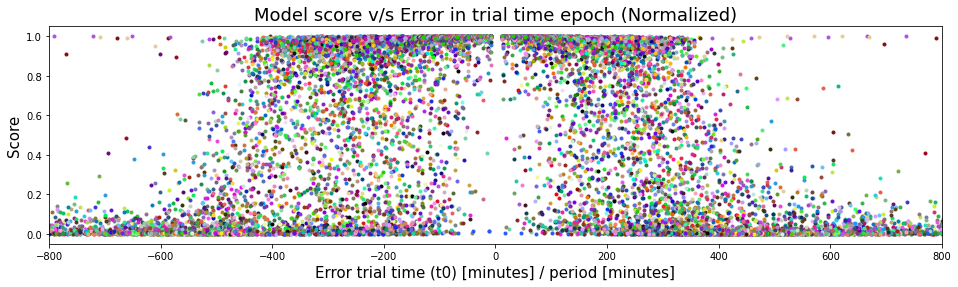

In [12]:

fig = plt.figure(figsize=(16, 4)) 
ax = fig.add_subplot(1, 1, 1)
plt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial time (t0) [minutes] / period [minutes]", fontsize = 15)
plt.xlim([-800, 800])

#np.random.seed(34324)


period_list = []
for i in range(N): # N
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    period_list.append(period)
    
#np.random.seed(34324)
np.random.seed(34329)
for i in np.argsort(period_list):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    plt.plot(np.array(difference_t0_list_full[i])/period, score_list_full[i], '.', c=np.random.rand(3,) , label = f'{np.round(period,2)}')
#plt.legend( title="Period", fontsize='small')    
plt.show()

In [13]:

#np.save("difference_t0_list_full.npy", difference_t0_list_full)
#np.save("score_list_full.npy", score_list_full)
#np.save("argsort period_list.npy", np.argsort(period_list))


In [22]:
period

4.3724229229969245

In [24]:

difference_t0_list_full_concat = np.array(difference_t0_list_full[0])/period_list[0]
score_list_full_concat = np.array(score_list_full[0])

for i in np.argsort(period_list[1:]):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print("period: ", period)
    
    difference_t0_list_full_concat = np.concatenate((difference_t0_list_full_concat, np.array(difference_t0_list_full[i])/period), axis=0)
    score_list_full_concat = np.concatenate((score_list_full_concat, score_list_full[i]), axis=0)
    
    #print((np.array(difference_t0_list_full[i])/period).shape)
    #print(np.array(score_list_full[i]).shape)


period:  1.3754358339814343
period:  4.767428921188153
period:  4.2265785407669005
period:  1.2928322016555251
period:  1.650480008054396
period:  3.6547898758273134
period:  3.7405297028823936
period:  3.814702871506756
period:  1.3718453577801344
period:  2.2745360585616683
period:  2.234551156259229
period:  2.408168803372338
period:  1.0953495100522648
period:  4.34253282599864
period:  2.190466916645794
period:  3.995568355740601
period:  4.255277962577309
period:  4.081366147592024
period:  1.821864167063667
period:  1.4784289856482085
period:  1.6089532372343895
period:  4.7042224088443865
period:  2.2180544069844434
period:  1.3576726324142223
period:  3.660402154721984
period:  2.865537528931558
period:  3.1341250209894462
period:  3.63932216377218
period:  1.7859291668568116
period:  4.667815958240563
period:  2.0134691756571423
period:  1.611481587137067
period:  3.3968947985823386
period:  4.487721383065482
period:  1.7574691534793003
period:  3.7419185917712814
period:  2.

period:  3.4450547372643405
period:  2.012080286768253
period:  1.2643130414692767
period:  2.495962141769244
period:  4.815676245124932
period:  2.852524240970314
period:  3.719426230352472
period:  1.727516225437563
period:  4.379673061902978
period:  2.691308341027141
period:  3.0703990865873765
period:  4.150108055707819
period:  2.56256451610737
period:  2.384432892892257
period:  1.7229652092345835
period:  2.744413246293657
period:  1.4955567780513286
period:  3.3439598673034854
period:  1.5748812142675346
period:  3.923965703393589
period:  3.4503138414749186
period:  3.989694303128145
period:  4.189856958348784
period:  2.794075050567303
period:  3.2625761915646665
period:  1.2391267587754762
period:  1.5791556681629288
period:  4.261765821806521
period:  1.104866193108106
period:  1.1981049591978772
period:  1.6130242784502342
period:  3.543941645987206
period:  1.953931390688888
period:  3.768410254862952
period:  1.1163837333434714
period:  1.6678298904382065
period:  1.890

In [25]:
print(difference_t0_list_full_concat.shape)
print(score_list_full_concat.shape)

(14500,)
(14500,)


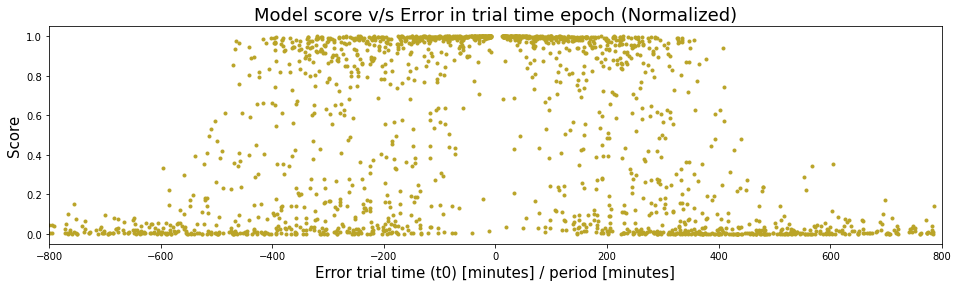

In [26]:
fig = plt.figure(figsize=(16, 4)) 
ax = fig.add_subplot(1, 1, 1)
plt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial time (t0) [minutes] / period [minutes]", fontsize = 15)
plt.xlim([-800, 800])
plt.plot(difference_t0_list_full_concat[:2000], score_list_full_concat[:2000], '.', c=np.random.rand(3,) )

plt.show()

In [27]:
difference_t0_list_full_concat.shape

(14500,)

In [28]:
from scipy.stats import gaussian_kde


In [29]:
# 500 random Examples

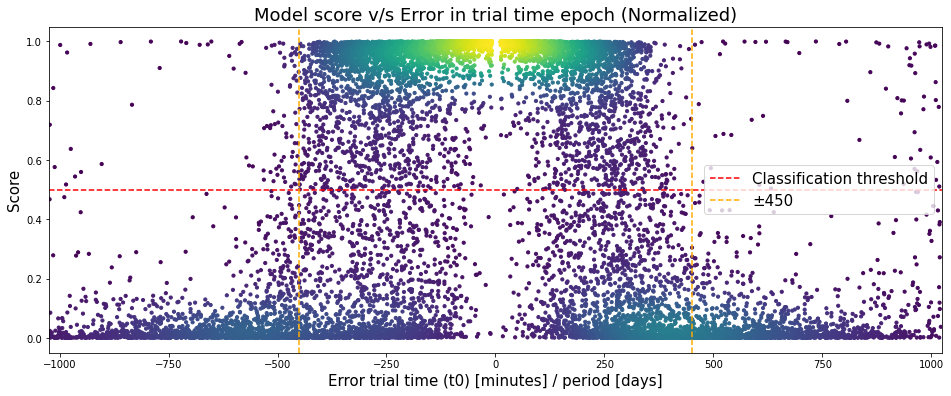

In [37]:
# Calculate the point density
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density
x = difference_t0_list_full_concat
y = score_list_full_concat
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in trial time epoch (Normalized)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial time (t0) [minutes] / period [days]", fontsize = 15)

plt.xlim([-1024, 1024])

plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold") 
plt.axvline(x = -450, color = '#ffaa00', linestyle = '--', label = "±450") 
plt.axvline(x = 450, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=10)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()

In [31]:
x.shape

(14500,)

In [32]:
mean_x = []
mean_y = []
for j, difference_t0 in  enumerate(range(-1440, 1440, 100)):
    print(difference_t0)
    
    #sum = 0
    #for i in range(N):
    #    #print(score_list_full[i][j])
    #    sum+=score_list_full[i][j]
    
    score_ = []
    for i in range(N):
        score_.append(score_list_full[i][j])
    
    mean_x.append(difference_t0)
    mean_y.append(np.mean(score_))

-1440
-1340
-1240
-1140
-1040
-940
-840
-740
-640
-540
-440
-340
-240
-140
-40
60
160
260
360
460
560
660
760
860
960
1060
1160
1260
1360


In [33]:
np.array(score_list_full).shape

(500, 29)

In [34]:
print(len(mean_x))
print(len(mean_y))

29
29


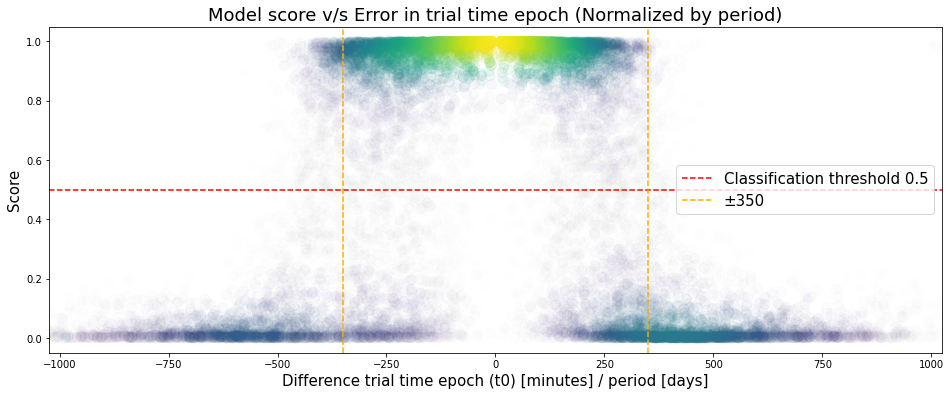

In [38]:
# Calculate the point density
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density
x = difference_t0_list_full_concat
y = score_list_full_concat
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in trial time epoch (Normalized by period)", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Difference trial time epoch (t0) [minutes] / period [days]", fontsize = 15)

plt.xlim([-1024, 1024])

plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
plt.axvline(x = -350, color = '#ffaa00', linestyle = '--', label = "±350") 
plt.axvline(x = 350, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=100, alpha=30*z)


#plt.plot(mean_x, mean_y, '-', c=np.random.rand(3,) )

#fig.colorbar(density, label='Number of points per pixel')
plt.show()

## Experimento 2

¿Cuanta diferencia en periodo es suficiente para que el modelo no detecte el tránsito?

Resultados:

In [80]:
print(len(range(-360, 360, 40)))
for difference_p0 in range(-360, 360, 40):
    print(difference_p0)
    #difference_p0/1440

18
-360
-320
-280
-240
-200
-160
-120
-80
-40
0
40
80
120
160
200
240
280
320


In [12]:
def period_experiment(index, plot = False):

    difference_t0 = 0 # days
    difference_p0 = 0 # 20/1440# days
    j = 0
    
    query_index = data_labeled_selected[data_labeled_selected["index"] == index]

    #print(query_index)

    filename = query_index[query_index["view"] == "Curve"]["filename"].values[0]

    folder = "../GeneratedSamples"

    
    data_curve = np.load(f"{folder}/{filename}")    
    
    if (plot):
        plt.title(f"Curve", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
        plt.show()

        filename_phasefold = query_index[query_index["view"] == "PhaseFold"]["filename"].values[0]
        data_curve_phasefold = np.load(f"{folder}/{filename_phasefold}")    
        plt.title(f"Phase fold", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve_phasefold[0, :], data_curve_phasefold[1,:], 'b.')
        plt.show()

        print("period", query_index["period"].values[0])
        print("t0", query_index["t0"].values[0])
        print("star_radius, ", query_index["star_radius"].values[0])
        print("k, ", query_index["k"].values[0])
        print("aos, ",query_index["aos"].values[0])
        print("i", query_index["i"].values[0])



    difference_p0_list = []
    score_list = []

    for difference_p0 in  range(-360, 360, 40):

        difference_p0_list.append(difference_p0)
        difference_p0 = difference_p0/1440

        r_p = query_index["period"].values[0] + difference_p0 # days

        t0 = query_index["t0"].values[0] #

        r_a = query_index["aos"].values[0]
        star_radius = query_index["star_radius"].values[0]
        r_k = query_index["k"].values[0]
        r_i = query_index["i"].values[0]

        sma = (star_radius*R_sun*r_a).to(u.au).value # sma = sr * aos [AU]
        #print("sma [AU]: ", sma)
        planet_factor = r_k*star_radius*R_sun/R_jup # k = planet_radius/star_radius => planet_radius = k*radius_star
        #print("Radius planet (Rjup): ", planet_factor)
        transit_duration = calculate_transit_duration(sma = sma, rp = planet_factor, rs = star_radius, i = r_i, period = r_p).value
        #print("transit_duration: ", transit_duration)
        #print("aos: ", (sma * u.au).to(u.m).value/(R_sun*star_radius).value)


        #bin_width_factor_global = 1.2/201
        #bin_width_factor_local = 0.16
        bin_width_factor_global=5*1.2/201
        bin_width_factor_local=3*0.16

        t_ = data_curve[0, :]
        f_ =  data_curve[1, :]

        #t0 = np.min(t_)

        time_fold, flux_fold = phase_fold_and_sort_light_curve(t_, f_, r_p, t0)
        global_view_result = global_view(time_fold, flux_fold, r_p, bin_width_factor = bin_width_factor_global)
        local_view_result = local_view(time_fold, flux_fold, r_p, transit_duration, bin_width_factor = bin_width_factor_local)

        score = final_model.predict( [global_view_result.reshape(1,-1), local_view_result.reshape(1,-1) ] )[0][0][0]
        print("Prediction: ", score)
        score_list.append(score)
        
        if (plot):
            fig = plt.figure(figsize=(16, 4)) 
            ax = fig.add_subplot(1, 3, 1)
            plt.title(f"Curve", fontsize = 15)
            plt.ylabel("Relative Magnitude", fontsize = 13)
            plt.xlabel("HJD - 2456000.0", fontsize = 13)
            plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
            plt.gca().invert_yaxis() # invert y axis
            #plt.show()

            ax = fig.add_subplot(1, 3, 2)
            plt.title("PC - Global view. Score: {:.2f}\nDifference p0: {:.2f} [min]".format(score, difference_p0*1440), fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylabel("Normalized Brightness", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(global_view_result)), global_view_result, 'b.')
            #plt.show()

            ax = fig.add_subplot(1, 3, 3)
            plt.title(f"PC - Local view", fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(local_view_result)), local_view_result, 'b.')
            #plt.show()
        
    return difference_p0_list, score_list



20350


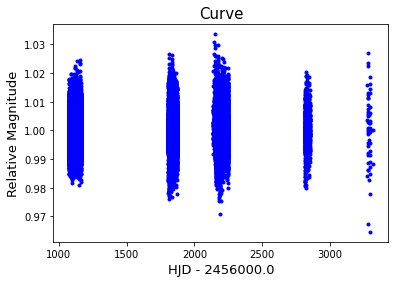

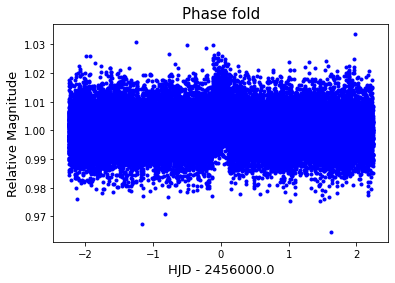

period 4.489471512787317
t0 1154.8571677871828
star_radius,  2.6
k,  0.0744860776588342
aos,  5.683128584119214
i 1.5362705455932133
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0014821577
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0061751083
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00048421795
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00066670805
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0070214868
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0032099276
1/1 [==============================] - 0s 14ms/step
Prediction:  0.082967766
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9525621
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9975768
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9997635
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9900142
1/1 [===============

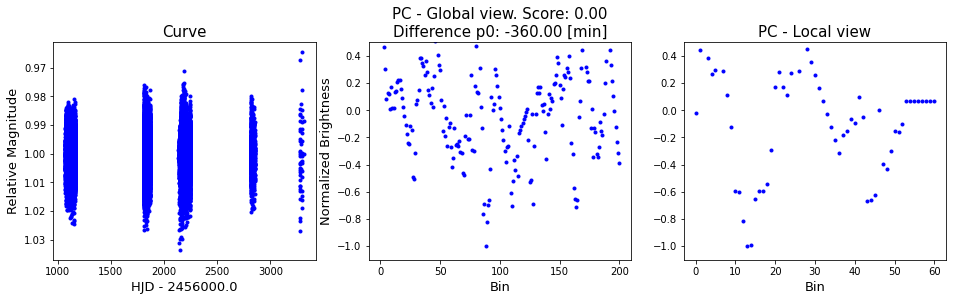

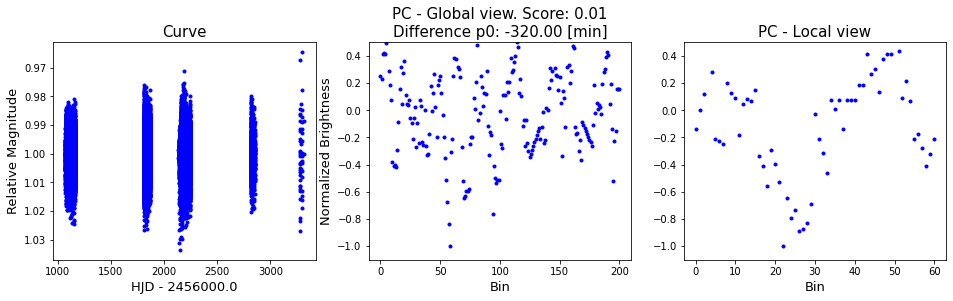

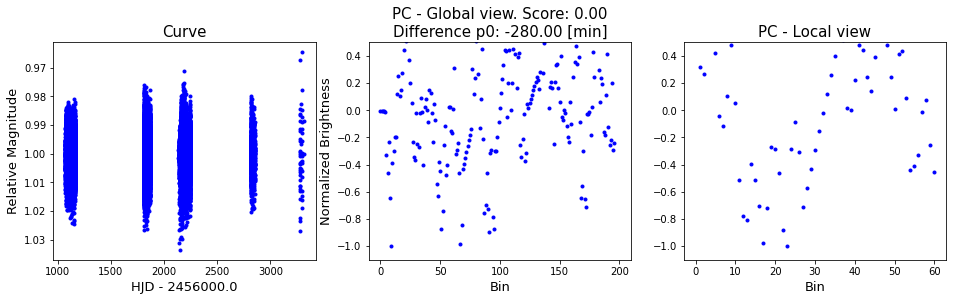

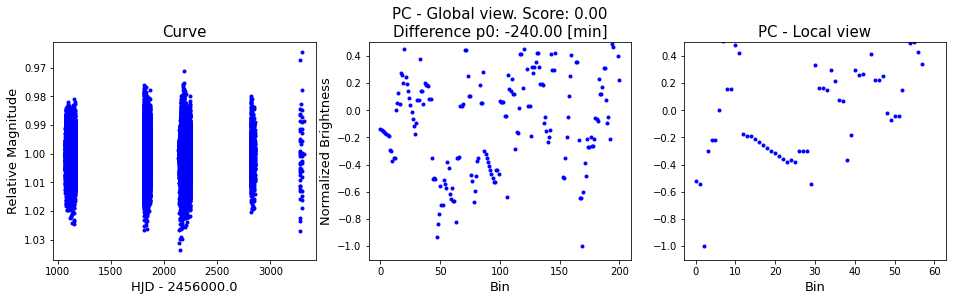

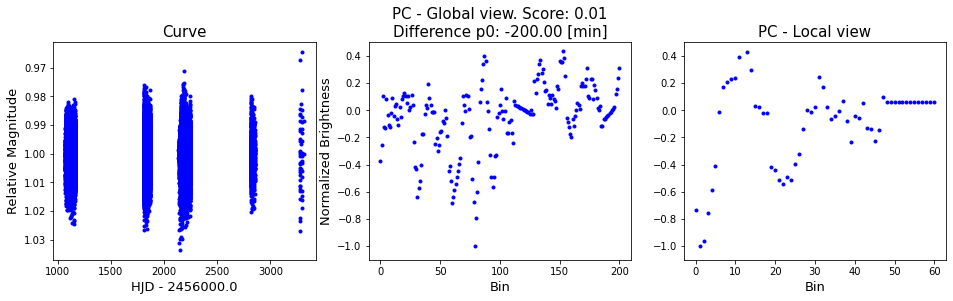

...

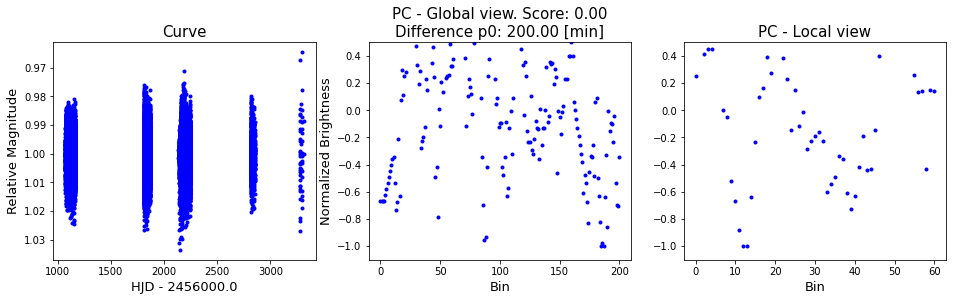

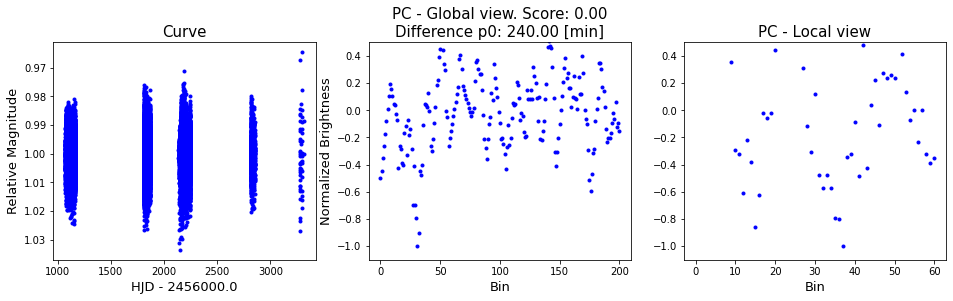

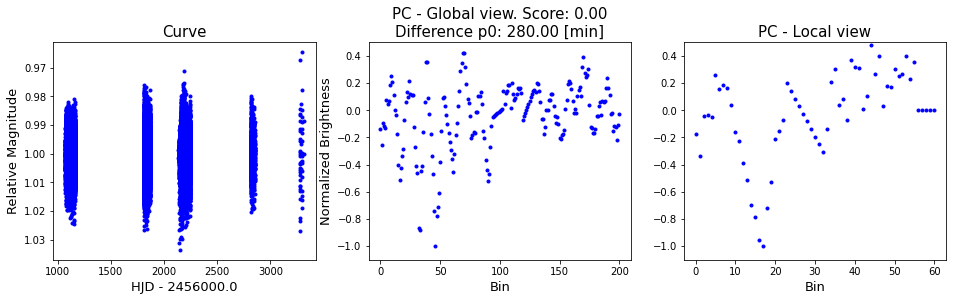

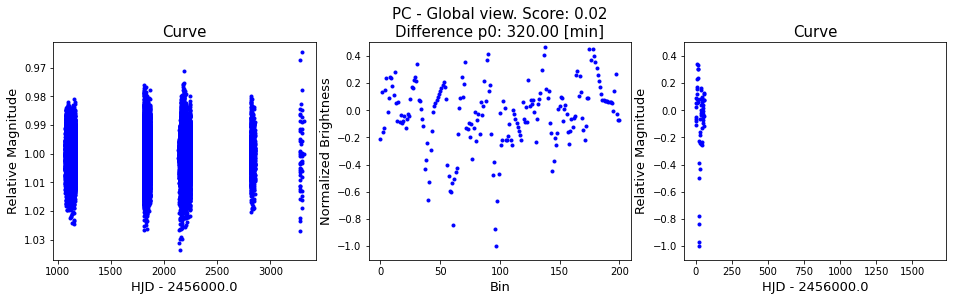

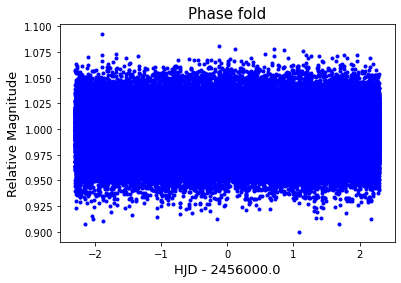

period 4.59656801772906
t0 1526.250156361005
star_radius,  3.01
k,  0.0612766456284944
aos,  5.185350942633748
i 1.545704789378608
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00014579207
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00015069352
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00035843937
1/1 [==============================] - 0s 12ms/step
Prediction:  4.8332648e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  8.5776315e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0005167747
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00046207383
1/1 [==============================] - 0s 13ms/step
Prediction:  7.261692e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  4.9780996e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99971753
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00095650036
1/1 [

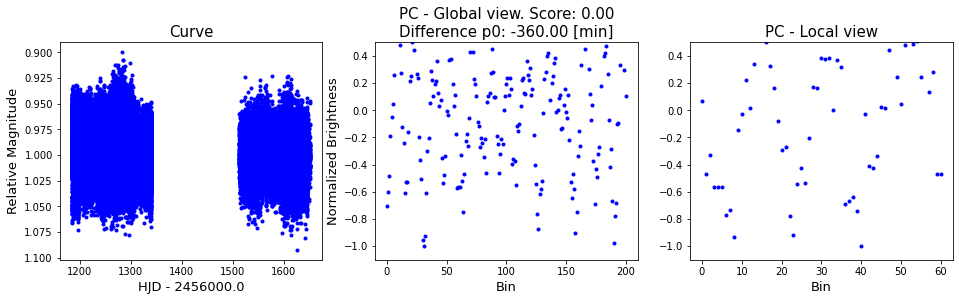

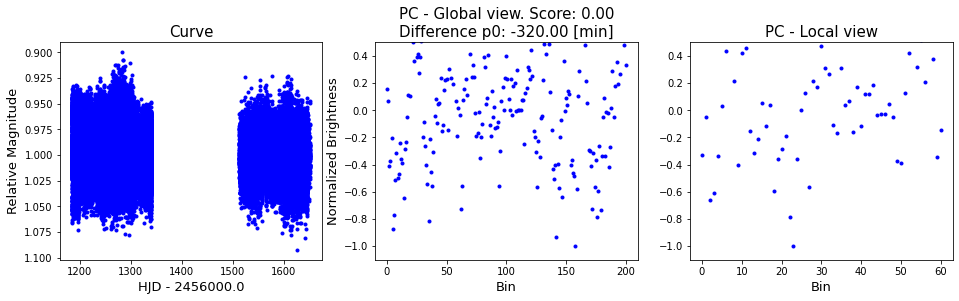

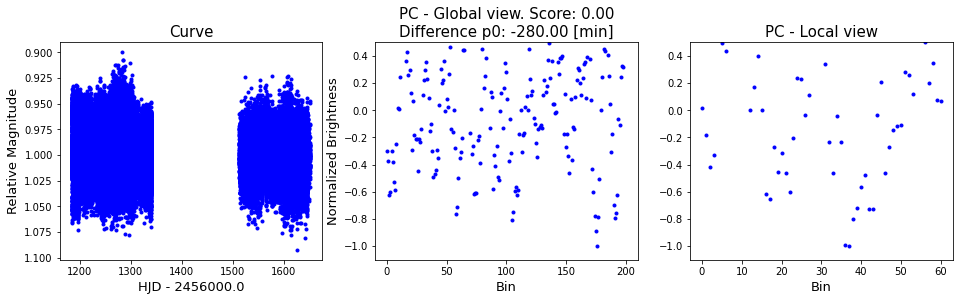

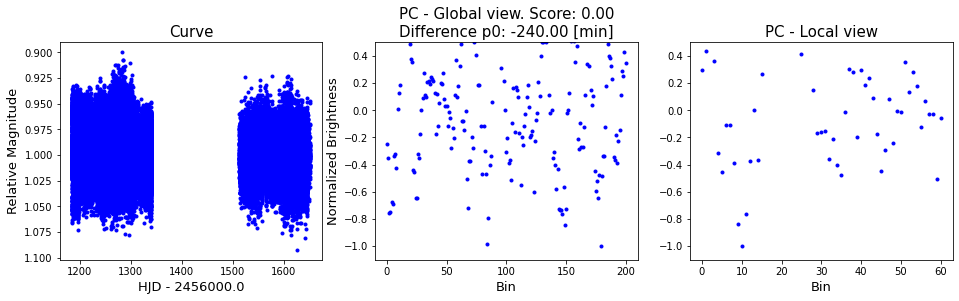

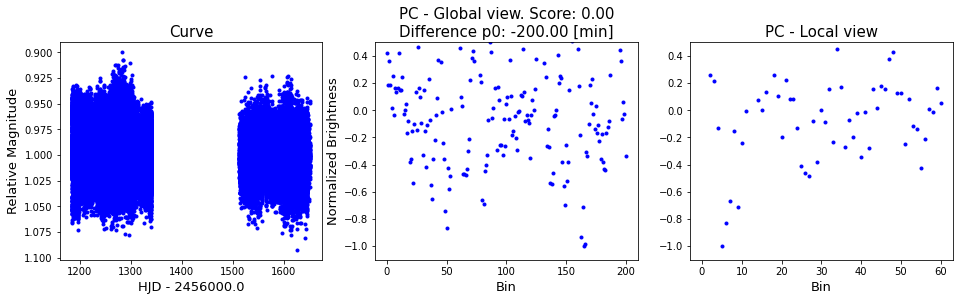

...

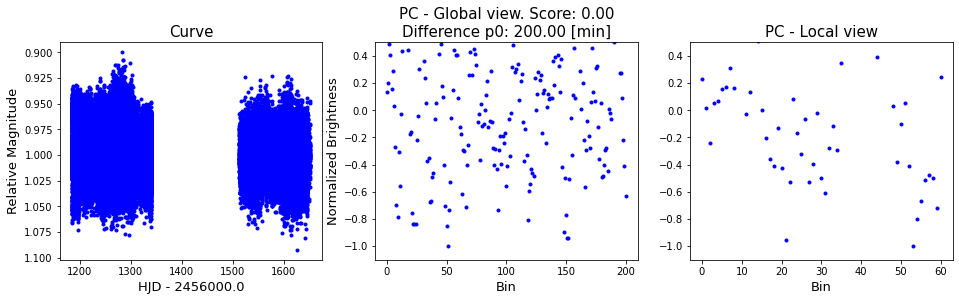

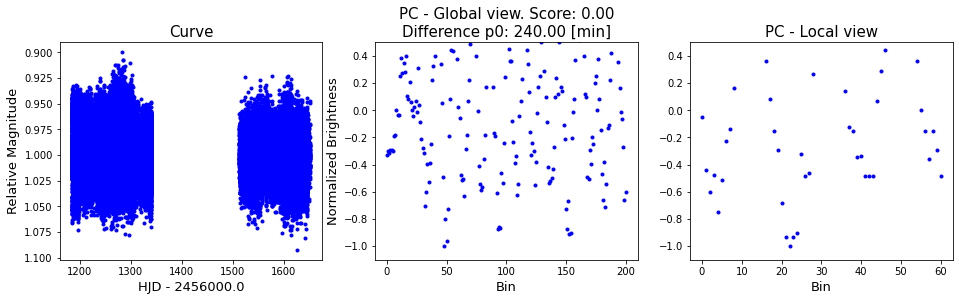

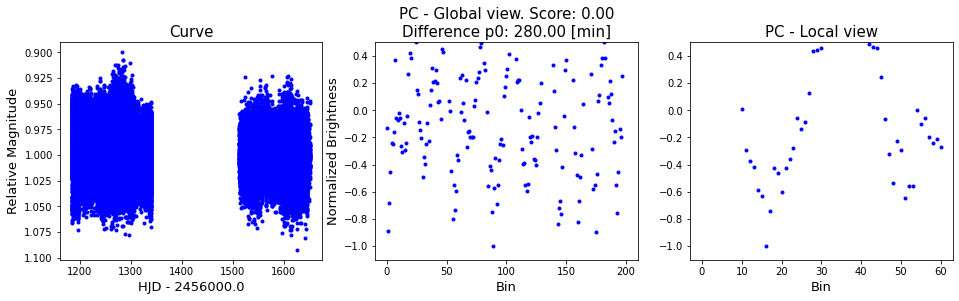

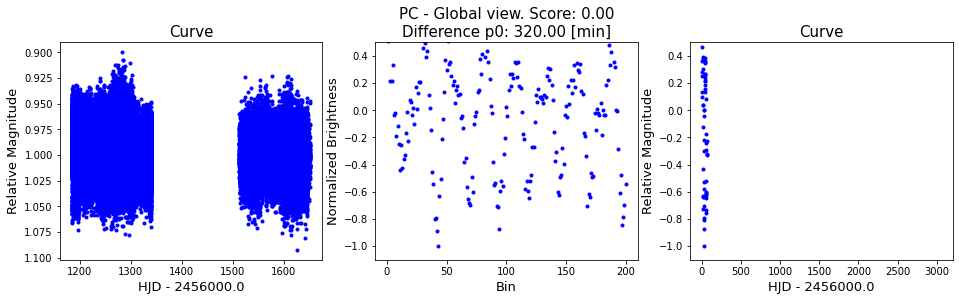

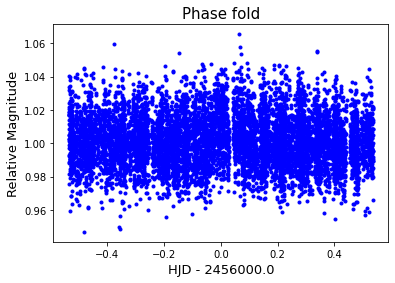

period 1.072515115114998
t0 3049.562833935412
star_radius,  1.782095
k,  0.0811772870276494
aos,  2.883913753182448
i 1.5490191347632307
1/1 [==============================] - 0s 14ms/step
Prediction:  4.3462333e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00021566298
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00015529465
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0003606574
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0011867497
1/1 [==============================] - 0s 15ms/step
Prediction:  2.2532655e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0010212857
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00013413974
1/1 [==============================] - 0s 12ms/step
Prediction:  1.4872864e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.995933
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00024646585
1/

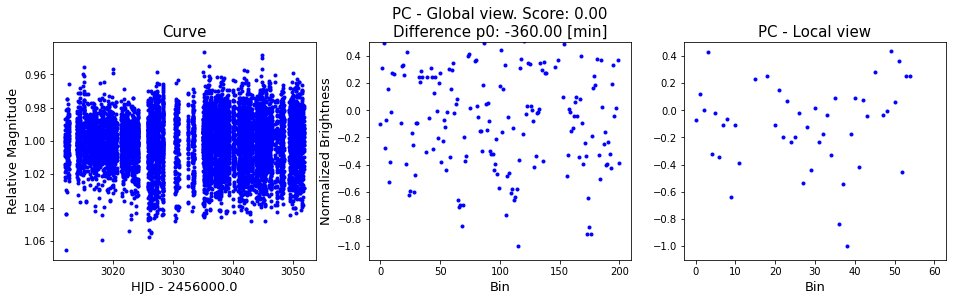

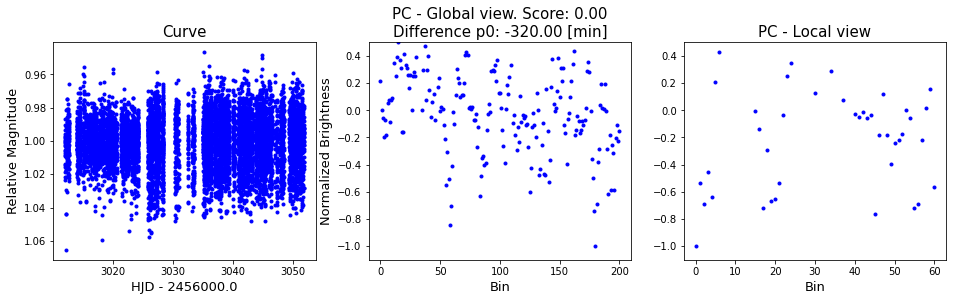

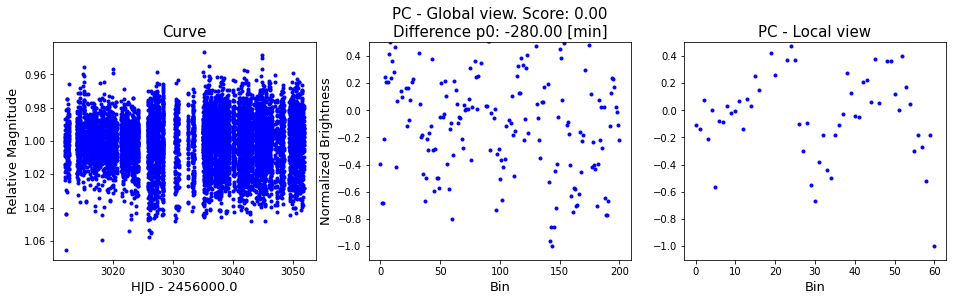

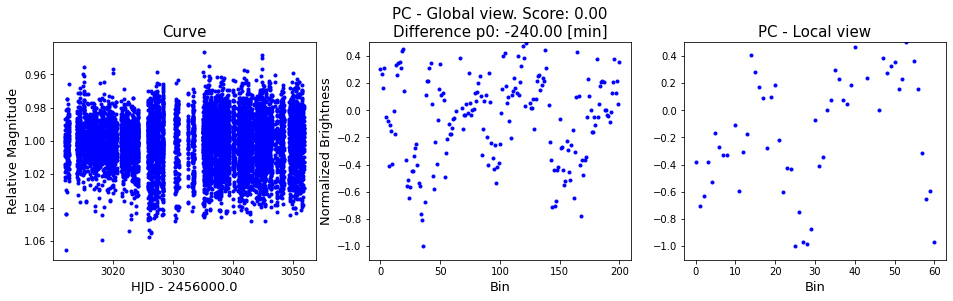

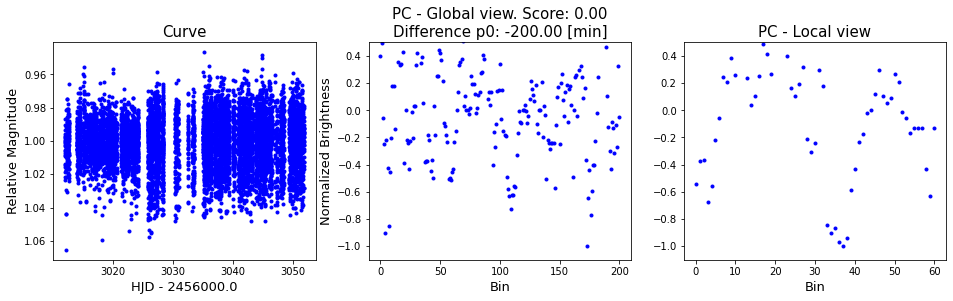

...

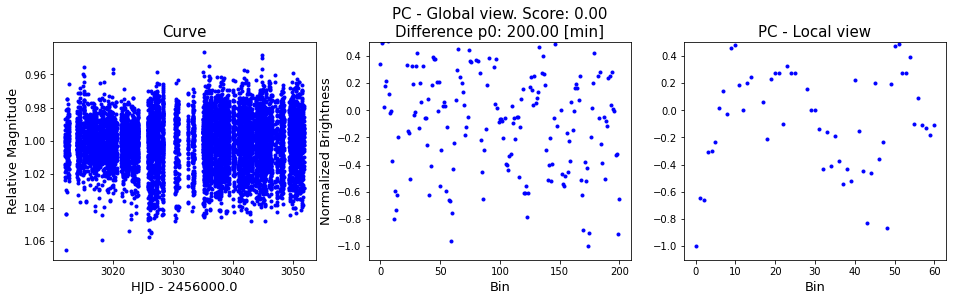

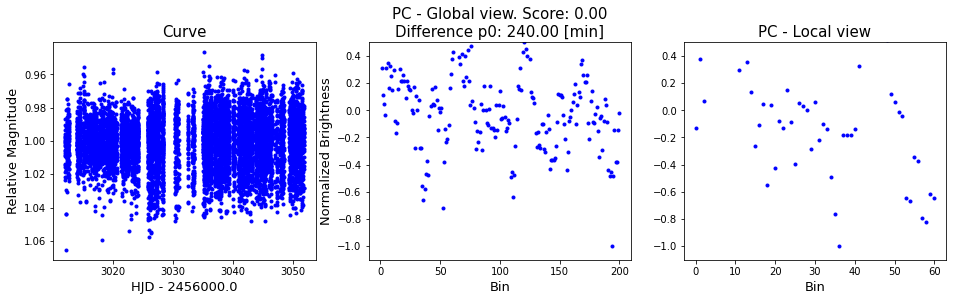

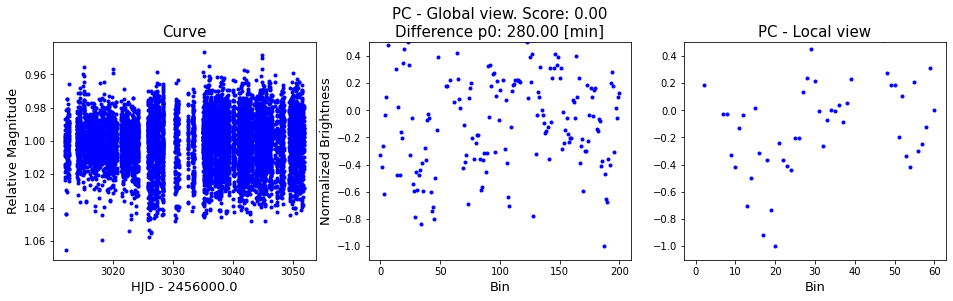

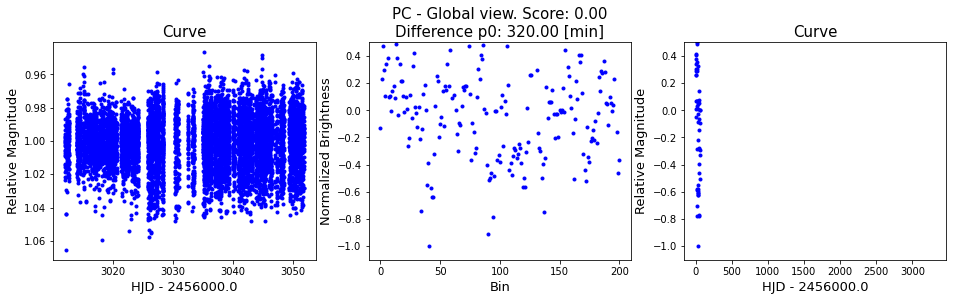

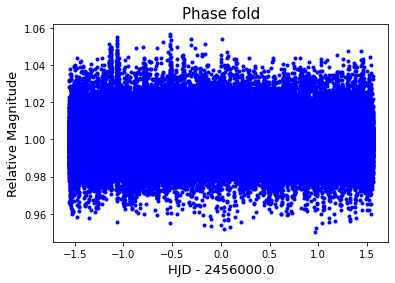

period 3.124362654772073
t0 1547.0913271481495
star_radius,  3.9
k,  0.0414989603705126
aos,  3.316093101306908
i 1.5433623207008569
1/1 [==============================] - 0s 15ms/step
Prediction:  0.021075223
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00023284351
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00026148884
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003646867
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003291646
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00063704554
1/1 [==============================] - 0s 13ms/step
Prediction:  0.002398218
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0017245765
1/1 [==============================] - 0s 15ms/step
Prediction:  2.4376743e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.8912437
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0003452832
1/1 [=====

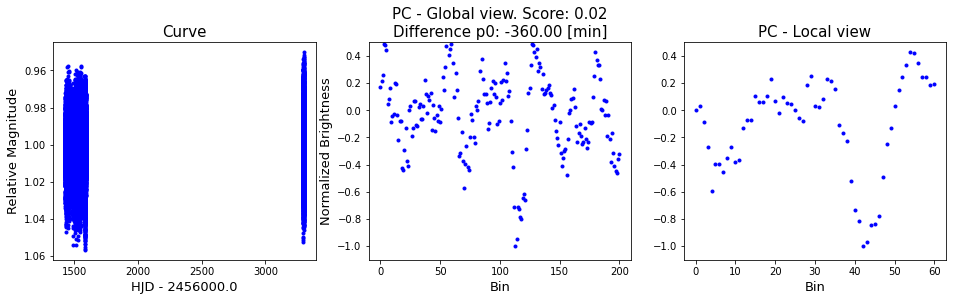

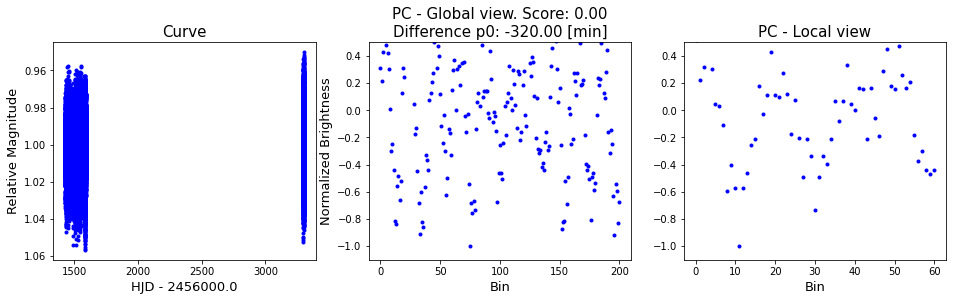

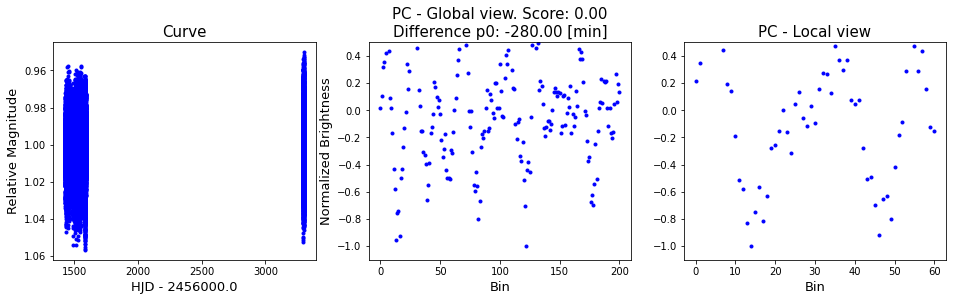

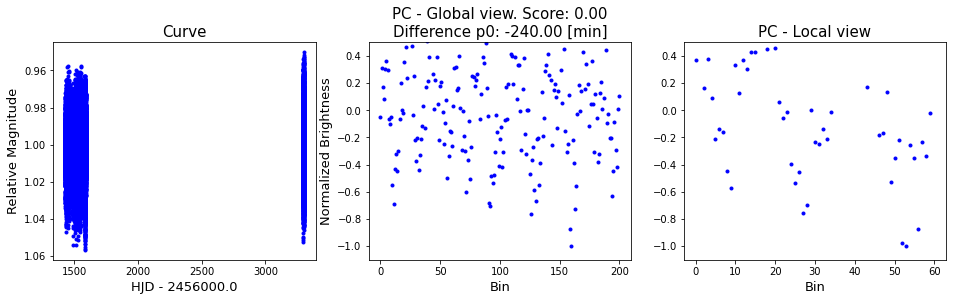

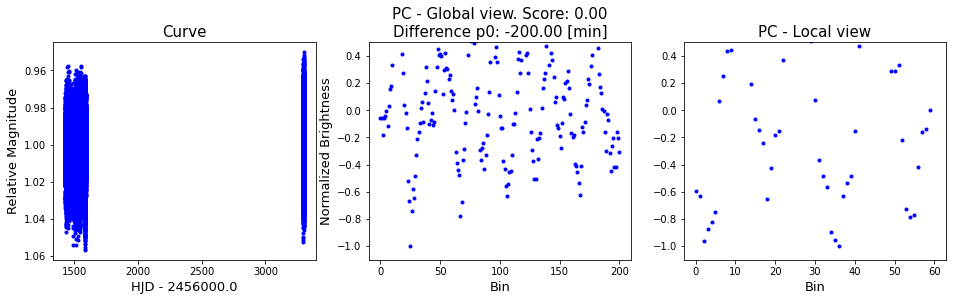

...

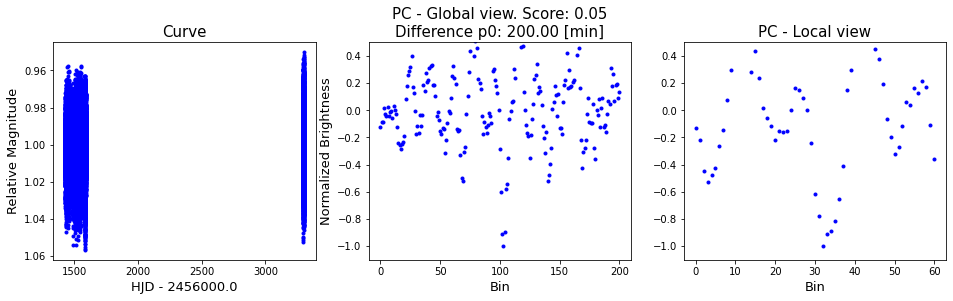

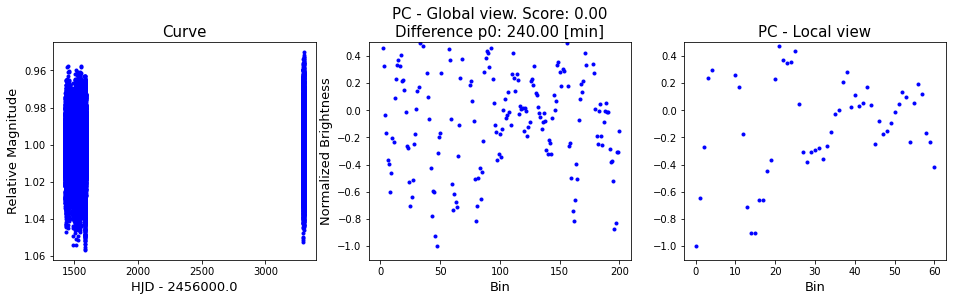

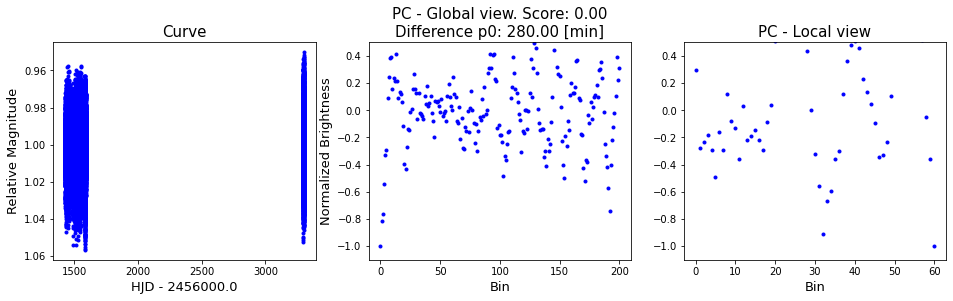

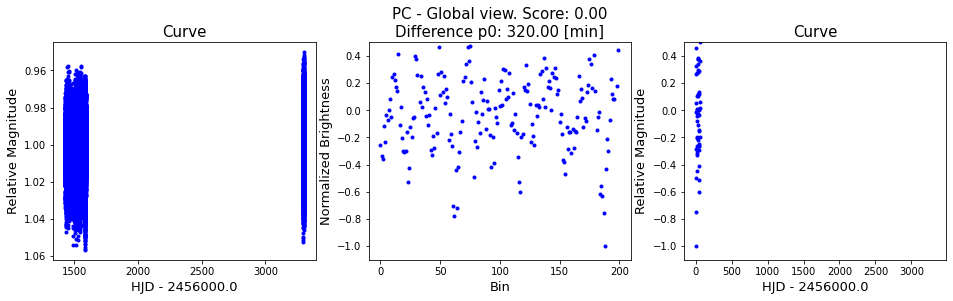

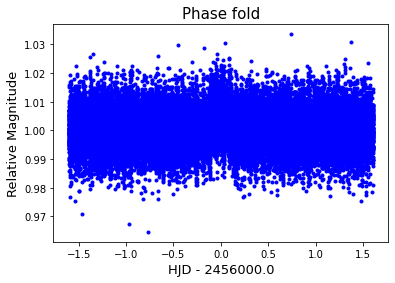

period 3.209984655647398
t0 1131.983731786985
star_radius,  2.6
k,  0.0639844469355801
aos,  4.544219557465971
i 1.5572019056579898
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0003303136
1/1 [==============================] - 0s 13ms/step
Prediction:  9.80318e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00066945027
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0014785819
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0007155252
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00047567656
1/1 [==============================] - 0s 14ms/step
Prediction:  0.010176201
1/1 [==============================] - 0s 14ms/step
Prediction:  0.11447371
1/1 [==============================] - 0s 15ms/step
Prediction:  0.4151024
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999884
1/1 [==============================] - 0s 12ms/step
Prediction:  0.8958246
1/1 [=================

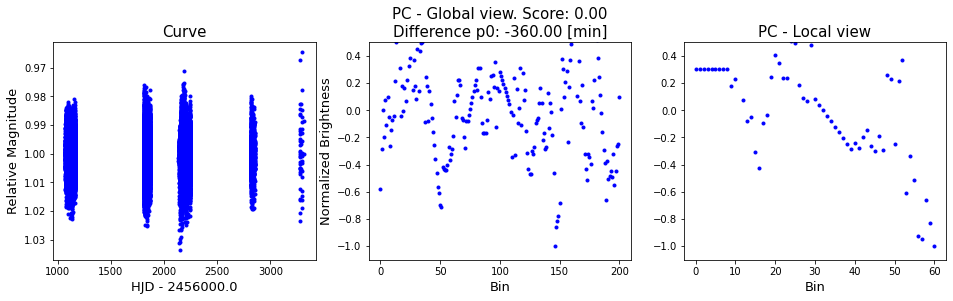

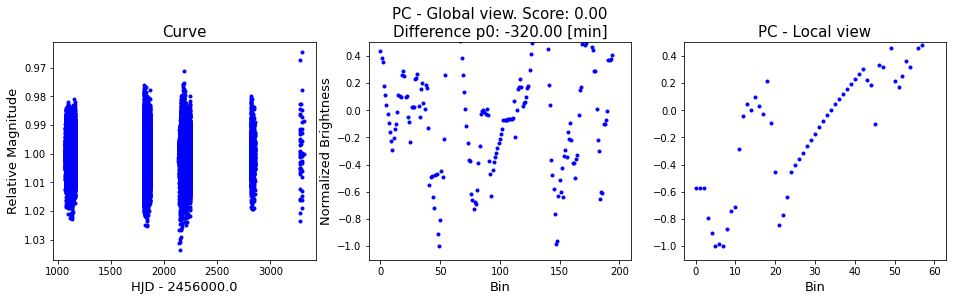

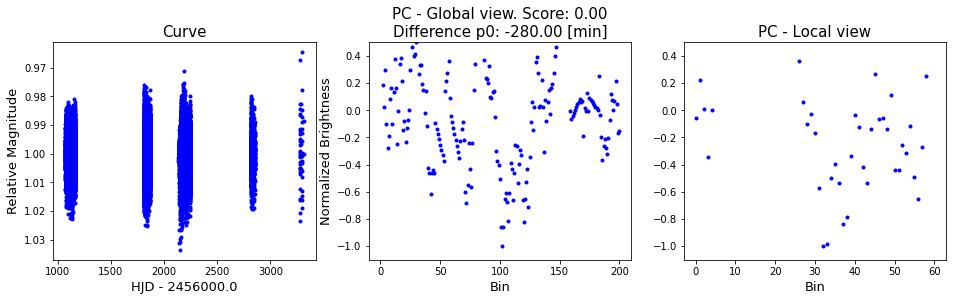

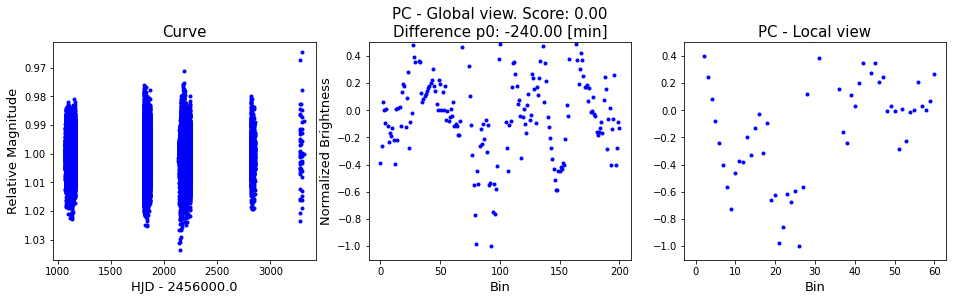

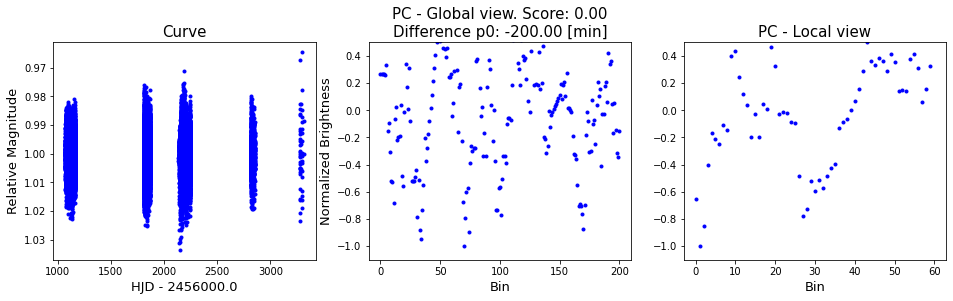

...

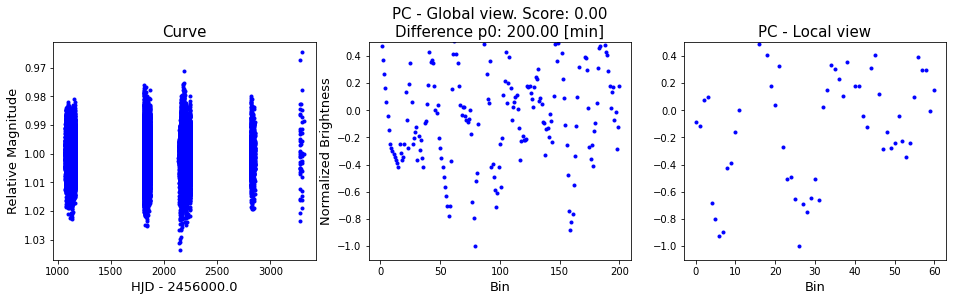

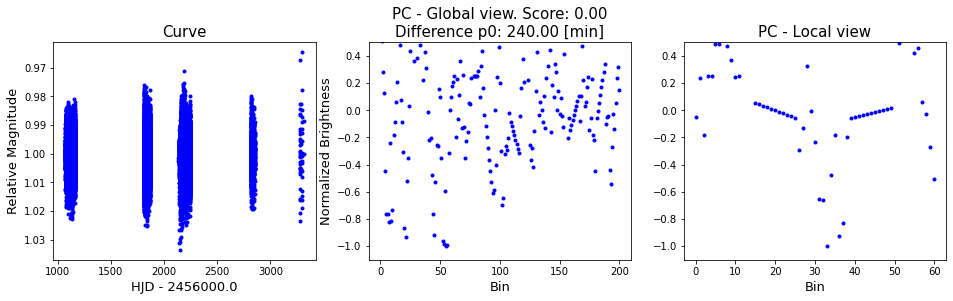

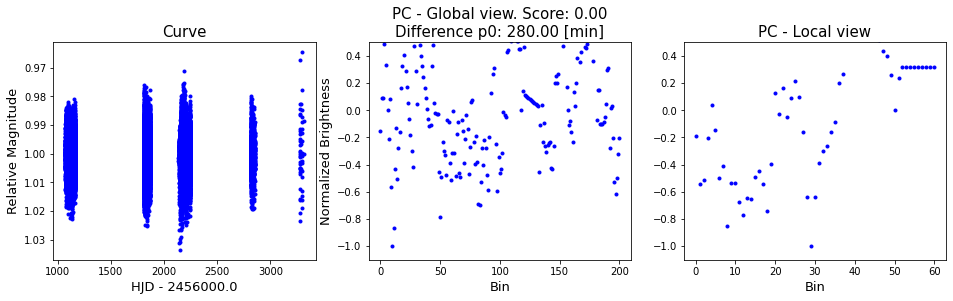

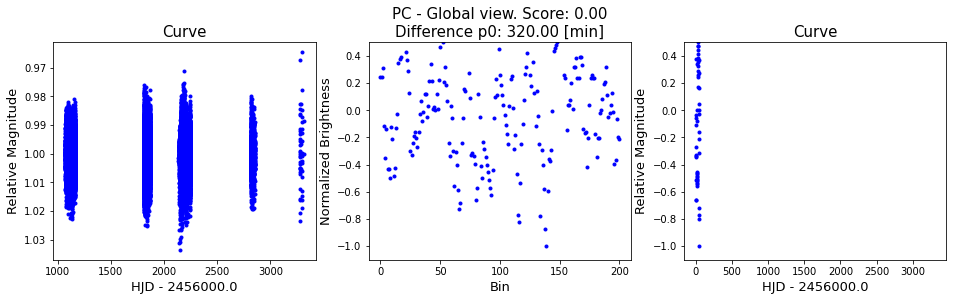

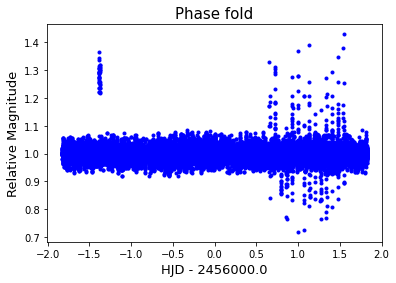

period 3.645167015117528
t0 1557.1307401481408
star_radius,  3.4
k,  0.0590440336602616
aos,  4.061824933480428
i 1.5500348785656726
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0005621203
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0065756366
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00012306639
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0003981592
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00018669602
1/1 [==============================] - 0s 22ms/step
Prediction:  0.007748051
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006005676
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0021344614
1/1 [==============================] - 0s 17ms/step
Prediction:  0.096940055
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99975955
1/1 [==============================] - 0s 14ms/step
Prediction:  0.036432333
1/1 [=======

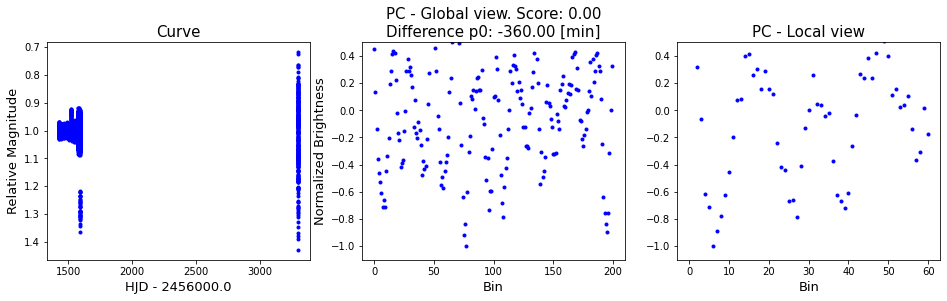

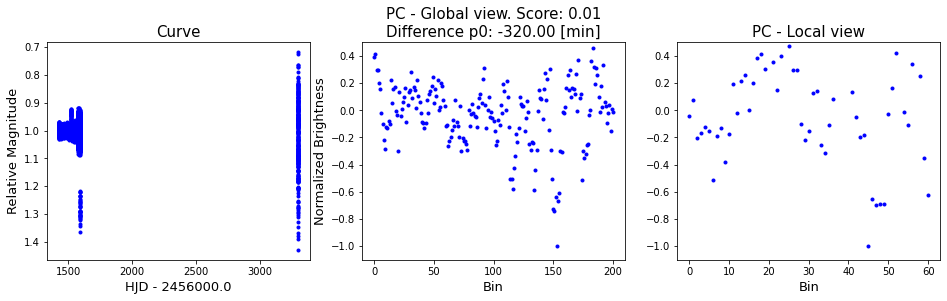

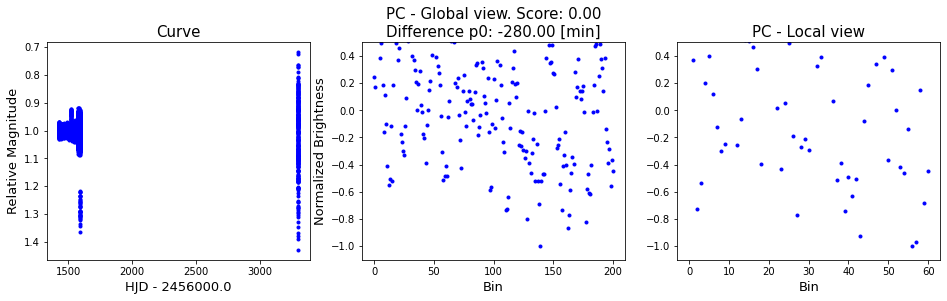

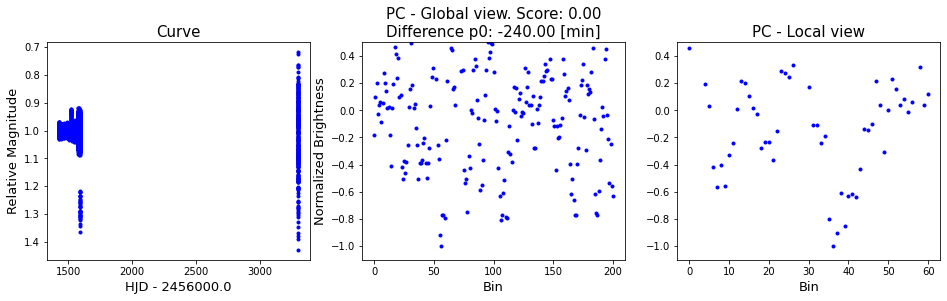

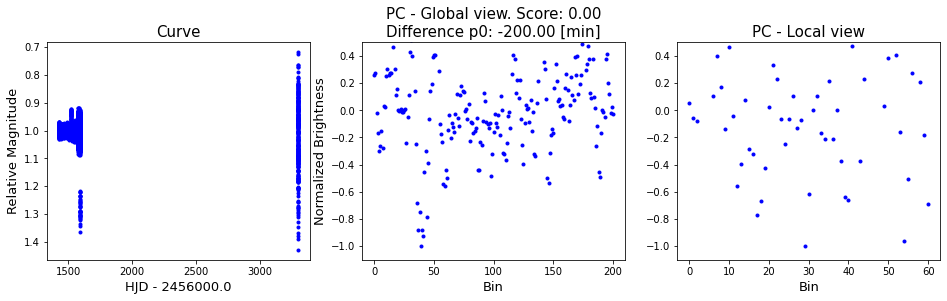

...

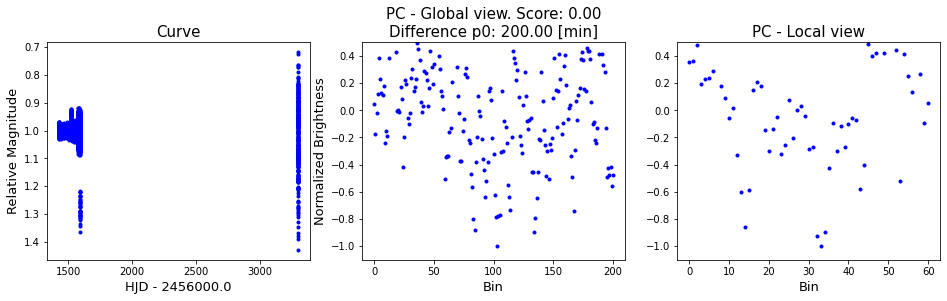

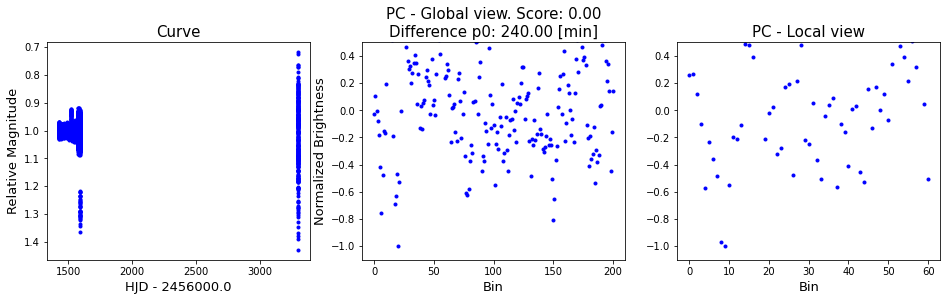

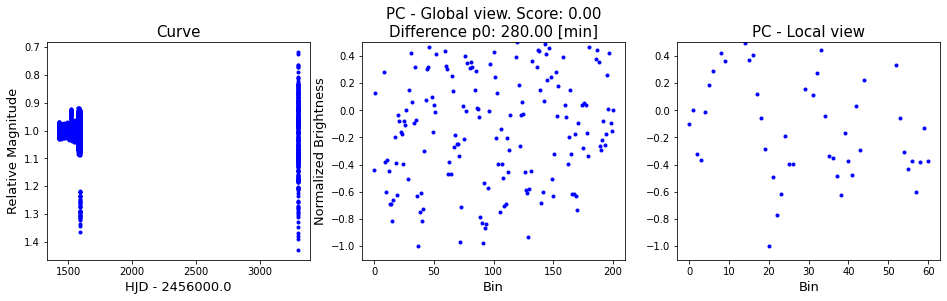

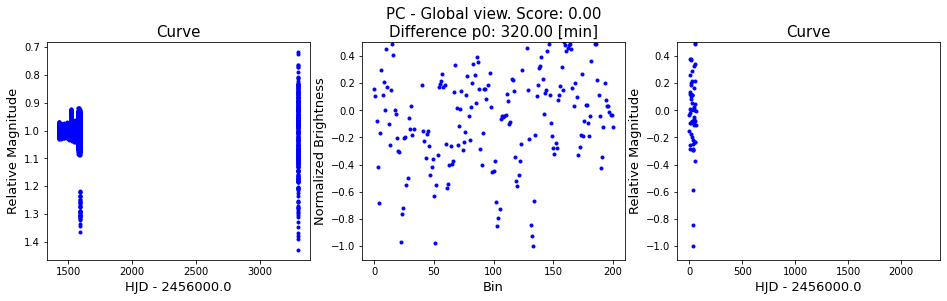

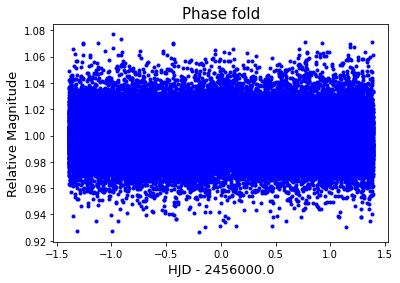

period 2.780839115447985
t0 1100.3955147869733
star_radius,  2.41
k,  0.0515920785745749
aos,  4.365920955474228
i 1.5694731021512975
1/1 [==============================] - 0s 18ms/step
Prediction:  0.00010795378
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00012354116
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0014598158
1/1 [==============================] - 0s 13ms/step
Prediction:  0.001253541
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00017536091
1/1 [==============================] - 0s 16ms/step
Prediction:  0.30500165
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00081117894
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00012836314
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0002484614
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998327
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00596019
1/1 [======

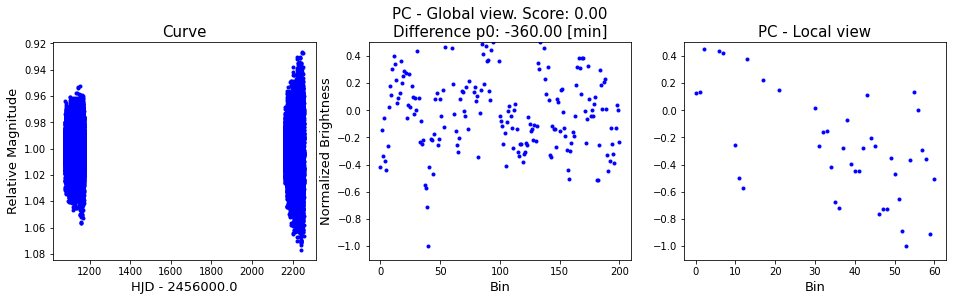

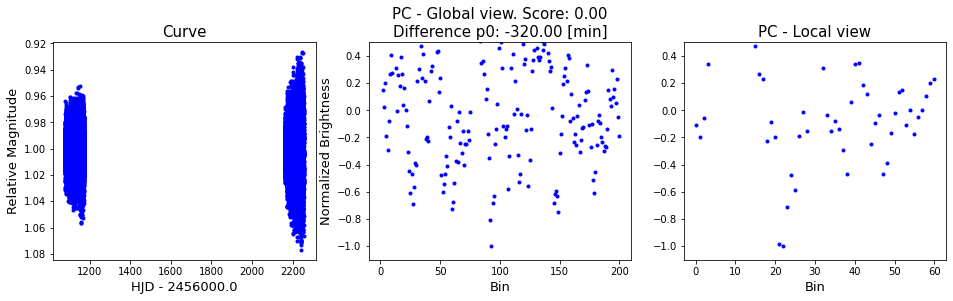

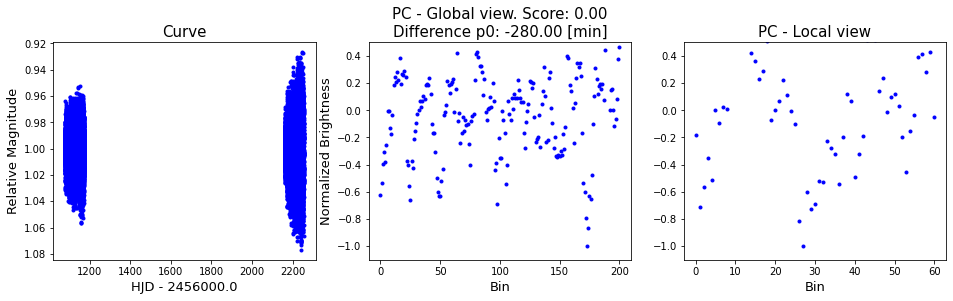

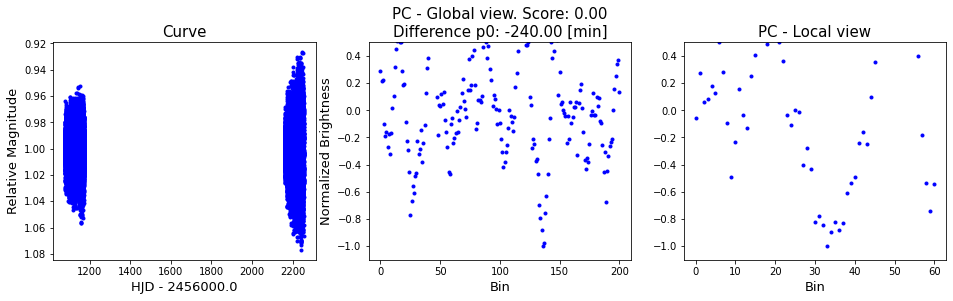

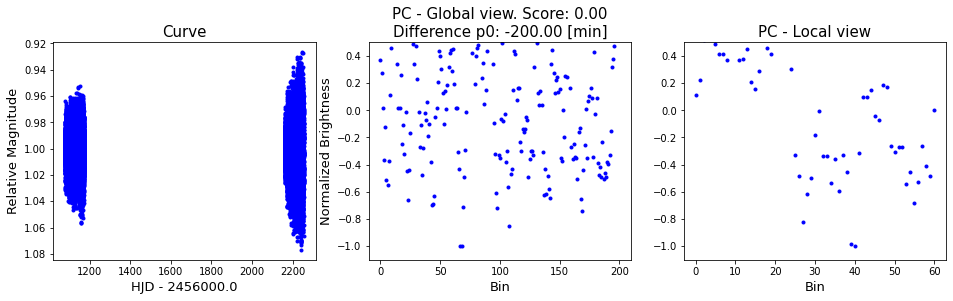

...

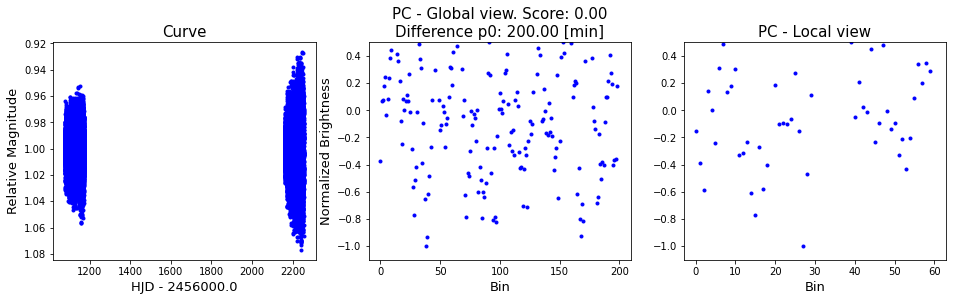

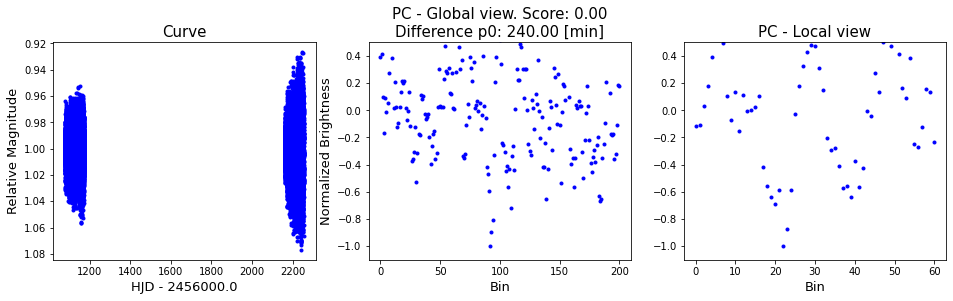

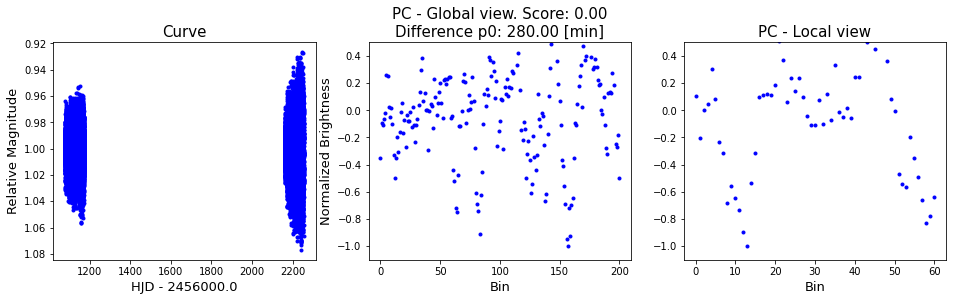

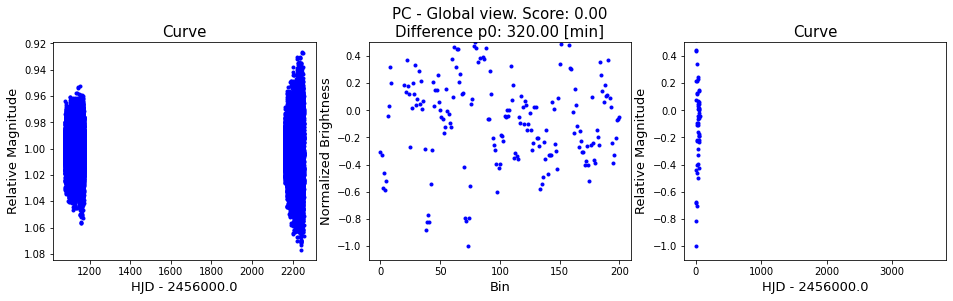

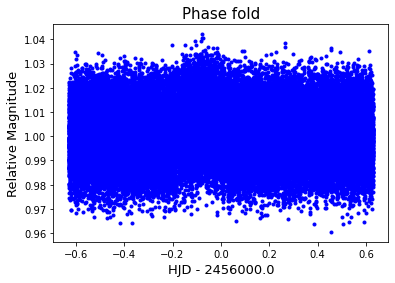

period 1.259180696411612
t0 3640.036134787168
star_radius,  2.5
k,  0.074901250959097
aos,  2.507993080492049
i 1.554286400765017
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0011079615
1/1 [==============================] - 0s 21ms/step
Prediction:  0.00021459984
1/1 [==============================] - 0s 19ms/step
Prediction:  0.00028652803
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00035408596
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00064242637
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006995847
1/1 [==============================] - 0s 16ms/step
Prediction:  4.382664e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0017270657
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00030306412
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99962384
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0038213169
1/1 [====

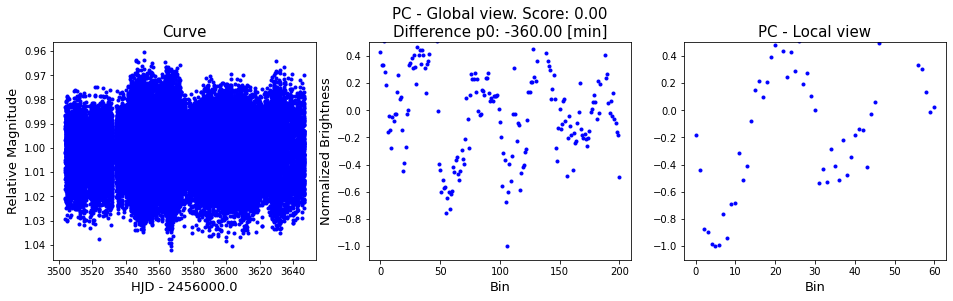

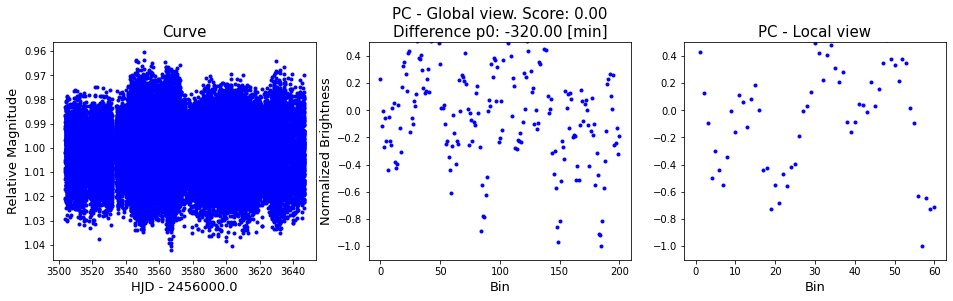

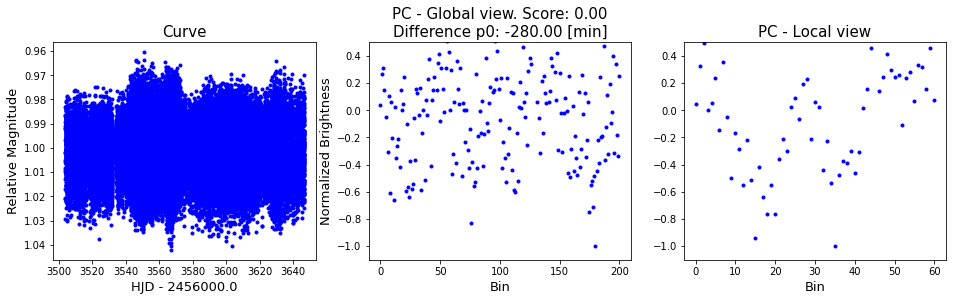

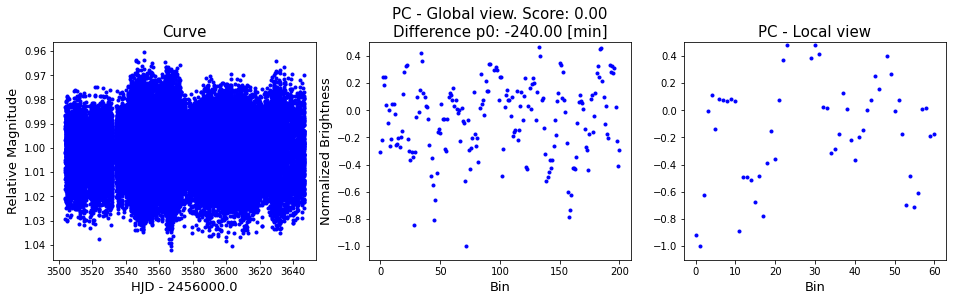

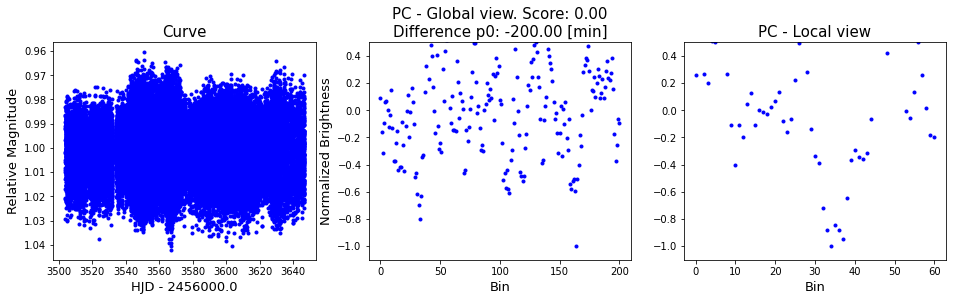

...

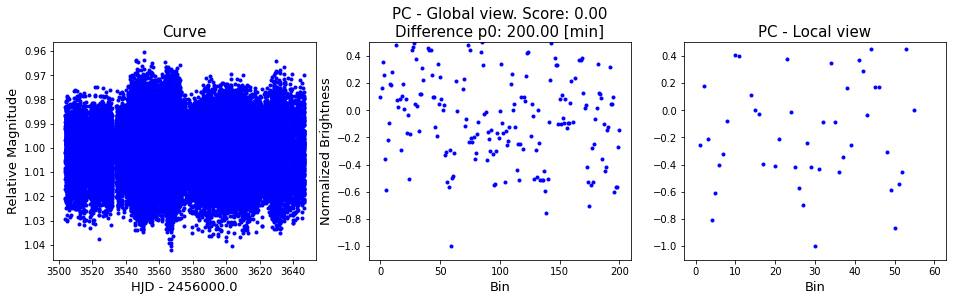

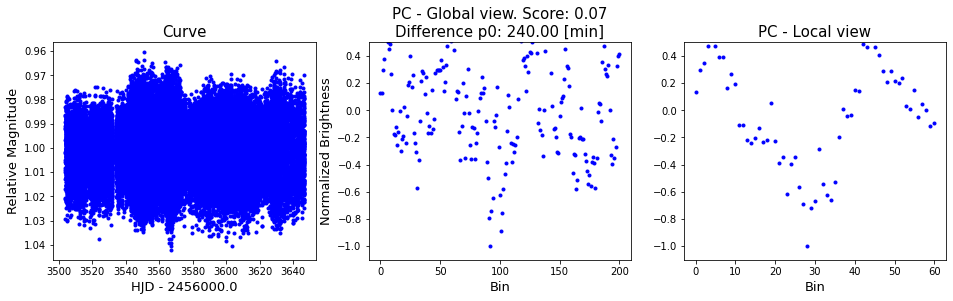

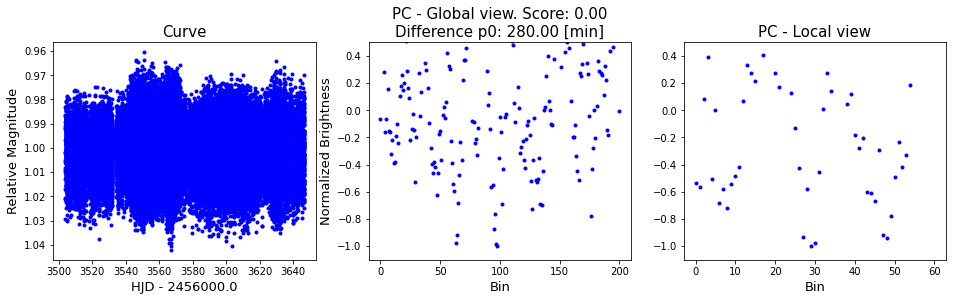

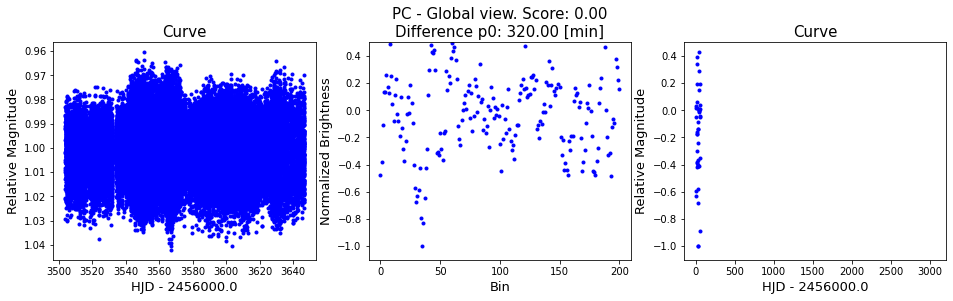

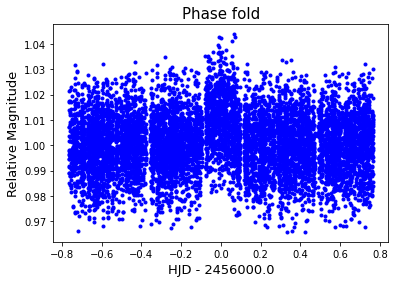

period 1.5305709882834406
t0 3022.269296935218
star_radius,  2.10283
k,  0.0936949837472309
aos,  3.2385768512604125
i 1.554952180304752
1/1 [==============================] - 0s 17ms/step
Prediction:  0.004316016
1/1 [==============================] - 0s 14ms/step
Prediction:  0.008718321
1/1 [==============================] - 0s 15ms/step
Prediction:  0.38199624
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0027309083
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00013402723
1/1 [==============================] - 0s 13ms/step
Prediction:  0.045537874
1/1 [==============================] - 0s 15ms/step
Prediction:  0.1289326
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0022229298
1/1 [==============================] - 0s 13ms/step
Prediction:  0.3251391
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9998806
1/1 [==============================] - 0s 14ms/step
Prediction:  0.7749154
1/1 [================

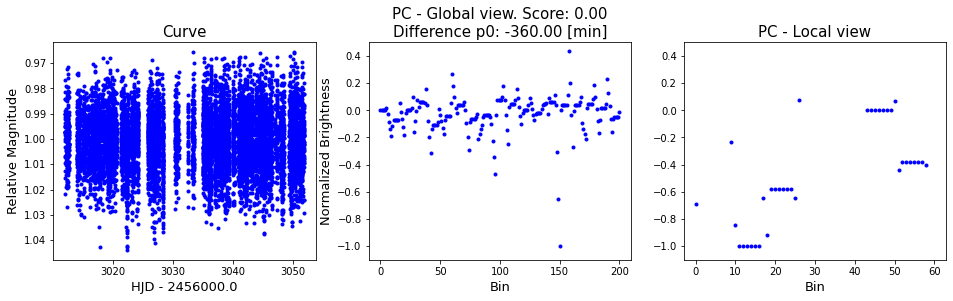

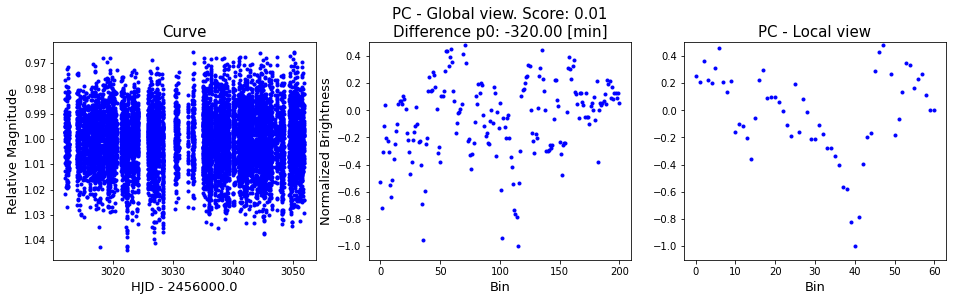

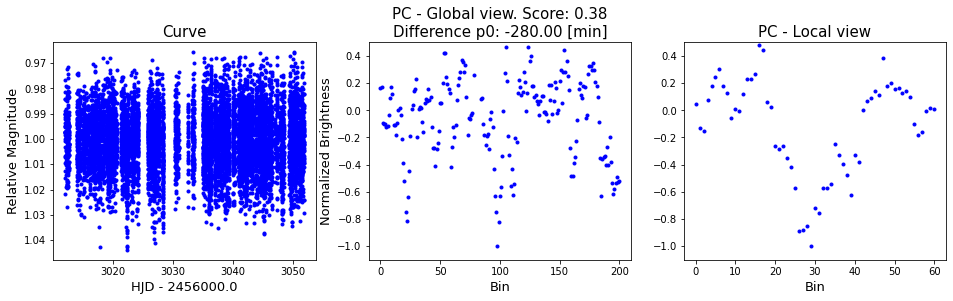

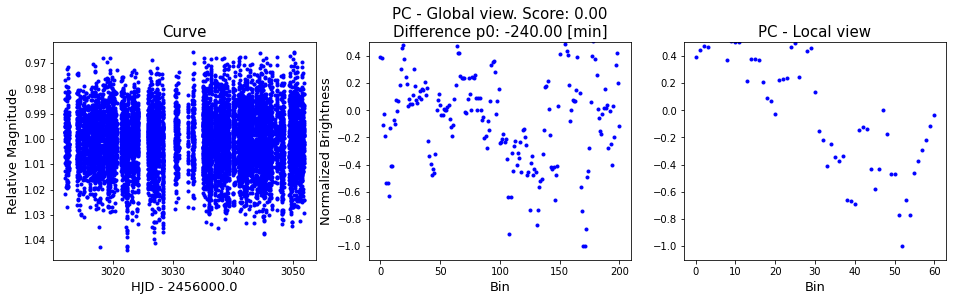

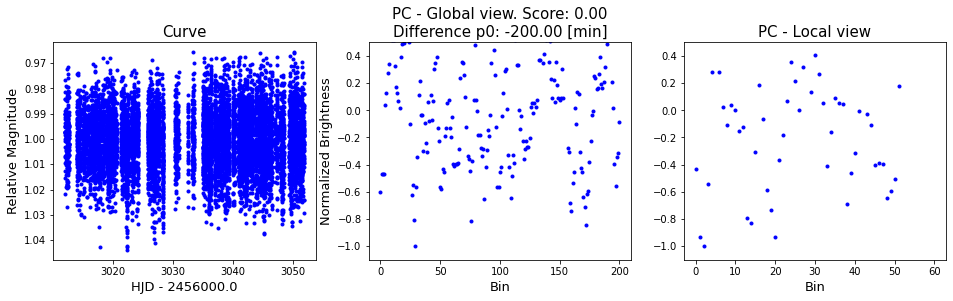

...

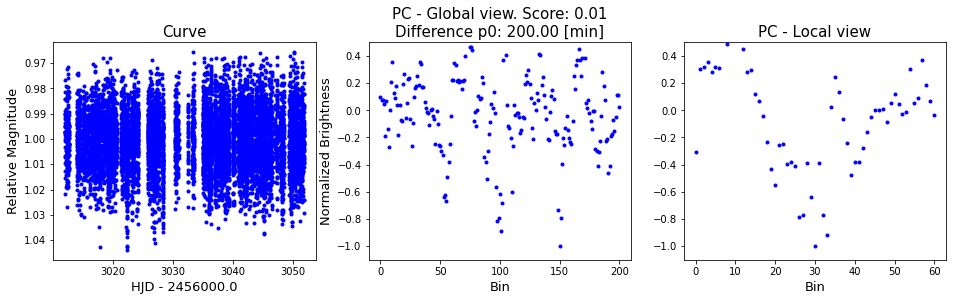

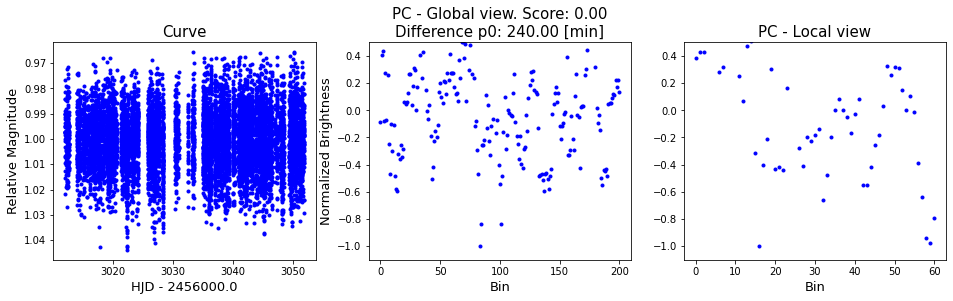

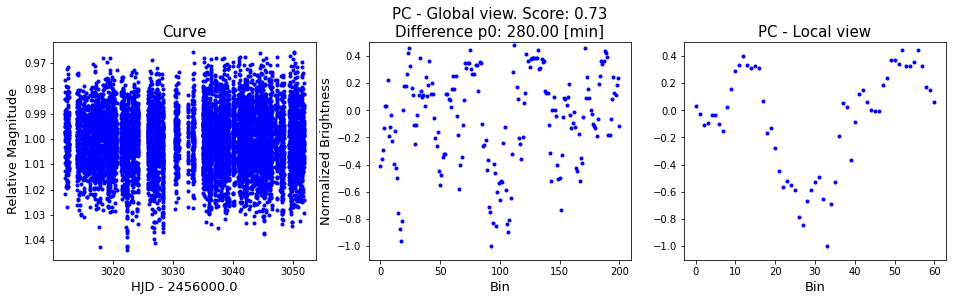

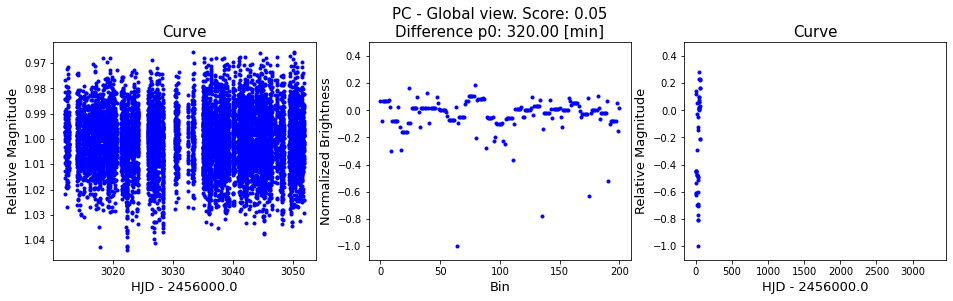

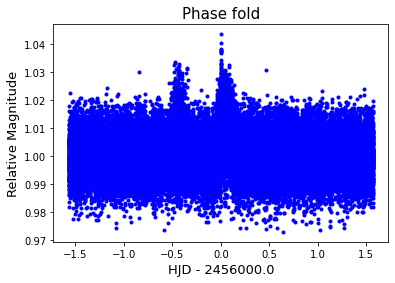

period 3.137743902998775
t0 2231.4182921481643
star_radius,  1.54416
k,  0.1141992297016239
aos,  6.556623550705113
i 1.570068561181652
1/1 [==============================] - 0s 15ms/step
Prediction:  7.631287e-05
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0008229221
1/1 [==============================] - 0s 12ms/step
Prediction:  0.006704212
1/1 [==============================] - 0s 18ms/step
Prediction:  0.00014703628
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0004419357
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00054910325
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0025257212
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0004115057
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0006855809
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99954724
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0034144626
1/1 [==

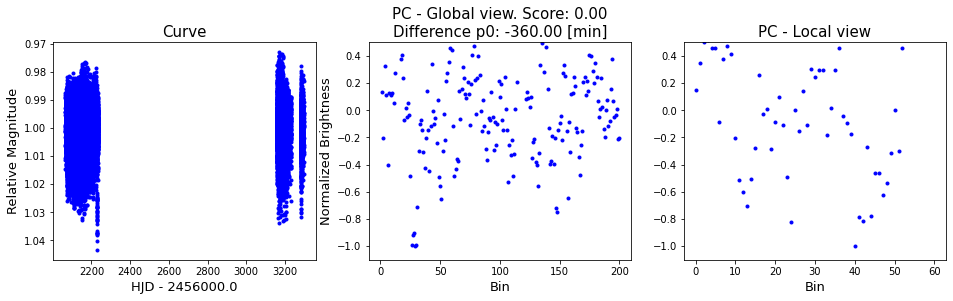

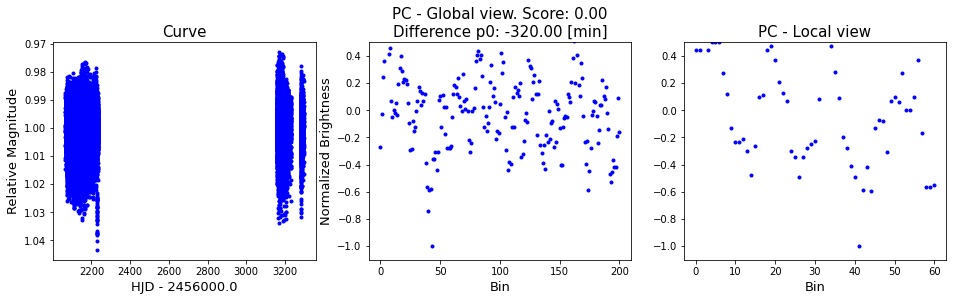

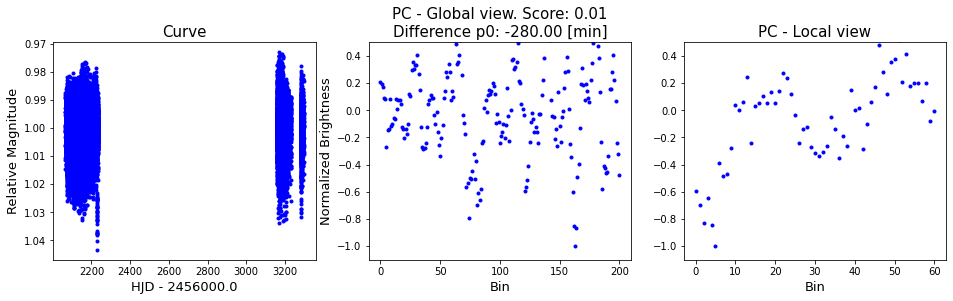

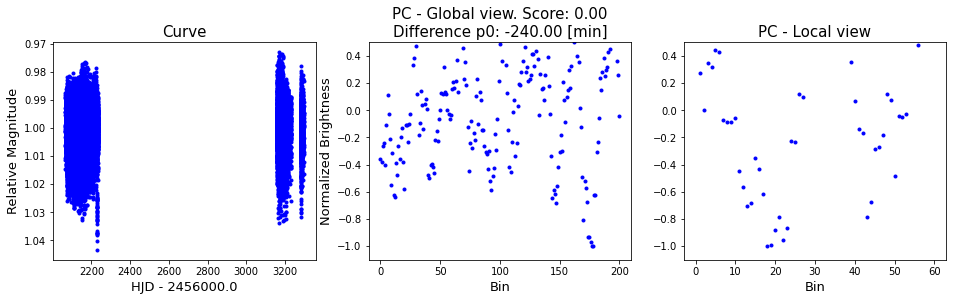

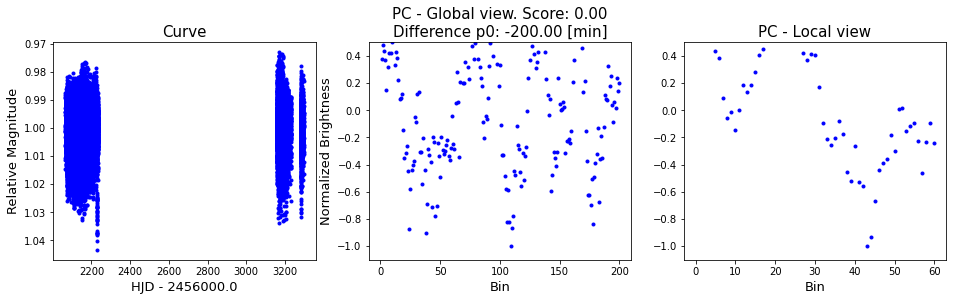

...

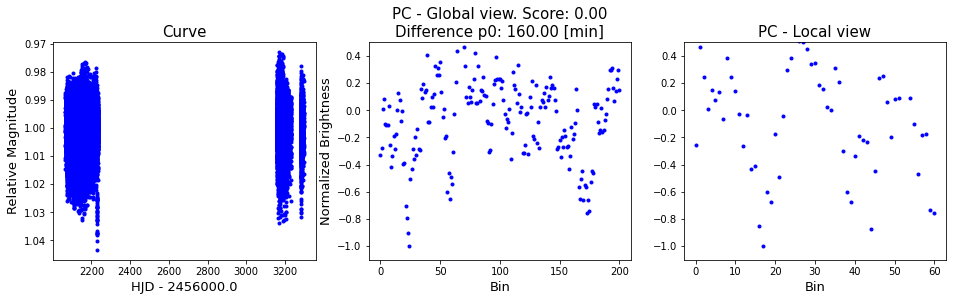

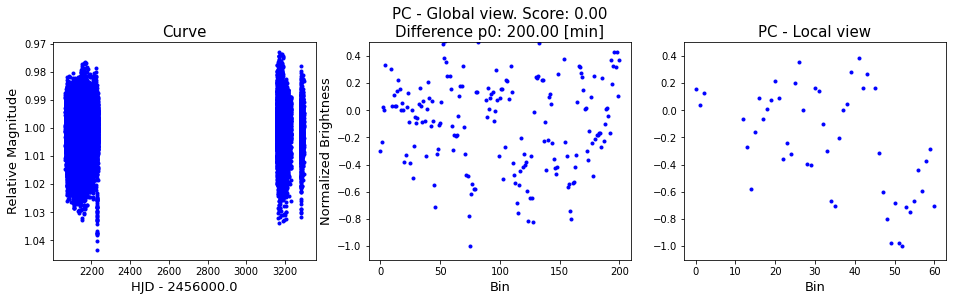

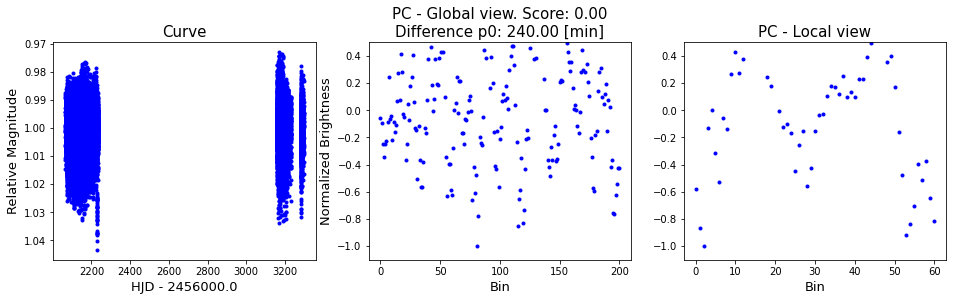

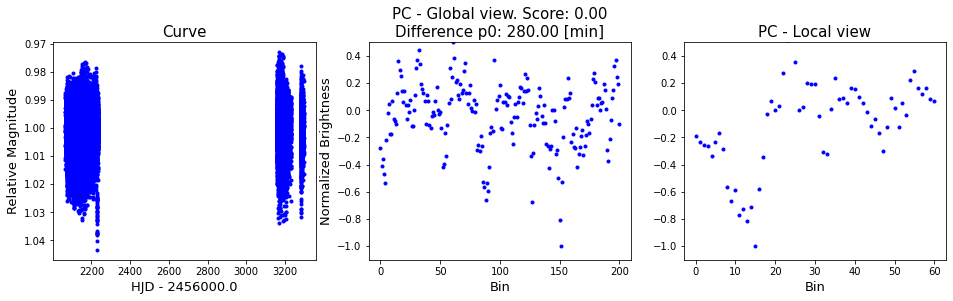

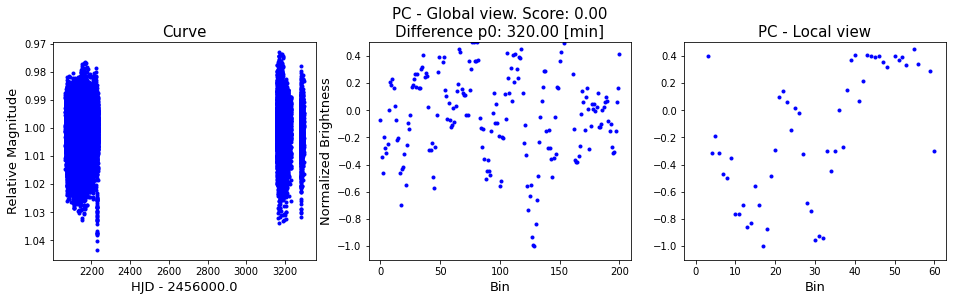

In [13]:
#np.random.seed(3874182)
np.random.seed(3874183)
N = 10
list_random_selected = np.random.choice(np.unique(data_labeled_selected[data_labeled_selected["label"] == "PC"]["index"]), N)


difference_p0_list_full = []
score_p0_list_full = []

for index in list_random_selected:
    print(index)
    difference_p0_list, score_list = period_experiment(index, plot = True)
    difference_p0_list_full.append(difference_p0_list)
    score_p0_list_full.append(score_list)
    

4.489471512787317
4.59656801772906
1.072515115114998
3.124362654772073
3.209984655647398
3.645167015117528
2.780839115447985
1.259180696411612
1.5305709882834406
3.137743902998775
1.072515115114998
1.259180696411612
1.5305709882834406
2.780839115447985
3.124362654772073
3.137743902998775
3.209984655647398
3.645167015117528
4.489471512787317
4.59656801772906


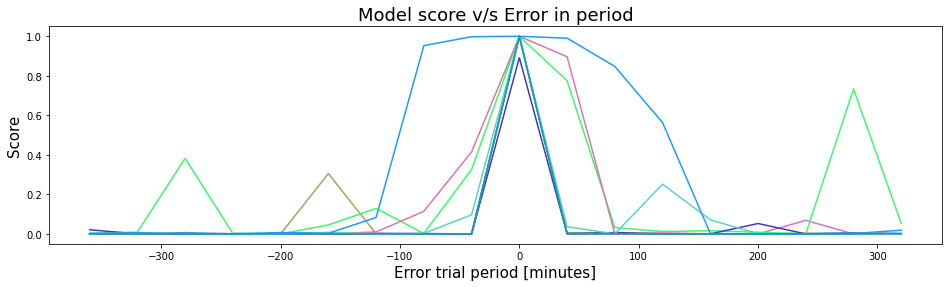

In [14]:

fig = plt.figure(figsize=(16, 4)) 
ax = fig.add_subplot(1, 1, 1)
plt.title(f"Model score v/s Error in period", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial period [minutes]", fontsize = 15)
#plt.xlim([-800, 800])

#np.random.seed(34324)


period_list = []
for i in range(N):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    period_list.append(period)
    

    
#np.random.seed(34324)
np.random.seed(34329)
for i in np.argsort(period_list):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    #plt.plot(np.array(difference_p0_list_full[i])/period, score_p0_list_full[i], c=np.random.rand(3,) , label = f'{np.round(period,2)}')
    plt.plot(np.array(difference_p0_list_full[i]), score_p0_list_full[i], c=np.random.rand(3,) , label = f'{np.round(period,2)}')
#plt.legend( title="Period", fontsize='small')    
plt.show()

In [15]:
#np.random.seed(3874182)
np.random.seed(3874183)
N = 500
list_random_selected = np.random.choice(np.unique(data_labeled_selected[data_labeled_selected["label"] == "PC"]["index"]), N, replace = False)

period_list = []
for i in range(N):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    period_list.append(period)
    

difference_p0_list_full = []
score_p0_list_full = []

for index in list_random_selected:
    print("index: ", index)
    difference_p0_list, score_list = period_experiment(index, plot = False)
    difference_p0_list_full.append(difference_p0_list)
    score_p0_list_full.append(score_list)
    

2.295428442096774
1.5791556681629288
4.311261187494673
3.920842439149733
4.767428921188153
1.0187571933822728
2.089295071002688
4.942531734462366
3.226392788418276
2.897513863701728
1.3207380622217866
3.706892300584263
3.303405204929581
3.4450547372643405
4.072319550269871
1.6222285190183636
2.565342293885148
2.0792476032682177
1.4618349145381453
1.5748812142675346
4.256666851466198
3.126443237722244
1.442181736854321
1.674591701821314
1.2928322016555251
1.0298679256803758
1.3596990711508412
2.5020780181110003
1.4490771213935714
2.0134691756571423
1.1380608498639784
3.2350785372985107
1.9995649664132007
3.3324049200140866
3.995568355740601
1.0797919469322457
3.7419185917712814
1.2004010177174675
2.3969024063507
3.0731768643651547
3.3425709784145963
4.585006336487022
4.9437291144735465
1.915525499584872
1.8777142038822685
2.282565079439187
2.53711059769016
4.480705782137498
3.2226149673665603
3.7405297028823936
1.0515136396024465
3.077235249341703
1.3954781490532149
3.259401378236205
3.

1/1 [==============================] - 0s 14ms/step
Prediction:  0.0008962794
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00013675218
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0001984022
1/1 [==============================] - 0s 13ms/step
Prediction:  6.274681e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  5.314591e-06
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00012462471
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009883237
1/1 [==============================] - 0s 14ms/step
Prediction:  7.464195e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.051005404
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9986034
1/1 [==============================] - 0s 12ms/step
Prediction:  0.9532383
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0002390818
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00

Prediction:  0.03835855
1/1 [==============================] - 0s 14ms/step
Prediction:  6.312117e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00025557308
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00085826573
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00059576693
1/1 [==============================] - 0s 13ms/step
Prediction:  0.001947922
1/1 [==============================] - 0s 12ms/step
Prediction:  9.6936936e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00013677227
index:  2546
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00050076173
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0022986433
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008121023
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00084302056
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00076773524
1/1 [===============

Prediction:  0.0003534271
1/1 [==============================] - 0s 13ms/step
Prediction:  0.025668984
1/1 [==============================] - 0s 13ms/step
Prediction:  0.006682616
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9894597
1/1 [==============================] - 0s 14ms/step
Prediction:  5.3805303e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  2.613002e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00016212788
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0015852322
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00052450306
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0007299063
1/1 [==============================] - 0s 13ms/step
Prediction:  0.21386258
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00038251284
index:  2984
1/1 [==============================] - 0s 14ms/step
Prediction:  4.9496415e-05
1/1 [======================

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00023487501
1/1 [==============================] - 0s 16ms/step
Prediction:  9.7408956e-05
index:  5435
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0049273823
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0087903235
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0004422547
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00010670171
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00020076857
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0007689526
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00020945408
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0043320367
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00023769058
1/1 [==============================] - 0s 13ms/step
Prediction:  0.999935
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 13ms/step
Prediction:  0.03652303
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9994895
1/1 [==============================] - 0s 13ms/step
Prediction:  1.4596001e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0034855718
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0035399024
1/1 [==============================] - 0s 11ms/step
Prediction:  0.98850757
1/1 [==============================] - 0s 15ms/step
Prediction:  3.8728598e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00017294021
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00012689193
1/1 [==============================] - 0s 13ms/step
Prediction:  0.021035662
index:  12730
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005145261
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0016525782
1/1 [==============================] - 0s 13ms/step
Pr

1/1 [==============================] - 0s 12ms/step
Prediction:  0.00074531266
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00046421614
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0010488504
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00021351448
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008384886
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0015080774
1/1 [==============================] - 0s 15ms/step
Prediction:  0.13215467
1/1 [==============================] - 0s 15ms/step
Prediction:  0.000114903894
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9875976
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00023183248
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0010535883
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0005329316
1/1 [==============================] - 0s 17ms/step
Prediction:

1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009995322
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00085724576
index:  12599
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0019510348
1/1 [==============================] - 0s 13ms/step
Prediction:  1.9032829e-06
1/1 [==============================] - 0s 13ms/step
Prediction:  1.1248713e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005427341
1/1 [==============================] - 0s 14ms/step
Prediction:  0.33152217
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00054996676
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00017756337
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00020204333
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0080965515
1/1 [==============================] - 0s 15ms/step
Prediction:  0.998652
1/1 [==============================] - 0s 14ms/ste

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00017289602
1/1 [==============================] - 0s 12ms/step
Prediction:  0.006389895
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00015737023
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00050431263
1/1 [==============================] - 0s 13ms/step
Prediction:  3.4278884e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00015097526
index:  19058
1/1 [==============================] - 0s 13ms/step
Prediction:  0.025740718
1/1 [==============================] - 0s 14ms/step
Prediction:  0.08836652
1/1 [==============================] - 0s 13ms/step
Prediction:  0.002163804
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00049292186
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0076857526
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00048495355
1/1 [==============================] - 0s 14ms/s

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00013194431
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00043155972
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00012177297
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00016332074
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00017575696
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99905396
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00069761113
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0009938782
1/1 [==============================] - 0s 13ms/step
Prediction:  0.018793365
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00022005323
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00015508378
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0012676887
1/1 [==============================] - 0s 14ms/step
Predict

1/1 [==============================] - 0s 14ms/step
Prediction:  7.917496e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  7.992299e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  4.231604e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00032088446
index:  16929
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00012836927
1/1 [==============================] - 0s 15ms/step
Prediction:  9.95608e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  3.4376866e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00015307953
1/1 [==============================] - 0s 22ms/step
Prediction:  0.00021764441
1/1 [==============================] - 0s 19ms/step
Prediction:  3.735935e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00035767458
1/1 [==============================] - 0s 14ms/step
Prediction:  1.7162054e-05
1/1 [==============================] - 0s 14

1/1 [==============================] - 0s 14ms/step
Prediction:  3.721321e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00022765704
1/1 [==============================] - 0s 14ms/step
Prediction:  0.013722023
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99873435
1/1 [==============================] - 0s 15ms/step
Prediction:  0.033850107
1/1 [==============================] - 0s 15ms/step
Prediction:  3.2101438e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0037903108
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0010786996
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0044438965
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00013929576
1/1 [==============================] - 0s 15ms/step
Prediction:  0.22167072
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0010790846
index:  5397
1/1 [==============================] - 0s 12ms/step
Pr

1/1 [==============================] - 0s 13ms/step
Prediction:  0.00068144576
index:  2755
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0022491468
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0005284512
1/1 [==============================] - 0s 14ms/step
Prediction:  0.003853734
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00033374137
1/1 [==============================] - 0s 14ms/step
Prediction:  0.012725069
1/1 [==============================] - 0s 14ms/step
Prediction:  0.002103297
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0067619197
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0017580388
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0015126575
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9989583
1/1 [==============================] - 0s 14ms/step
Prediction:  0.029748112
1/1 [==============================] - 0s 14ms/step
Pred

1/1 [==============================] - 0s 14ms/step
Prediction:  0.99927217
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009878201
1/1 [==============================] - 0s 14ms/step
Prediction:  0.28161898
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0003644448
1/1 [==============================] - 0s 13ms/step
Prediction:  2.1319542e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00026229006
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0020553088
1/1 [==============================] - 0s 14ms/step
Prediction:  7.2243805e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0004927365
index:  7183
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00079736987
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00029223808
1/1 [==============================] - 0s 13ms/step
Prediction:  0.66356206
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Prediction:  0.0015161213
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00022686958
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0026699938
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9995376
1/1 [==============================] - 0s 13ms/step
Prediction:  3.4642053e-06
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00013530334
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00012199148
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0018064376
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00040198295
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0001449978
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00022266484
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0057546864
index:  2833
1/1 [==============================] - 0s 13ms/s

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00011313973
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00038193294
1/1 [==============================] - 0s 17ms/step
Prediction:  0.000114301976
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00027065276
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003236592
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0060854023
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9995689
1/1 [==============================] - 0s 14ms/step
Prediction:  0.015472107
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00018936301
1/1 [==============================] - 0s 13ms/step
Prediction:  0.7352753
1/1 [==============================] - 0s 15ms/step
Prediction:  6.7683766e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.006085858
1/1 [==============================] - 0s 16ms/step
Prediction:  

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00924464
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0044344785
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0022350366
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009578678
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0021635117
index:  12693
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0079937205
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00041449766
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0002459628
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00035735266
1/1 [==============================] - 0s 13ms/step
Prediction:  4.4785756e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  4.2215717e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  5.4309814e-05
1/1 [==============================] - 0s 13ms/

1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009458096
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00079906953
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0031518047
1/1 [==============================] - 0s 12ms/step
Prediction:  0.9473601
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9988604
1/1 [==============================] - 0s 14ms/step
Prediction:  0.005124468
1/1 [==============================] - 0s 16ms/step
Prediction:  0.020659512
1/1 [==============================] - 0s 14ms/step
Prediction:  0.017156838
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0065806382
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009305013
1/1 [==============================] - 0s 13ms/step
Prediction:  0.3862908
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0003709295
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00114763

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00023845119
1/1 [==============================] - 0s 14ms/step
Prediction:  0.065682516
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00043238222
1/1 [==============================] - 0s 20ms/step
Prediction:  0.00015923407
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00067680265
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00420863
1/1 [==============================] - 0s 15ms/step
Prediction:  0.997406
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9998787
1/1 [==============================] - 0s 14ms/step
Prediction:  0.93435746
1/1 [==============================] - 0s 15ms/step
Prediction:  0.022710793
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0010177832
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0009225211
1/1 [==============================] - 0s 14ms/step
Prediction:  0.006712

1/1 [==============================] - 0s 15ms/step
Prediction:  6.814618e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  6.107038e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.014420352
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00010729686
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00034597662
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00024787508
index:  609
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0016829474
1/1 [==============================] - 0s 12ms/step
Prediction:  2.3095097e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0014737352
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00018006696
1/1 [==============================] - 0s 13ms/step
Prediction:  5.5794617e-06
1/1 [==============================] - 0s 13ms/step
Prediction:  0.001767919
1/1 [==============================] - 0s 17ms/s

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0012883947
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9998065
1/1 [==============================] - 0s 13ms/step
Prediction:  0.084444664
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0034867926
1/1 [==============================] - 0s 18ms/step
Prediction:  0.013090428
1/1 [==============================] - 0s 18ms/step
Prediction:  0.0006474874
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0001923208
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00047201797
1/1 [==============================] - 0s 15ms/step
Prediction:  0.006782067
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00012647132
index:  13376
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0010595759
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00016110155
1/1 [==============================] - 0s 14ms/step
P

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00019139718
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00037571733
1/1 [==============================] - 0s 13ms/step
Prediction:  1.4884004e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.001647328
1/1 [==============================] - 0s 14ms/step
Prediction:  0.008417044
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99980867
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00044356353
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00031173724
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00014301132
1/1 [==============================] - 0s 17ms/step
Prediction:  0.008026199
1/1 [==============================] - 0s 13ms/step
Prediction:  0.05561493
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00019209924
1/1 [==============================] - 0s 14ms/step
Prediction: 

Prediction:  0.0001510837
1/1 [==============================] - 0s 15ms/step
Prediction:  0.014036868
1/1 [==============================] - 0s 15ms/step
Prediction:  0.44929153
1/1 [==============================] - 0s 18ms/step
Prediction:  0.32542327
1/1 [==============================] - 0s 15ms/step
Prediction:  0.87606776
1/1 [==============================] - 0s 15ms/step
Prediction:  0.16170475
1/1 [==============================] - 0s 14ms/step
Prediction:  0.03545336
1/1 [==============================] - 0s 14ms/step
Prediction:  0.03457281
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9975633
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99969006
1/1 [==============================] - 0s 16ms/step
Prediction:  0.6205999
1/1 [==============================] - 0s 15ms/step
Prediction:  0.05774779
1/1 [==============================] - 0s 14ms/step
Prediction:  0.93342566
1/1 [==============================] - 0s 17ms/step
Prediction:

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9735867
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0029453363
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0029989374
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0015270901
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00090316497
1/1 [==============================] - 0s 14ms/step
Prediction:  0.006309944
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0029724976
index:  4827
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00019325003
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0054973816
1/1 [==============================] - 0s 14ms/step
Prediction:  0.001360117
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0015855086
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00043002138
1/1 [==============================] - 0s 13ms/step
P

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0010493861
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0003240507
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0037565415
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00045783914
1/1 [==============================] - 0s 15ms/step
Prediction:  8.906751e-05
1/1 [==============================] - 0s 18ms/step
Prediction:  0.00031601783
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994457
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00016773045
1/1 [==============================] - 0s 14ms/step
Prediction:  0.03273195
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0066930256
1/1 [==============================] - 0s 15ms/step
Prediction:  0.005884278
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0007579922
1/1 [==============================] - 0s 14ms/step
Prediction:  0.

1/1 [==============================] - 0s 13ms/step
Prediction:  0.00027762487
1/1 [==============================] - 0s 17ms/step
Prediction:  0.00018853247
1/1 [==============================] - 0s 15ms/step
Prediction:  2.2711673e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.001490534
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0007805173
1/1 [==============================] - 0s 14ms/step
Prediction:  7.847489e-06
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00035182934
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0018603703
1/1 [==============================] - 0s 15ms/step
Prediction:  0.8815356
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99928886
1/1 [==============================] - 0s 14ms/step
Prediction:  0.8463435
1/1 [==============================] - 0s 14ms/step
Prediction:  0.15579943
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0180

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0064101107
1/1 [==============================] - 0s 13ms/step
Prediction:  0.086108655
1/1 [==============================] - 0s 14ms/step
Prediction:  0.006701352
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0001186226
1/1 [==============================] - 0s 13ms/step
Prediction:  5.4070348e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  2.9010424e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00057276466
index:  6367
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00018514946
1/1 [==============================] - 0s 13ms/step
Prediction:  2.2337319e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00012396053
1/1 [==============================] - 0s 14ms/step
Prediction:  8.756084e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003380532
1/1 [==============================] - 0s 15ms/

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00019273846
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0004361965
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00012483785
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0007060664
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00053968636
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006981538
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996099
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00093971286
1/1 [==============================] - 0s 13ms/step
Prediction:  4.8468582e-06
1/1 [==============================] - 0s 14ms/step
Prediction:  1.3217541e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  9.755481e-05
1/1 [==============================] - 0s 17ms/step
Prediction:  4.776543e-05
1/1 [==============================] - 0s 14ms/step
Predictio

1/1 [==============================] - 0s 17ms/step
Prediction:  0.72815347
1/1 [==============================] - 0s 13ms/step
Prediction:  0.015463545
1/1 [==============================] - 0s 14ms/step
Prediction:  0.11737565
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0119589055
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00033455246
index:  8152
1/1 [==============================] - 0s 14ms/step
Prediction:  9.8149845e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00021754194
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00085616164
1/1 [==============================] - 0s 14ms/step
Prediction:  0.009159781
1/1 [==============================] - 0s 15ms/step
Prediction:  1.4694184e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  1.2687709e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0009015966
1/1 [==============================] - 0s 13ms/step

1/1 [==============================] - 0s 14ms/step
Prediction:  0.9997524
1/1 [==============================] - 0s 13ms/step
Prediction:  0.81997025
1/1 [==============================] - 0s 13ms/step
Prediction:  0.035084542
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00032646224
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0041085007
1/1 [==============================] - 0s 14ms/step
Prediction:  0.5023337
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00033541216
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00010354638
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0010053176
index:  8494
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0002631269
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0030293898
1/1 [==============================] - 0s 15ms/step
Prediction:  0.011384334
1/1 [==============================] - 0s 17ms/step
Predic

1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006461608
1/1 [==============================] - 0s 13ms/step
Prediction:  0.006459651
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0012365462
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0051539307
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00096763344
1/1 [==============================] - 0s 12ms/step
Prediction:  0.010444012
1/1 [==============================] - 0s 13ms/step
Prediction:  0.014649572
1/1 [==============================] - 0s 14ms/step
Prediction:  0.98742557
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997561
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9008549
1/1 [==============================] - 0s 16ms/step
Prediction:  0.14379852
1/1 [==============================] - 0s 13ms/step
Prediction:  0.074089035
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0003930576

1/1 [==============================] - 0s 15ms/step
Prediction:  0.005870011
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0065653687
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0012089947
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0034993254
1/1 [==============================] - 0s 15ms/step
Prediction:  0.07932328
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9883644
index:  13587
1/1 [==============================] - 0s 14ms/step
Prediction:  0.018841475
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00056907395
1/1 [==============================] - 0s 15ms/step
Prediction:  0.12395842
1/1 [==============================] - 0s 15ms/step
Prediction:  2.1865151e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00066508015
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00016882234
1/1 [==============================] - 0s 14ms/step
Pre

Prediction:  0.0018130868
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0016492154
1/1 [==============================] - 0s 13ms/step
Prediction:  0.47560248
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0010043076
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0023300238
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99959975
1/1 [==============================] - 0s 13ms/step
Prediction:  8.260091e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0009850829
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0020429932
1/1 [==============================] - 0s 14ms/step
Prediction:  0.09566403
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0030030764
1/1 [==============================] - 0s 15ms/step
Prediction:  0.86003107
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0013023757
1/1 [==============================] - 0s 14ms

1/1 [==============================] - 0s 13ms/step
Prediction:  0.00014895589
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0016723345
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0002907967
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00391583
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005169821
1/1 [==============================] - 0s 13ms/step
Prediction:  0.000500024
1/1 [==============================] - 0s 14ms/step
Prediction:  8.26634e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  7.822299e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9957946
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005936858
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00020274227
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00046723094
1/1 [==============================] - 0s 14ms/step
Prediction:  5.3

1/1 [==============================] - 0s 17ms/step
Prediction:  0.00037039173
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0006622586
index:  16607
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0015861962
1/1 [==============================] - 0s 18ms/step
Prediction:  5.7587586e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  5.5480465e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00013752488
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00011726648
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00059008325
1/1 [==============================] - 0s 13ms/step
Prediction:  0.62927663
1/1 [==============================] - 0s 14ms/step
Prediction:  0.42559192
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99399084
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998359
1/1 [==============================] - 0s 13ms/step
P

1/1 [==============================] - 0s 15ms/step
Prediction:  0.999782
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00015333488
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0042382255
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00047912824
1/1 [==============================] - 0s 14ms/step
Prediction:  0.002864872
1/1 [==============================] - 0s 16ms/step
Prediction:  5.904137e-05
1/1 [==============================] - 0s 18ms/step
Prediction:  9.737162e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.003100537
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0004563816
index:  1692
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0028384512
1/1 [==============================] - 0s 15ms/step
Prediction:  4.297305e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00028985506
1/1 [==============================] - 0s 15ms/step
Pr

Prediction:  0.00010890158
1/1 [==============================] - 0s 14ms/step
Prediction:  0.013938143
1/1 [==============================] - 0s 14ms/step
Prediction:  0.8371152
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99820566
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9969124
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99295706
1/1 [==============================] - 0s 14ms/step
Prediction:  0.18393642
1/1 [==============================] - 0s 14ms/step
Prediction:  0.026202189
1/1 [==============================] - 0s 15ms/step
Prediction:  0.012156186
1/1 [==============================] - 0s 14ms/step
Prediction:  0.008257831
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0001690464
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0025424045
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00069683464
index:  15048
1/1 [==============================] -

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0002705297
index:  9995
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00045641317
1/1 [==============================] - 0s 13ms/step
Prediction:  0.000601891
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0002373072
1/1 [==============================] - 0s 13ms/step
Prediction:  0.009462825
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0025235636
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0006429379
1/1 [==============================] - 0s 14ms/step
Prediction:  8.978801e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  1.0772314e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  6.613377e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995508
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00010420479
1/1 [==============================] - 0s 14ms/step
P

1/1 [==============================] - 0s 14ms/step
Prediction:  0.9788789
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0010265152
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00055287324
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0025499652
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0019493345
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0002200568
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0069206627
1/1 [==============================] - 0s 16ms/step
Prediction:  0.011305372
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00053965143
index:  15409
1/1 [==============================] - 0s 17ms/step
Prediction:  0.28836283
1/1 [==============================] - 0s 15ms/step
Prediction:  0.016784994
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00029554206
1/1 [==============================] - 0s 18ms/step
Pr

1/1 [==============================] - 0s 17ms/step
Prediction:  4.089446e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.01548598
1/1 [==============================] - 0s 15ms/step
Prediction:  0.103038445
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9996967
1/1 [==============================] - 0s 15ms/step
Prediction:  0.8352138
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0014857159
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0004041067
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0120115485
1/1 [==============================] - 0s 13ms/step
Prediction:  0.006961221
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0007407844
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00021745378
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0062876497
index:  2660
1/1 [==============================] - 0s 16ms/step
Predicti

1/1 [==============================] - 0s 14ms/step
Prediction:  0.00044621472
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00066738285
index:  7353
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00026127076
1/1 [==============================] - 0s 15ms/step
Prediction:  0.000385802
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0009957957
1/1 [==============================] - 0s 15ms/step
Prediction:  0.06007332
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0011765419
1/1 [==============================] - 0s 23ms/step
Prediction:  0.00041061477
1/1 [==============================] - 0s 19ms/step
Prediction:  0.00049160846
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0004255234
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9981664
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998907
1/1 [==============================] - 0s 14ms/step
Pre

1/1 [==============================] - 0s 15ms/step
Prediction:  0.0030253113
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00030569613
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0015413433
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0067066927
1/1 [==============================] - 0s 14ms/step
Prediction:  0.002394584
index:  12712
1/1 [==============================] - 0s 15ms/step
Prediction:  4.338018e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  6.119187e-05
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0023729538
1/1 [==============================] - 0s 20ms/step
Prediction:  0.00055801275
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00037251887
1/1 [==============================] - 0s 15ms/step
Prediction:  0.69868636
1/1 [==============================] - 0s 14ms/step
Prediction:  0.094200134
1/1 [==============================] - 0s 13ms/step

1/1 [==============================] - 0s 14ms/step
Prediction:  0.61145186
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0267588
1/1 [==============================] - 0s 15ms/step
Prediction:  0.3147473
1/1 [==============================] - 0s 14ms/step
Prediction:  0.022112384
1/1 [==============================] - 0s 15ms/step
Prediction:  3.76283e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  1.3518059e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003372938
1/1 [==============================] - 0s 19ms/step
Prediction:  0.0002472449
index:  19572
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0002563034
1/1 [==============================] - 0s 13ms/step
Prediction:  0.025003547
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00010547703
1/1 [==============================] - 0s 13ms/step
Prediction:  0.19166516
1/1 [==============================] - 0s 14ms/step
Predictio

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0001796922
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008350163
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0001880506
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0009202102
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006287711
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006396978
1/1 [==============================] - 0s 14ms/step
Prediction:  0.815208
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997329
1/1 [==============================] - 0s 15ms/step
Prediction:  0.40736952
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0014562674
1/1 [==============================] - 0s 15ms/step
Prediction:  0.001700826
1/1 [==============================] - 0s 13ms/step
Prediction:  0.033881567
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00130536

Prediction:  0.075111695
1/1 [==============================] - 0s 20ms/step
Prediction:  0.0002885176
index:  5093
1/1 [==============================] - 0s 14ms/step
Prediction:  0.03152121
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0012027703
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0019291901
1/1 [==============================] - 0s 15ms/step
Prediction:  3.649642e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  6.427147e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00040233642
1/1 [==============================] - 0s 14ms/step
Prediction:  6.339069e-05
1/1 [==============================] - 0s 17ms/step
Prediction:  1.9044875e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0031404633
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9986802
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00039616483
1/1 [=======================

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0006608312
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00021991647
1/1 [==============================] - 0s 16ms/step
Prediction:  1.0519065e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0056789555
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00020476505
index:  2624
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0001297832
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005812381
1/1 [==============================] - 0s 13ms/step
Prediction:  0.002692595
1/1 [==============================] - 0s 12ms/step
Prediction:  7.253248e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0018773056
1/1 [==============================] - 0s 13ms/step
Prediction:  8.296032e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00047104125
1/1 [==============================] - 0s 12ms/s

1/1 [==============================] - 0s 14ms/step
Prediction:  0.46270472
1/1 [==============================] - 0s 13ms/step
Prediction:  0.98888636
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9989556
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994203
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99961776
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99965286
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99970716
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995477
1/1 [==============================] - 0s 12ms/step
Prediction:  0.99891806
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99740094
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99321514
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9802036
1/1 [==============================] - 0s 14ms/step
Prediction:  0.8560038
index:  17442
1/1

1/1 [==============================] - 0s 13ms/step
Prediction:  0.00047545377
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005083532
1/1 [==============================] - 0s 15ms/step
Prediction:  8.4223495e-05
1/1 [==============================] - 0s 18ms/step
Prediction:  6.133406e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  4.46743e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  7.168601e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0019017364
1/1 [==============================] - 0s 23ms/step
Prediction:  0.99071544
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0003278233
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00014130985
1/1 [==============================] - 0s 16ms/step
Prediction:  0.07783028
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0016454111
1/1 [==============================] - 0s 16ms/step
Prediction:  3

Prediction:  0.0006274939
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00016641174
index:  7448
1/1 [==============================] - 0s 14ms/step
Prediction:  9.350413e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.022815768
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00013819347
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008849216
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0027679987
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00018365249
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0006199002
1/1 [==============================] - 0s 14ms/step
Prediction:  6.960695e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00034182178
1/1 [==============================] - 0s 13ms/step
Prediction:  0.988736
1/1 [==============================] - 0s 15ms/step
Prediction:  4.9651e-05
1/1 [=======================

1/1 [==============================] - 0s 12ms/step
Prediction:  0.000115571114
1/1 [==============================] - 0s 14ms/step
Prediction:  0.003966235
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00015903424
1/1 [==============================] - 0s 16ms/step
Prediction:  3.1132215e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0003618604
index:  14252
1/1 [==============================] - 0s 17ms/step
Prediction:  0.004792788
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00064719375
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0119515285
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0012010456
1/1 [==============================] - 0s 13ms/step
Prediction:  0.01955082
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0003905765
1/1 [==============================] - 0s 16ms/step
Prediction:  0.05109524
1/1 [==============================] - 0s 13ms/step

1/1 [==============================] - 0s 13ms/step
Prediction:  0.000110762216
1/1 [==============================] - 0s 14ms/step
Prediction:  7.087685e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  2.378105e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.07473952
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9961686
1/1 [==============================] - 0s 16ms/step
Prediction:  0.0038181776
1/1 [==============================] - 0s 14ms/step
Prediction:  0.05219395
1/1 [==============================] - 0s 23ms/step
Prediction:  0.0004628552
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00097259297
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00030199176
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00017679892
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0001758433
1/1 [==============================] - 0s 13ms/step
Prediction:  0

1/1 [==============================] - 0s 15ms/step
Prediction:  0.0001942263
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00049124914
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00018807697
index:  2641
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00043415488
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00044450368
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00024518426
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0013965518
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00044175945
1/1 [==============================] - 0s 12ms/step
Prediction:  5.4722288e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.00037614204
1/1 [==============================] - 0s 12ms/step
Prediction:  0.002152756
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0024852478
1/1 [==============================] - 0s 14

1/1 [==============================] - 0s 13ms/step
Prediction:  0.99898934
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99932146
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99902767
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9896363
1/1 [==============================] - 0s 13ms/step
Prediction:  0.3218458
1/1 [==============================] - 0s 13ms/step
Prediction:  8.356359e-05
1/1 [==============================] - 0s 12ms/step
Prediction:  0.0016006146
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008783867
1/1 [==============================] - 0s 14ms/step
Prediction:  0.027323322
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00041563917
index:  4619
1/1 [==============================] - 0s 13ms/step
Prediction:  8.160612e-05
1/1 [==============================] - 0s 14ms/step
Prediction:  0.00060146354
1/1 [==============================] - 0s 14ms/step
Prediction

1/1 [==============================] - 0s 15ms/step
Prediction:  0.00028861937
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0010749737
1/1 [==============================] - 0s 13ms/step
Prediction:  0.009565238
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8099804
1/1 [==============================] - 0s 15ms/step
Prediction:  0.61719847
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9998862
1/1 [==============================] - 0s 14ms/step
Prediction:  0.91815823
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9106272
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9626425
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9595782
1/1 [==============================] - 0s 14ms/step
Prediction:  0.3318141
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0023886894
1/1 [==============================] - 0s 13ms/step
Prediction:  0.002017771
1/1 [====

1/1 [==============================] - 0s 13ms/step
Prediction:  0.00054539385
1/1 [==============================] - 0s 13ms/step
Prediction:  0.000490776
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00035004428
1/1 [==============================] - 0s 11ms/step
Prediction:  0.00020085322
1/1 [==============================] - 0s 17ms/step
Prediction:  0.0007382277
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0024157094
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0006092579
1/1 [==============================] - 0s 16ms/step
Prediction:  7.816863e-05
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99970543
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00017834663
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00050760125
1/1 [==============================] - 0s 13ms/step
Prediction:  0.15702847
1/1 [==============================] - 0s 16ms/step
Prediction: 

1/1 [==============================] - 0s 13ms/step
Prediction:  0.0018113952
1/1 [==============================] - 0s 14ms/step
Prediction:  0.002088867
1/1 [==============================] - 0s 14ms/step
Prediction:  0.7880344
1/1 [==============================] - 0s 13ms/step
Prediction:  0.011974856
1/1 [==============================] - 0s 13ms/step
Prediction:  0.006651914
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0016863444
1/1 [==============================] - 0s 14ms/step
Prediction:  0.0018942829
index:  4808
1/1 [==============================] - 0s 15ms/step
Prediction:  0.0004963289
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00071773975
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00035530087
1/1 [==============================] - 0s 13ms/step
Prediction:  9.252422e-05
1/1 [==============================] - 0s 16ms/step
Prediction:  0.00040774723
1/1 [==============================] - 0s 13ms/step
Pr

1/1 [==============================] - 0s 13ms/step
Prediction:  6.3060834e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00013057618
1/1 [==============================] - 0s 14ms/step
Prediction:  4.0517923e-05
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0008407659
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00069138105
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9994198
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0005306972
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0011590918
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0012803474
1/1 [==============================] - 0s 13ms/step
Prediction:  0.00015988328
1/1 [==============================] - 0s 12ms/step
Prediction:  0.00066518097
1/1 [==============================] - 0s 13ms/step
Prediction:  0.0021958346
1/1 [==============================] - 0s 15ms/step
Predictio

### Normalized 

In [49]:

difference_p0_list_full_concat = np.array(difference_p0_list_full[0])/period # to fix to first period 
score_p0_list_full_concat = np.array(score_p0_list_full[0])

for i in np.argsort(period_list[1:]):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    
    difference_p0_list_full_concat = np.concatenate((difference_p0_list_full_concat, np.array(difference_p0_list_full[i])/period), axis=0)
    score_p0_list_full_concat = np.concatenate((score_p0_list_full_concat, score_p0_list_full[i]), axis=0)
    
    #print((np.array(difference_t0_list_full[i])/period).shape)
    #print(np.array(score_list_full[i]).shape)


1.3754358339814343
4.767428921188153
4.2265785407669005
1.2928322016555251
1.650480008054396
3.6547898758273134
3.7405297028823936
3.814702871506756
1.3718453577801344
2.2745360585616683
2.234551156259229
2.408168803372338
1.0953495100522648
4.34253282599864
2.190466916645794
3.995568355740601
4.255277962577309
4.081366147592024
1.821864167063667
1.4784289856482085
1.6089532372343895
4.7042224088443865
2.2180544069844434
1.3576726324142223
3.660402154721984
2.865537528931558
3.1341250209894462
3.63932216377218
1.7859291668568116
4.667815958240563
2.0134691756571423
1.611481587137067
3.3968947985823386
4.487721383065482
1.7574691534793003
3.7419185917712814
2.6318753728587185
4.709924852743182
1.224651456972204
3.2582762600880266
2.128641949428124
3.510375441062676
1.7873180557457005
1.1122103477036651
1.9161383606727045
1.6251923915311803
1.428981208089834
1.684305873607735
1.1534883042796868
3.3447021646347763
3.826495136991801
2.911386601621017
2.401057485473727
3.9517803584197657
4.

In [50]:
print(len(period_list))
print(difference_p0_list_full_concat.shape)
print(score_p0_list_full_concat.shape)

500
(9000,)
(9000,)


In [51]:

#np.save("difference_p0_list_full.npy", difference_p0_list_full)
#np.save("score_p0_list_full.npy", difference_t0_list_full)
#np.save("argsort period_list period experiment.npy", np.argsort(period_list))


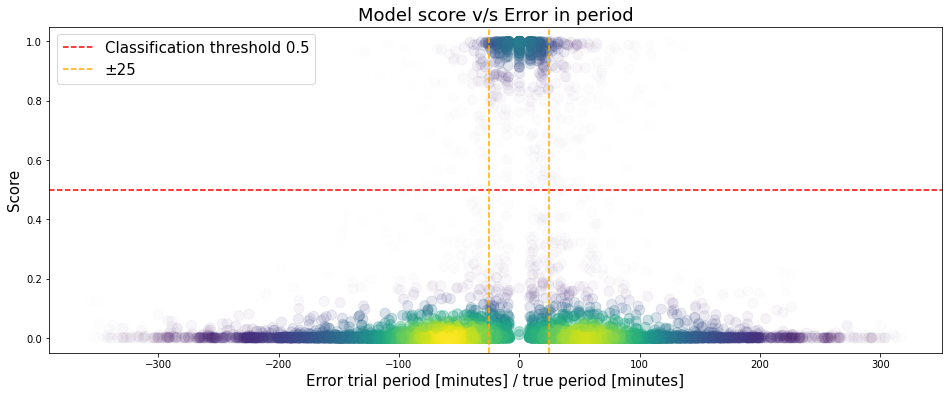

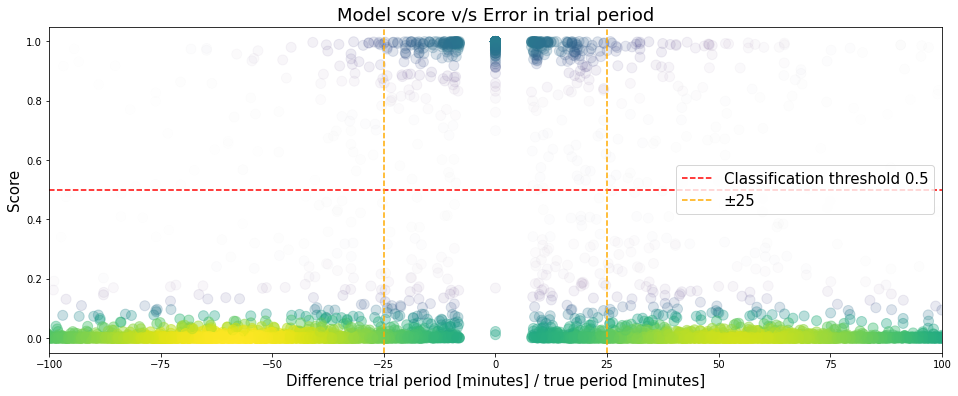

In [53]:
# Calculate the point density
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density
x = difference_p0_list_full_concat
y = score_p0_list_full_concat
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in period", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial period [minutes] / true period [minutes]", fontsize = 15)

#plt.xlim([-100, 100])

plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
plt.axvline(x = -25, color = '#ffaa00', linestyle = '--', label = "±25") 
plt.axvline(x = 25, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=100, alpha=30*z)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()


fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in trial period", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Difference trial period [minutes] / true period [minutes]", fontsize = 15)

plt.xlim([-100, 100])

plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
plt.axvline(x = -25, color = '#ffaa00', linestyle = '--', label = "±25") 
plt.axvline(x = 25, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=100, alpha=30*z)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()

### Non normalized

In [54]:

difference_p0_list_full_concat = np.array(difference_p0_list_full[0])
score_p0_list_full_concat = np.array(score_p0_list_full[0])

for i in np.argsort(period_list[1:]):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    
    difference_p0_list_full_concat = np.concatenate((difference_p0_list_full_concat, np.array(difference_p0_list_full[i])), axis=0)
    score_p0_list_full_concat = np.concatenate((score_p0_list_full_concat, score_p0_list_full[i]), axis=0)
    
    #print((np.array(difference_t0_list_full[i])/period).shape)
    #print(np.array(score_list_full[i]).shape)


1.3754358339814343
4.767428921188153
4.2265785407669005
1.2928322016555251
1.650480008054396
3.6547898758273134
3.7405297028823936
3.814702871506756
1.3718453577801344
2.2745360585616683
2.234551156259229
2.408168803372338
1.0953495100522648
4.34253282599864
2.190466916645794
3.995568355740601
4.255277962577309
4.081366147592024
1.821864167063667
1.4784289856482085
1.6089532372343895
4.7042224088443865
2.2180544069844434
1.3576726324142223
3.660402154721984
2.865537528931558
3.1341250209894462
3.63932216377218
1.7859291668568116
4.667815958240563
2.0134691756571423
1.611481587137067
3.3968947985823386
4.487721383065482
1.7574691534793003
3.7419185917712814
2.6318753728587185
4.709924852743182
1.224651456972204
3.2582762600880266
2.128641949428124
3.510375441062676
1.7873180557457005
1.1122103477036651
1.9161383606727045
1.6251923915311803
1.428981208089834
1.684305873607735
1.1534883042796868
3.3447021646347763
3.826495136991801
2.911386601621017
2.401057485473727
3.9517803584197657
4.

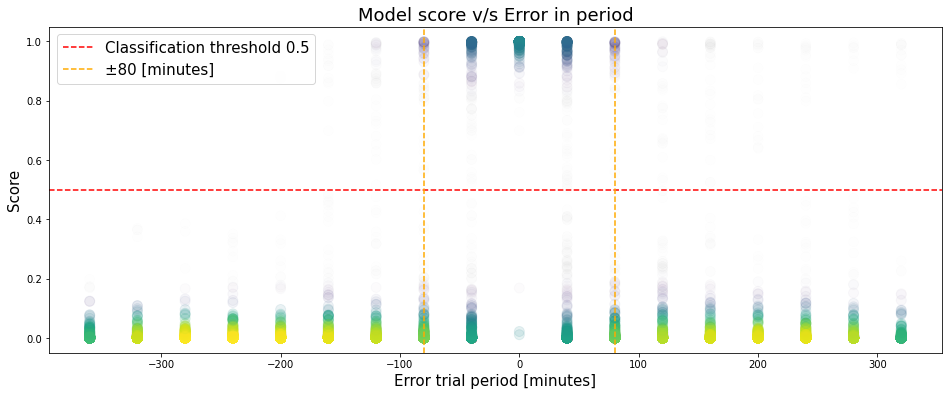

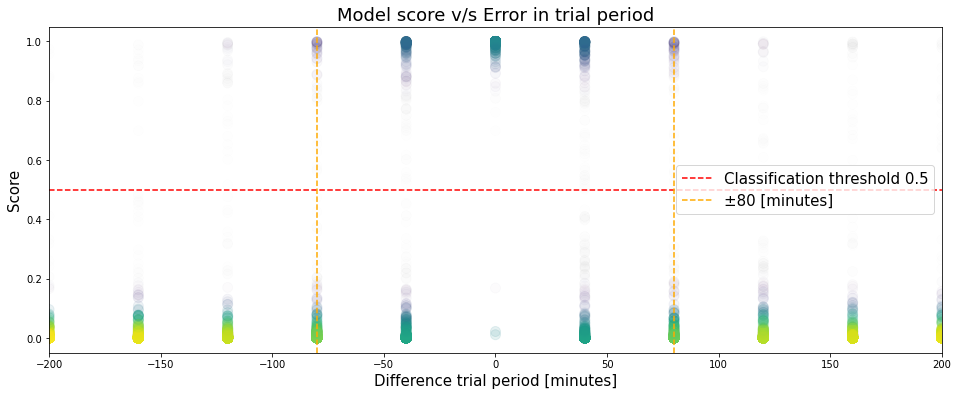

In [58]:
# Calculate the point density
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density
x = difference_p0_list_full_concat
y = score_p0_list_full_concat
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in period", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error trial period [minutes]", fontsize = 15)

#plt.xlim([-100, 100])

orange_diff = 80


plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
plt.axvline(x = -orange_diff, color = '#ffaa00', linestyle = '--', label = f"±{orange_diff} [minutes]") 
plt.axvline(x = orange_diff, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=100, alpha=30*z)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()


fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in trial period", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Difference trial period [minutes]", fontsize = 15)

plt.xlim([-200, 200])


plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
plt.axvline(x = -orange_diff, color = '#ffaa00', linestyle = '--', label = f"±{orange_diff} [minutes]") 
plt.axvline(x = orange_diff, color = '#ffaa00', linestyle = '--') 
plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=100, alpha=30*z)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()

In [56]:
for difference_p0 in  range(-360, 360, 40):
    print(difference_p0)

-360
-320
-280
-240
-200
-160
-120
-80
-40
0
40
80
120
160
200
240
280
320


In [ ]:

¿Cuanta diferencia en planet radius es suficiente para que el modelo no detecte el tránsito? (parametro usado para calcular 
la duración del tránsito).

Resultados:

- Se sigue detectando aún con diferencias entre [-1, 1] [R_jup].
# for difference_planet_radius in  range(-10, 10, 1):

# planet_factor = planet_factor + difference_planet_radius


In [ ]:
# TO-DO factorizar lo anterior

In [ ]:
def auxiliar(data_curve, t_, f_, r_p, t0, bin_width_factor_global, bin_width_factor_local, transit_duration, plot):
    #bin_width_factor_global = 1.2/201
    #bin_width_factor_local = 0.16
    bin_width_factor_global=5*1.2/201
    bin_width_factor_local=3*0.16

    t_ = data_curve[0, :]
    f_ =  data_curve[1, :]

    #t0 = np.min(t_)

    time_fold, flux_fold = phase_fold_and_sort_light_curve(t_, f_, r_p, t0)
    global_view_result = global_view(time_fold, flux_fold, r_p, bin_width_factor = bin_width_factor_global)
    local_view_result = local_view(time_fold, flux_fold, r_p, transit_duration, bin_width_factor = bin_width_factor_local)

    score = final_model.predict( [global_view_result.reshape(1,-1), local_view_result.reshape(1,-1) ] )[0][0][0]
    print("Prediction: ", score)
    

    if (plot):
        fig = plt.figure(figsize=(16, 4)) 
        ax = fig.add_subplot(1, 3, 1)
        plt.title(f"Curve", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
        plt.gca().invert_yaxis() # invert y axis
        #plt.show()

        ax = fig.add_subplot(1, 3, 2)
        plt.title("PC - Global view. Score: {:.2f}\nDifference t0: {:.2f} [min]".format(score, difference_t0*1440), fontsize = 15)
        plt.xlabel("Bin", fontsize = 13)
        plt.ylabel("Normalized Brightness", fontsize = 13)
        plt.ylim(-1.1, 0.5)
        plt.plot(range(len(global_view_result)), global_view_result, 'b.')
        #plt.show()

        ax = fig.add_subplot(1, 3, 3)
        plt.title(f"PC - Local view", fontsize = 15)
        plt.xlabel("Bin", fontsize = 13)
        plt.ylim(-1.1, 0.5)
        plt.plot(range(len(local_view_result)), local_view_result, 'b.')
        #plt.show()
    return score

def experiments(index, parameter, plot = False):

    #difference_t0 = 0 # days
    difference_p0 = 0 # 20/1440# days
    j = 0
    
    query_index = data_labeled_selected[data_labeled_selected["index"] == index]

    #print(query_index)

    filename = query_index[query_index["view"] == "Curve"]["filename"].values[0]

    folder = "../GeneratedSamples"

    
    data_curve = np.load(f"{folder}/{filename}")    
    
    if (plot):
        plt.title(f"Curve", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
        plt.show()

        filename_phasefold = query_index[query_index["view"] == "PhaseFold"]["filename"].values[0]
        data_curve_phasefold = np.load(f"{folder}/{filename_phasefold}")    
        plt.title(f"Phase fold", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve_phasefold[0, :], data_curve_phasefold[1,:], 'b.')
        plt.show()

        print("period", query_index["period"].values[0])
        print("t0", query_index["t0"].values[0])
        print("star_radius, ", query_index["star_radius"].values[0])
        print("k, ", query_index["k"].values[0])
        print("aos, ",query_index["aos"].values[0])
        print("i", query_index["i"].values[0])


    difference_list = []
    score_list = []

    if (parameter == "t0"):
        for difference_t0 in  range(-1440, 1440, 100):
            
            difference_t0 = difference_t0/1440

            difference_list.append(difference_t0*1440)

            r_p = query_index["period"].values[0] + difference_p0 # days

            t0 = query_index["t0"].values[0] + j*r_p + difference_t0 # days

            r_a = query_index["aos"].values[0]
            star_radius = query_index["star_radius"].values[0]
            r_k = query_index["k"].values[0]
            r_i = query_index["i"].values[0]

            sma = (star_radius*R_sun*r_a).to(u.au).value # sma = sr * aos [AU]
            #print("sma [AU]: ", sma)
            planet_factor = r_k*star_radius*R_sun/R_jup # k = planet_radius/star_radius => planet_radius = k*radius_star
            #print("Radius planet (Rjup): ", planet_factor)
            transit_duration = calculate_transit_duration(sma = sma, rp = planet_factor, rs = star_radius, i = r_i, period = r_p).value
            #print("transit_duration: ", transit_duration)
            #print("aos: ", (sma * u.au).to(u.m).value/(R_sun*star_radius).value)

            
            score = auxiliar(data_curve, t_, f_, r_p, t0, bin_width_factor_global, bin_width_factor_local, transit_duration, plot)
            score_list.append(score)
            
            
    elif(parameter == "p"):
        pass
    else:
        print("Parameter is required")
        return [], []
    
    
    return difference_list, score_list



## Experimento 3 

¿Cuanta diferencia en aos es suficiente para que el modelo no detecte el tránsito?

Resultados:

In [22]:
from scipy.stats import gaussian_kde


In [68]:
def experiment_aos(index, plot = False):

    difference_t0 = 0 # days
    difference_p0 = 0 # 20/1440# days
    j = 0
    
    query_index = data_labeled_selected[data_labeled_selected["index"] == index]

    #print(query_index)

    filename = query_index[query_index["view"] == "Curve"]["filename"].values[0]

    folder = "../GeneratedSamples"

    
    data_curve = np.load(f"{folder}/{filename}")    
    
    if (plot):
        plt.title(f"Curve", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
        plt.show()

        filename_phasefold = query_index[query_index["view"] == "PhaseFold"]["filename"].values[0]
        data_curve_phasefold = np.load(f"{folder}/{filename_phasefold}")    
        plt.title(f"Phase fold", fontsize = 15)
        plt.ylabel("Relative Magnitude", fontsize = 13)
        plt.xlabel("HJD - 2456000.0", fontsize = 13)
        plt.plot(data_curve_phasefold[0, :], data_curve_phasefold[1,:], 'b.')
        plt.show()

        print("period", query_index["period"].values[0])
        print("t0", query_index["t0"].values[0])
        print("star_radius, ", query_index["star_radius"].values[0])
        print("k, ", query_index["k"].values[0])
        print("aos, ",query_index["aos"].values[0])
        print("i", query_index["i"].values[0])



    difference_aos_list = []
    score_list = []

    for difference_aos in  range(-10, 10, 1):

        difference_aos_list.append(difference_aos)

        r_p = query_index["period"].values[0]

        t0 = query_index["t0"].values[0] #
        
        print("original aos: ", query_index["aos"].values[0])
        r_a = query_index["aos"].values[0] + difference_aos
        
        
        if (r_a < 2):
            r_a = 2
        if (r_a > 16):
            r_a = 16
            
        star_radius = query_index["star_radius"].values[0]
        r_k = query_index["k"].values[0]
        r_i = query_index["i"].values[0]

        sma = (star_radius*R_sun*r_a).to(u.au).value # sma = sr * aos [AU]
        #print("sma [AU]: ", sma)
        planet_factor = r_k*star_radius*R_sun/R_jup # k = planet_radius/star_radius => planet_radius = k*radius_star
        #print("Radius planet (Rjup): ", planet_factor)
        transit_duration = calculate_transit_duration(sma = sma, rp = planet_factor, rs = star_radius, i = r_i, period = r_p).value
        #print("transit_duration: ", transit_duration)
        print("new aos: ", (sma * u.au).to(u.m).value/(R_sun*star_radius).value)


        #bin_width_factor_global = 1.2/201
        #bin_width_factor_local = 0.16
        bin_width_factor_global=5*1.2/201
        bin_width_factor_local=3*0.16

        t_ = data_curve[0, :]
        f_ =  data_curve[1, :]

        #t0 = np.min(t_)

        time_fold, flux_fold = phase_fold_and_sort_light_curve(t_, f_, r_p, t0)
        global_view_result = global_view(time_fold, flux_fold, r_p, bin_width_factor = bin_width_factor_global)
        local_view_result = local_view(time_fold, flux_fold, r_p, transit_duration, bin_width_factor = bin_width_factor_local)

        score = final_model.predict( [global_view_result.reshape(1,-1), local_view_result.reshape(1,-1) ] )[0][0][0]
        print("Prediction: ", score)
        score_list.append(score)
        
        if (plot):
            fig = plt.figure(figsize=(16, 4)) 
            ax = fig.add_subplot(1, 3, 1)
            plt.title(f"Curve", fontsize = 15)
            plt.ylabel("Relative Magnitude", fontsize = 13)
            plt.xlabel("HJD - 2456000.0", fontsize = 13)
            plt.plot(data_curve[0, :], data_curve[1,:], 'b.')
            plt.gca().invert_yaxis() # invert y axis
            #plt.show()

            ax = fig.add_subplot(1, 3, 2)
            plt.title("PC - Global view. Score: {:.2f}\nDifference aos: {:.2f} [min]".format(score, difference_aos), fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylabel("Normalized Brightness", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(global_view_result)), global_view_result, 'b.')
            #plt.show()

            ax = fig.add_subplot(1, 3, 3)
            plt.title(f"PC - Local view", fontsize = 15)
            plt.xlabel("Bin", fontsize = 13)
            plt.ylim(-1.1, 0.5)
            plt.plot(range(len(local_view_result)), local_view_result, 'b.')
            #plt.show()
        
    return difference_aos_list, score_list



In [70]:
#np.random.seed(3874182)
np.random.seed(3874183)
N = 500
list_random_selected = np.random.choice(np.unique(data_labeled_selected[data_labeled_selected["label"] == "PC"]["index"]), N, replace = False)

difference_aos_list_full = []
score_aos_list_full = []


period_list = []
for i in range(N):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    period_list.append(period)
    
for index in list_random_selected:
    print("index: ", index)
    difference_aos_list, score_list = experiment_aos(index, plot = False)
    difference_aos_list_full.append(difference_aos_list)
    score_aos_list_full.append(score_list)
    

2.295428442096774
1.5791556681629288
4.311261187494673
3.920842439149733
4.767428921188153
1.0187571933822728
2.089295071002688
4.942531734462366
3.226392788418276
2.897513863701728
1.3207380622217866
3.706892300584263
3.303405204929581
3.4450547372643405
4.072319550269871
1.6222285190183636
2.565342293885148
2.0792476032682177
1.4618349145381453
1.5748812142675346
4.256666851466198
3.126443237722244
1.442181736854321
1.674591701821314
1.2928322016555251
1.0298679256803758
1.3596990711508412
2.5020780181110003
1.4490771213935714
2.0134691756571423
1.1380608498639784
3.2350785372985107
1.9995649664132007
3.3324049200140866
3.995568355740601
1.0797919469322457
3.7419185917712814
1.2004010177174675
2.3969024063507
3.0731768643651547
3.3425709784145963
4.585006336487022
4.9437291144735465
1.915525499584872
1.8777142038822685
2.282565079439187
2.53711059769016
4.480705782137498
3.2226149673665603
3.7405297028823936
1.0515136396024465
3.077235249341703
1.3954781490532149
3.259401378236205
3.

2.5902017312174594
3.046600359806553
1.6897272536986974
4.555115454987676
3.488253472795427
1.4784289856482085
1.093960621163376
2.0865172932249094
2.062889966791743
3.8605474478722073
3.970972241237405
2.170135896498732
4.753576660313519
3.676036271038711
3.989694303128145
4.26462842805786
2.5645407392313646
2.637736549028121
2.00052102626027
index:  7982
original aos:  2.655049930456457
new aos:  2.0
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9977339
original aos:  2.655049930456457
new aos:  2.0
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9977339
original aos:  2.655049930456457
new aos:  2.0
1/1 [==============================] - 0s 33ms/step
Prediction:  0.9977339
original aos:  2.655049930456457
new aos:  2.0
1/1 [==============================] - 0s 31ms/step
Prediction:  0.9977339
original aos:  2.655049930456457
new aos:  2.0
1/1 [==============================] - 0s 31ms/step
Prediction:  0.9977339
original aos:  2.65504993045645

new aos:  15.183923644022023
1/1 [==============================] - 0s 15ms/step
Prediction:  0.61979026
original aos:  7.183923644022026
new aos:  15.999999999999996
1/1 [==============================] - 0s 16ms/step
Prediction:  0.37182117
index:  3934
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9986848
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9986848
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9986848
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9986848
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9986848
original aos:  3.871513567048486
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9986848
original aos

Prediction:  0.9973984
original aos:  4.324332975308839
new aos:  13.324332975308838
1/1 [==============================] - 0s 74ms/step
Prediction:  0.9968038
index:  17064
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995009
original aos:  4.998857523989104
new aos:  2.0
1/1 [==============================] - 0s 17ms/

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997671
original aos:  6.01840916385791
new aos:  1.9999999999999996
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9997671
original aos:  6.01840916385791
new aos:  1.9999999999999996
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997671
original aos:  6.01840916385791
new aos:  1.9999999999999996
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997671
original aos:  6.01840916385791
new aos:  2.0184091638579096
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99976647
original aos:  6.01840916385791
new aos:  3.0184091638579096
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997754
original aos:  6.01840916385791
new aos:  4.01840916385791
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9997955
original aos:  6.01840916385791
new aos:  5.01840916385791
1/1 [==============================] - 0s 10ms/step

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9998214
original aos:  5.381057963746763
new aos:  2.381057963746762
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99983275
original aos:  5.381057963746763
new aos:  3.3810579637467626
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998668
original aos:  5.381057963746763
new aos:  4.381057963746762
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998779
original aos:  5.381057963746763
new aos:  5.381057963746763
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99988246
original aos:  5.381057963746763
new aos:  6.381057963746763
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9998779
original aos:  5.381057963746763
new aos:  7.381057963746763
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998738
original aos:  5.381057963746763
new aos:  8.38105796374676
1/1 [==============================] - 0s 15ms

1/1 [==============================] - 0s 21ms/step
Prediction:  0.9869797
original aos:  3.237294497578425
new aos:  2.237294497578425
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9845875
original aos:  3.237294497578425
new aos:  3.2372944975784246
1/1 [==============================] - 0s 18ms/step
Prediction:  0.97857946
original aos:  3.237294497578425
new aos:  4.237294497578424
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9616852
original aos:  3.237294497578425
new aos:  5.237294497578424
1/1 [==============================] - 0s 19ms/step
Prediction:  0.8922972
original aos:  3.237294497578425
new aos:  6.237294497578424
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8727511
original aos:  3.237294497578425
new aos:  7.237294497578425
1/1 [==============================] - 0s 26ms/step
Prediction:  0.74070287
original aos:  3.237294497578425
new aos:  8.237294497578425
1/1 [==============================] - 0s 15m

new aos:  5.073576735360128
1/1 [==============================] - 0s 18ms/step
Prediction:  0.998154
original aos:  5.073576735360128
new aos:  6.0735767353601275
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980314
original aos:  5.073576735360128
new aos:  7.073576735360128
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9978235
original aos:  5.073576735360128
new aos:  8.073576735360126
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9976086
original aos:  5.073576735360128
new aos:  9.073576735360126
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9971989
original aos:  5.073576735360128
new aos:  10.073576735360128
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9968993
original aos:  5.073576735360128
new aos:  11.073576735360128
1/1 [==============================] - 0s 19ms/step
Prediction:  0.995964
original aos:  5.073576735360128
new aos:  12.073576735360128
1/1 [=============

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9991089
original aos:  6.994618465044992
new aos:  9.994618465044992
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9990589
original aos:  6.994618465044992
new aos:  10.994618465044992
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99898666
original aos:  6.994618465044992
new aos:  11.99461846504499
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9989386
original aos:  6.994618465044992
new aos:  12.994618465044992
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9986733
original aos:  6.994618465044992
new aos:  13.99461846504499
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9981031
original aos:  6.994618465044992
new aos:  14.994618465044992
1/1 [==============================] - 0s 17ms/step
Prediction:  0.997582
original aos:  6.994618465044992
new aos:  15.994618465044992
1/1 [==============================] - 0s 16

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994449
original aos:  7.661486357611343
new aos:  11.661486357611345
1/1 [==============================] - 0s 24ms/step
Prediction:  0.99943733
original aos:  7.661486357611343
new aos:  12.661486357611345
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9994254
original aos:  7.661486357611343
new aos:  13.661486357611341
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9994168
original aos:  7.661486357611343
new aos:  14.661486357611345
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9993982
original aos:  7.661486357611343
new aos:  15.661486357611341
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9993682
original aos:  7.661486357611343
new aos:  16.0
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9993523
index:  10261
original aos:  4.794438166020373
new aos:  1.9999999999999998
1/1 [==============================] - 0

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980357
original aos:  2.794936673490319
new aos:  8.794936673490318
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9956144
original aos:  2.794936673490319
new aos:  9.794936673490318
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9965769
original aos:  2.794936673490319
new aos:  10.79493667349032
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9959242
original aos:  2.794936673490319
new aos:  11.79493667349032
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9959973
index:  13491
original aos:  5.833633591553307
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997924
original aos:  5.833633591553307
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997924
original aos:  5.833633591553307
new aos:  1.9999999999999998
1/1 [==========================

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99970925
original aos:  5.350755571884797
new aos:  12.350755571884799
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9995481
original aos:  5.350755571884797
new aos:  13.350755571884799
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99923754
original aos:  5.350755571884797
new aos:  14.350755571884799
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9989654
index:  13149
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99716485
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99716485
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99716485
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99716485
origin

new aos:  14.59884563692028
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9971137
original aos:  6.598845636920281
new aos:  15.59884563692028
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9683686
index:  12922
original aos:  9.824364028850706
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9989736
original aos:  9.824364028850706
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9989736
original aos:  9.824364028850706
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9989736
original aos:  9.824364028850706
new aos:  2.824364028850706
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9989616
original aos:  9.824364028850706
new aos:  3.8243640288507055
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9990028
original aos:  9.824364028850706
new aos:  4.824364028850706
1/

1/1 [==============================] - 0s 20ms/step
Prediction:  0.9993788
original aos:  6.832098808686299
new aos:  15.8320988086863
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99927425
index:  12599
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9971032
original aos:  6.359650076056051
new aos:  

new aos:  14.369683244496317
1/1 [==============================] - 0s 22ms/step
Prediction:  0.38114223
index:  1920
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.9999999999999996
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9980553
original aos:  4.344591788094662
new aos:  1.999999999999999

new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9996138
original aos:  5.776003566833798
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9996138
original aos:  5.776003566833798
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996138
original aos:  5.776003566833798
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996138
original aos:  5.776003566833798
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996138
original aos:  5.776003566833798
new aos:  2.776003566833798
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996127
original aos:  5.776003566833798
new aos:  3.7760035668337975
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996211
original aos:  5.776003566833798
new aos:  4.776003566833798
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99964756
original aos:

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998198
original aos:  2.8536135194263195
new aos:  2.8536135194263195
1/1 [=============================

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9993707
original aos:  6.560114392158365
new aos:  1.9999999999999996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9993707
original aos:  6.560114392158365
new aos:  2.560114392158365
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99938405
original aos:  6.560114392158365
new aos:  3.5601143921583644
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9994692
original aos:  6.560114392158365
new aos:  4.560114392158364
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995013
original aos:  6.560114392158365
new aos:  5.560114392158364
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99951756
original aos:  6.560114392158365
new aos:  6.560114392158365
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99950594
original aos:  6.560114392158365
new aos:  7.560114392158364
1/1 [==============================] - 0s 1

Prediction:  0.999937
original aos:  2.0832750923533165
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.999937
original aos:  2.0832750923533165
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.999937
original aos:  2.0832750923533165
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999937
original aos:  2.0832750923533165
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999937
original aos:  2.0832750923533165
new aos:  2.0832750923533165
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99993676
original aos:  2.0832750923533165
new aos:  3.0832750923533165
1/1 [==============================] - 0s 10ms/step
Prediction:  0.99991846
original aos:  2.0832750923533165
new aos:  4.0832750923533165
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99990535
original aos:  2.0832750923533165
new aos:  5.083275092353316
1/1 [======

new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994934
original aos:  2.3199132574925065
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994934
original aos:  2.3199132574925065
new aos:  2.3199132574925065
1/1 [==============================] - 0s 18ms/step
Prediction:  0.999433
original aos:  2.3199132574925065
new aos:  3.3199132574925065
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99943703
original aos:  2.3199132574925065
new aos:  4.319913257492507
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9976565
original aos:  2.3199132574925065
new aos:  5.319913257492506
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9952398
original aos:  2.3199132574925065
new aos:  6.319913257492507
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9866328
original aos:  2.3199132574925065
new aos:  7.319913257492506
1/1 [==============================] - 

1/1 [==============================] - 0s 20ms/step
Prediction:  0.999413
original aos:  7.434859201481638
new aos:  8.434859201481638
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9993932
original aos:  7.434859201481638
new aos:  9.434859201481638
1/1 [==============================] - 0s 16ms/step
Prediction:  0.999373
original aos:  7.434859201481638
new aos:  10.434859201481636
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9993416
original aos:  7.434859201481638
new aos:  11.434859201481638
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99929607
original aos:  7.434859201481638
new aos:  12.43485920148164
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99926615
original aos:  7.434859201481638
new aos:  13.43485920148164
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9992469
original aos:  7.434859201481638
new aos:  14.434859201481636
1/1 [==============================] - 0s 17m

1/1 [==============================] - 0s 16ms/step
Prediction:  0.9915632
original aos:  6.811735692917365
new aos:  10.811735692917365
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98832595
original aos:  6.811735692917365
new aos:  11.811735692917363
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9853268
original aos:  6.811735692917365
new aos:  12.811735692917363
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98571247
original aos:  6.811735692917365
new aos:  13.811735692917363
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9802369
original aos:  6.811735692917365
new aos:  14.811735692917365
1/1 [==============================] - 0s 15ms/step
Prediction:  0.97496766
original aos:  6.811735692917365
new aos:  15.811735692917365
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9729364
index:  11021
original aos:  3.006198425431905
new aos:  2.0
1/1 [==============================] - 

new aos:  9.033751694905627
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99964184
original aos:  3.033751694905628
new aos:  10.033751694905627
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99966395
original aos:  3.033751694905628
new aos:  11.033751694905627
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996765
original aos:  3.033751694905628
new aos:  12.033751694905627
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99967915
index:  3516
original aos:  5.151942745824456
new aos:  1.9999999999999996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996904
original aos:  5.151942745824456
new aos:  1.9999999999999996
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996904
original aos:  5.151942745824456
new aos:  1.9999999999999996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996904
original aos:  5.151942745824456
new aos:  1.99999999999999

Prediction:  0.99944156
original aos:  6.568182931433714
new aos:  12.568182931433713
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994053
original aos:  6.568182931433714
new aos:  13.568182931433714
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99925315
original aos:  6.568182931433714
new aos:  14.568182931433714
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9979253
original aos:  6.568182931433714
new aos:  15.568182931433714
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9974363
index:  15315
original aos:  3.165409648809444
new aos:  1.9999999999999996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99980927
original aos:  3.165409648809444
new aos:  1.9999999999999996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99980927
original aos:  3.165409648809444
new aos:  1.9999999999999996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99980927

new aos:  9.41105368610418
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99979424
original aos:  3.411053686104181
new aos:  10.41105368610418
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997756
original aos:  3.411053686104181
new aos:  11.411053686104179
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996882
original aos:  3.411053686104181
new aos:  12.411053686104179
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995219
index:  2757
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99836713
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99836713
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99836713
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Predic

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99938387
original aos:  4.468557593662226
new aos:  13.468557593662224
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99919254
index:  13642
original aos:  8.195168817015189
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9991938
original aos:  8.195168817015189
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9991938
original aos:  8.195168817015189
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9991938
original aos:  8.195168817015189
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9991938
original aos:  8.195168817015189
new aos:  2.1951688170151886
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99918854
original aos:  8.195168817015189
new aos:  3.195168817015188
1/1 [====================

Prediction:  0.6489597
index:  1427
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99965245
original aos:  6.527026445601099
new aos:  2.527026445601099
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99967664
original aos:  6.527026445601099
new aos:  3.5270264456010993
1/1 [======================

1/1 [==============================] - 0s 16ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9987955
original aos:  4.889202414166753
new aos:  2.889202414166753
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9988864
original aos:  4.889202414166753
new aos:  3.889202414166753
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99897426
original aos:  4.889202414166753
new aos: 

new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99974346
original aos:  3.035493929746444
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99974346
original aos:  3.035493929746444
new aos:  2.035493929746444
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997393
original aos:  3.035493929746444
new aos:  3.035493929746444
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99975556
original aos:  3.035493929746444
new aos:  4.035493929746443
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99973005
original aos:  3.035493929746444
new aos:  5.035493929746443
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99969214
original aos:  3.035493929746444
new aos:  6.035493929746443
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9995646
original aos:  3.035493929746444
new aos:  7.035493929746443
1/1 [==============================] - 0s 1

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9984211
original aos:  4.982670755685551
new aos:  3.9826707556855503
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9987394
original aos:  4.982670755685551
new aos:  4.982670755685551
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9987997
original aos:  4.982670755685551
new aos:  5.982670755685551
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9988253
original aos:  4.982670755685551
new aos:  6.982670755685551
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99864924
original aos:  4.982670755685551
new aos:  7.982670755685551
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9984583
original aos:  4.982670755685551
new aos:  8.982670755685549
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99812424
original aos:  4.982670755685551
new aos:  9.982670755685549
1/1 [==============================] - 0s 15m

1/1 [==============================] - 0s 22ms/step
Prediction:  0.9996368
original aos:  6.769978524827734
new aos:  7.769978524827733
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9996258
original aos:  6.769978524827734
new aos:  8.769978524827733
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99961984
original aos:  6.769978524827734
new aos:  9.769978524827733
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99960715
original aos:  6.769978524827734
new aos:  10.769978524827733
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995926
original aos:  6.769978524827734
new aos:  11.769978524827735
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99957573
original aos:  6.769978524827734
new aos:  12.769978524827735
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995706
original aos:  6.769978524827734
new aos:  13.769978524827735
1/1 [==============================] - 0s

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9985677
original aos:  12.123794340443576
new aos:  13.123794340443576
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9985564
original aos:  12.123794340443576
new aos:  14.123794340443576
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99850065
original aos:  12.123794340443576
new aos:  15.123794340443574
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99811596
original aos:  12.123794340443576
new aos:  16.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9981745
original aos:  12.123794340443576
new aos:  16.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9981745
original aos:  12.123794340443576
new aos:  16.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9981745
original aos:  12.123794340443576
new aos:  16.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9981745
original aos:

1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995846
original aos:  6.002579001394547
new aos:  9.002579001394546
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995581
original aos:  6.002579001394547
new aos:  10.002579001394547
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995284
original aos:  6.002579001394547
new aos:  11.002579001394546
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99936086
original aos:  6.002579001394547
new aos:  12.002579001394547
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9989012
original aos:  6.002579001394547
new aos:  13.002579001394546
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99901664
original aos:  6.002579001394547
new aos:  14.002579001394547
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99859595
original aos:  6.002579001394547
new aos:  15.002579001394546
1/1 [==============================] - 

Prediction:  0.9998585
original aos:  4.33205477016589
new aos:  6.33205477016589
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99984705
original aos:  4.33205477016589
new aos:  7.33205477016589
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998176
original aos:  4.33205477016589
new aos:  8.33205477016589
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99947786
original aos:  4.33205477016589
new aos:  9.332054770165888
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99840474
original aos:  4.33205477016589
new aos:  10.332054770165888
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99694544
original aos:  4.33205477016589
new aos:  11.332054770165888
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99374276
original aos:  4.33205477016589
new aos:  12.33205477016589
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99689037
original aos:  4.3320547701

1/1 [==============================] - 0s 20ms/step
Prediction:  0.99974704
original aos:  3.831509049285817
new aos:  6.831509049285818
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999705
original aos:  3.831509049285817
new aos:  7.831509049285818
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99967545
original aos:  3.831509049285817
new aos:  8.831509049285815
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9995755
original aos:  3.831509049285817
new aos:  9.831509049285817
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9990891
original aos:  3.831509049285817
new aos:  10.831509049285815
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9993911
original aos:  3.831509049285817
new aos:  11.831509049285817
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9991745
original aos:  3.831509049285817
new aos:  12.831509049285815
1/1 [==============================] - 0s 14

1/1 [==============================] - 0s 15ms/step
Prediction:  0.08789631
original aos:  3.079492027619388
new aos:  9.079492027619386
1/1 [==============================] - 0s 15ms/step
Prediction:  0.20456597
original aos:  3.079492027619388
new aos:  10.079492027619388
1/1 [==============================] - 0s 14ms/step
Prediction:  0.339682
original aos:  3.079492027619388
new aos:  11.079492027619388
1/1 [==============================] - 0s 15ms/step
Prediction:  0.29000747
original aos:  3.079492027619388
new aos:  12.079492027619386
1/1 [==============================] - 0s 16ms/step
Prediction:  0.37803277
index:  1578
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997036
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997036
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997

1/1 [==============================] - 0s 18ms/step
Prediction:  0.99926275
original aos:  3.5003653393660628
new aos:  11.500365339366063
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9990266
original aos:  3.5003653393660628
new aos:  12.500365339366061
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99805224
index:  4351
original aos:  3.092593145898159
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99054164
original aos:  3.092593145898159
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99054164
original aos:  3.092593145898159
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99054164
original aos:  3.092593145898159
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99054164
original aos:  3.092593145898159
new aos:  1.9999999999999998
1/1 [===============

1/1 [==============================] - 0s 19ms/step
Prediction:  0.98804533
original aos:  8.150132493455825
new aos:  16.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.98804533
index:  9919
original aos:  7.034940878702408
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9985681
original aos:  7.034940878702408
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9985681
original aos:  7.034940878702408
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9985681
original aos:  7.034940878702408
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9985681
original aos:  7.034940878702408
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9985681
original aos:  7.034940878702408
new aos:  2.0349408787024084
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9985719
original aos:  7.034940878702408
new aos

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9978575
index:  12902
original aos:  10.432211051085137
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.998034
original aos:  10.432211051085137
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.998034
original aos:  10.432211051085137
new aos:  2.4322110510851367
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99815893
original aos:  10.432211051085137
new aos:  3.4322110510851362
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9981498
original aos:  10.432211051085137
new aos:  4.432211051085137
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9982031
original aos:  10.432211051085137
new aos:  5.432211051085138
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9983208
original aos:  10.432211051085137
new aos:  6.432211051085138
1/1 [===================

new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9993503
original aos:  6.8533336237523015
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9993503
original aos:  6.8533336237523015
new aos:  2.0
1/1 [==============================] - 0s 25ms/step
Prediction:  0.9993503
original aos:  6.8533336237523015
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9993503
original aos:  6.8533336237523015
new aos:  2.8533336237523015
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9993799
original aos:  6.8533336237523015
new aos:  3.8533336237523015
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9994278
original aos:  6.8533336237523015
new aos:  4.8533336237523015
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994424
original aos:  6.8533336237523015
new aos:  5.8533336237523015
1/1 [==============================] - 0s 14ms/step
Prediction:  

new aos:  2.21521120943423
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99900377
original aos:  10.21521120943423
new aos:  3.2152112094342296
1/1 [==============================] - 0s 20ms/step
Prediction:  0.998844
original aos:  10.21521120943423
new aos:  4.21521120943423
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99896514
original aos:  10.21521120943423
new aos:  5.21521120943423
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99908084
original aos:  10.21521120943423
new aos:  6.21521120943423
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99917454
original aos:  10.21521120943423
new aos:  7.215211209434231
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99923813
original aos:  10.21521120943423
new aos:  8.21521120943423
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9992838
original aos:  10.21521120943423
new aos:  9.21521120943423
1/1 [================

new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9874346
original aos:  3.21681093607804
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9874346
original aos:  3.21681093607804
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9874346
original aos:  3.21681093607804
new aos:  2.2168109360780397
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9879767
original aos:  3.21681093607804
new aos:  3.21681093607804
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9863722
original aos:  3.21681093607804
new aos:  4.21681093607804
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9727598
original aos:  3.21681093607804
new aos:  5.216810936078041
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9707918
original aos:  3.21681093607804
new aos:  6.216810936078041
1/1 [==============================] - 0s 16ms/step
Prediction:  0.922

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9983676
original aos:  6.727788091777032
new aos:  5.727788091777032
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99831074
original aos:  6.727788091777032
new aos:  6.727788091777032
1/1 [==============================] - 0s 16ms/step
Prediction:  0.998179
original aos:  6.727788091777032
new aos:  7.727788091777032
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99819285
original aos:  6.727788091777032
new aos:  8.727788091777033
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9980416
original aos:  6.727788091777032
new aos:  9.727788091777033
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9976548
original aos:  6.727788091777032
new aos:  10.727788091777033
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9972164
original aos:  6.727788091777032
new aos:  11.727788091777033
1/1 [==============================] - 0s 16m

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994572
original aos:  7.421705030146869
new aos:  7.421705030146868
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99941146
original aos:  7.421705030146869
new aos:  8.42170503014687
1/1 [==============================] - 0s 10ms/step
Prediction:  0.9993808
original aos:  7.421705030146869
new aos:  9.42170503014687
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9993572
original aos:  7.421705030146869
new aos:  10.421705030146867
1/1 [==============================] - 0s 10ms/step
Prediction:  0.99928415
original aos:  7.421705030146869
new aos:  11.42170503014687
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99918795
original aos:  7.421705030146869
new aos:  12.42170503014687
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9983256
original aos:  7.421705030146869
new aos:  13.421705030146867
1/1 [==============================] - 0s 18m

new aos:  3.794936673490319
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9997767
original aos:  2.794936673490319
new aos:  4.794936673490319
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99973804
original aos:  2.794936673490319
new aos:  5.7949366734903185
1/1 [==============================] - 0s 19ms/step
Prediction:  0.999672
original aos:  2.794936673490319
new aos:  6.794936673490319
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99953735
original aos:  2.794936673490319
new aos:  7.794936673490319
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99921715
original aos:  2.794936673490319
new aos:  8.794936673490318
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99931884
original aos:  2.794936673490319
new aos:  9.794936673490318
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99924934
original aos:  2.794936673490319
new aos:  10.79493667349032
1/1 [==========

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997465
original aos:  6.246081209290081
new aos:  9.246081209290079
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997371
original aos:  6.246081209290081
new aos:  10.246081209290079
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99973094
original aos:  6.246081209290081
new aos:  11.24608120929008
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99971455
original aos:  6.246081209290081
new aos:  12.24608120929008
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996726
original aos:  6.246081209290081
new aos:  13.246081209290079
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99964875
original aos:  6.246081209290081
new aos:  14.24608120929008
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996149
original aos:  6.246081209290081
new aos:  15.24608120929008
1/1 [==============================] - 0s 1

new aos:  8.289438979905928
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99969137
original aos:  4.2894389799059285
new aos:  9.289438979905928
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99884236
original aos:  4.2894389799059285
new aos:  10.289438979905926
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9940195
original aos:  4.2894389799059285
new aos:  11.289438979905928
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9841194
original aos:  4.2894389799059285
new aos:  12.289438979905926
1/1 [==============================] - 0s 20ms/step
Prediction:  0.97310257
original aos:  4.2894389799059285
new aos:  13.289438979905926
1/1 [==============================] - 0s 14ms/step
Prediction:  0.97176456
index:  8171
original aos:  4.476918332536872
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996748
original aos:  4.476918332536872
new aos:  1.999999999

Prediction:  0.9998251
original aos:  4.92370361349251
new aos:  8.92370361349251
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998177
original aos:  4.92370361349251
new aos:  9.92370361349251
1/1 [==============================] - 0s 21ms/step
Prediction:  0.999807
original aos:  4.92370361349251
new aos:  10.92370361349251
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99978137
original aos:  4.92370361349251
new aos:  11.92370361349251
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997776
original aos:  4.92370361349251
new aos:  12.92370361349251
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99970895
original aos:  4.92370361349251
new aos:  13.923703613492512
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9997118
index:  19057
original aos:  4.044683298734619
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99986875
original aos:  4.0446832987346

1/1 [==============================] - 0s 20ms/step
Prediction:  0.9994177
original aos:  2.441824160952213
new aos:  9.441824160952212
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99948376
original aos:  2.441824160952213
new aos:  10.44182416095221
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99953884
original aos:  2.441824160952213
new aos:  11.441824160952212
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99948037
index:  3364
original aos:  4.561000328568086
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998602
original aos:  4.561000328568086
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9998602
original aos:  4.561000328568086
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998602
original aos:  4.561000328568086
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998602
original aos

new aos:  11.941754164563578
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99329156
original aos:  3.941754164563578
new aos:  12.941754164563578
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99248856
index:  17652
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9982093
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9982093
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9982093
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9982093
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9982093
original aos:  3.981544416725203
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9982093
original ao

new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.998556
original aos:  9.824364028850706
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.998556
original aos:  9.824364028850706
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.998556
original aos:  9.824364028850706
new aos:  2.824364028850706
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99851364
original aos:  9.824364028850706
new aos:  3.8243640288507055
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9985891
original aos:  9.824364028850706
new aos:  4.824364028850706
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9986518
original aos:  9.824364028850706
new aos:  5.824364028850707
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9987232
original aos:  9.824364028850706
new aos:  6.824364028850705
1/1 [=============

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995437
original aos:  6.768973768375333
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9995437
original aos:  6.768973768375333
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9995437
original aos:  6.768973768375333
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9995437
original aos:  6.768973768375333
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9995437
original aos:  6.768973768375333
new aos:  2.7689737683753326
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99955547
original aos:  6.768973768375333
new aos:  3.768973768375333
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995831
original aos:  6.768973768375333
new aos:  4.768973768375333
1/1 [==============================] - 0s 

new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  1.9999999999999998
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962586
original aos:  4.776531175180066
new aos:  2.7765311751800663
1/1 [==============================] - 0s 10ms/step
Prediction:  0.99961966
original aos:  4.776531175180066
new aos:  3.7765311751800663
1/1 [

1/1 [==============================] - 0s 19ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99968773
original aos:  4.719670246554029
new aos:  2.7196702465540286
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996875
original aos:  4.719670246554029
new aos:  3.7196702465540286
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997199
original aos:  4.719670246554029
ne

new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9911865
original aos:  4.116787079864382
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9911865
original aos:  4.116787079864382
new aos:  2.116787079864382
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99125075
original aos:  4.116787079864382
new aos:  3.1167870798643817
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9869212
original aos:  4.116787079864382
new aos:  4.116787079864382
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9718815
original aos:  4.116787079864382
new aos:  5.116787079864381
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9644302
original aos:  4.116787079864382
new aos:  6.116787079864381
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9758336
original aos:  4.116787079864382
new aos:  7.116787079864381
1/1 [==============================] - 0s 17ms

1/1 [==============================] - 0s 20ms/step
Prediction:  0.068007775
original aos:  5.709731492542743
new aos:  4.709731492542743
1/1 [==============================] - 0s 17ms/step
Prediction:  0.30138943
original aos:  5.709731492542743
new aos:  5.709731492542743
1/1 [==============================] - 0s 15ms/step
Prediction:  0.16846608
original aos:  5.709731492542743
new aos:  6.709731492542742
1/1 [==============================] - 0s 15ms/step
Prediction:  0.09186171
original aos:  5.709731492542743
new aos:  7.709731492542742
1/1 [==============================] - 0s 15ms/step
Prediction:  0.103455365
original aos:  5.709731492542743
new aos:  8.709731492542742
1/1 [==============================] - 0s 14ms/step
Prediction:  0.19317816
original aos:  5.709731492542743
new aos:  9.709731492542744
1/1 [==============================] - 0s 16ms/step
Prediction:  0.26890564
original aos:  5.709731492542743
new aos:  10.709731492542744
1/1 [==============================] -

new aos:  4.374923976174782
1/1 [==============================] - 0s 21ms/step
Prediction:  0.959834
original aos:  4.374923976174782
new aos:  5.374923976174782
1/1 [==============================] - 0s 15ms/step
Prediction:  0.92886114
original aos:  4.374923976174782
new aos:  6.374923976174782
1/1 [==============================] - 0s 16ms/step
Prediction:  0.917795
original aos:  4.374923976174782
new aos:  7.37492397617478
1/1 [==============================] - 0s 17ms/step
Prediction:  0.7905267
original aos:  4.374923976174782
new aos:  8.374923976174781
1/1 [==============================] - 0s 17ms/step
Prediction:  0.6314675
original aos:  4.374923976174782
new aos:  9.37492397617478
1/1 [==============================] - 0s 17ms/step
Prediction:  0.49982563
original aos:  4.374923976174782
new aos:  10.374923976174781
1/1 [==============================] - 0s 17ms/step
Prediction:  0.1908405
original aos:  4.374923976174782
new aos:  11.37492397617478
1/1 [================

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9981642
original aos:  2.58474112372384
new aos:  6.584741123723839
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9934172
original aos:  2.58474112372384
new aos:  7.584741123723839
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9919881
original aos:  2.58474112372384
new aos:  8.58474112372384
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9923434
original aos:  2.58474112372384
new aos:  9.58474112372384
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9949328
original aos:  2.58474112372384
new aos:  10.584741123723838
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99505883
original aos:  2.58474112372384
new aos:  11.58474112372384
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99685943
index:  10622
original aos:  2.9224576319213043
new aos:  2.0
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step
Prediction:  0.9940521
original aos:  5.161084841353762
new aos:  11.16108484135376
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9933096
original aos:  5.161084841353762
new aos:  12.161084841353759
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9935412
original aos:  5.161084841353762
new aos:  13.16108484135376
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99302447
original aos:  5.161084841353762
new aos:  14.16108484135376
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9950084
index:  11819
original aos:  4.6539789347002
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998465
original aos:  4.6539789347002
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9998465
original aos:  4.6539789347002
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998465
origi

new aos:  10.831340989140013
1/1 [==============================] - 0s 15ms/step
Prediction:  0.6432185
original aos:  3.831340989140013
new aos:  11.831340989140013
1/1 [==============================] - 0s 18ms/step
Prediction:  0.2518917
original aos:  3.831340989140013
new aos:  12.831340989140012
1/1 [==============================] - 0s 8ms/step
Prediction:  0.09352074
index:  12238
original aos:  3.205352265503556
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9998312
original aos:  3.205352265503556
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998312
original aos:  3.205352265503556
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998312
original aos:  3.205352265503556
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998312
original aos:  3.205352265503556
new aos:  2.0
1/1 [==============================] - 0s 27ms/step
Prediction:  0.999831

new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 25ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99935436
original aos:  4.6601376286105785
new aos:

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9747869
original aos:  4.522451205969259
new aos:  2.5224512059692583
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98700655
original aos:  4.522451205969259
new aos:  3.5224512059

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9978086
original aos:  13.736128066740177
new aos:  6.736128066740176
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99797773
original aos:  13.736128066740177
new aos:  7.736128066740177
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9981333
original aos:  13.736128066740177
new aos:  8.736128066740175
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9982452
original aos:  13.736128066740177
new aos:  9.736128066740177
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9983113
original aos:  13.736128066740177
new aos:  10.736128066740177
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9983582
original aos:  13.736128066740177
new aos:  11.736128066740177
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99836576
original aos:  13.736128066740177
new aos:  12.736128066740175
1/1 [==============================]

new aos:  1.9999999999999998
1/1 [==============================] - 0s 25ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  1.9999999999999998
1/1 [==============================] - 0s 26ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  1.9999999999999998
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9997696
original aos:  2.81537609877235
new aos:  2.81537609877235
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99977994
original aos:  2.81537609877235
new aos:  3.81537609877235
1/1 [=================

new aos:  2.540828762766334
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99971974
original aos:  5.540828762766334
new aos:  3.5408287627663335
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9997492
original aos:  5.540828762766334
new aos:  4.540828762766333
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99975723
original aos:  5.540828762766334
new aos:  5.540828762766334
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997524
original aos:  5.540828762766334
new aos:  6.540828762766333
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99974346
original aos:  5.540828762766334
new aos:  7.540828762766335
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9997147
original aos:  5.540828762766334
new aos:  8.540828762766335
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99967694
original aos:  5.540828762766334
new aos:  9.540828762766333
1/1 [==========

new aos:  6.989014600962703
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996508
original aos:  5.989014600962703
new aos:  7.989014600962703
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995902
original aos:  5.989014600962703
new aos:  8.989014600962701
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99951935
original aos:  5.989014600962703
new aos:  9.989014600962701
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99951774
original aos:  5.989014600962703
new aos:  10.989014600962703
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99952686
original aos:  5.989014600962703
new aos:  11.989014600962703
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99822396
original aos:  5.989014600962703
new aos:  12.989014600962703
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9791335
original aos:  5.989014600962703
new aos:  13.989014600962701
1/1 [=======

1/1 [==============================] - 0s 20ms/step
Prediction:  0.99978745
original aos:  3.1867803128969974
new aos:  6.186780312896998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99974674
original aos:  3.1867803128969974
new aos:  7.186780312896996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9993325
original aos:  3.1867803128969974
new aos:  8.186780312896998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9991563
original aos:  3.1867803128969974
new aos:  9.186780312896998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99869555
original aos:  3.1867803128969974
new aos:  10.186780312896998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994535
original aos:  3.1867803128969974
new aos:  11.186780312896996
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99913013
original aos:  3.1867803128969974
new aos:  12.186780312896998
1/1 [=============================

new aos:  13.268684045042681
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99902165
original aos:  9.26868404504268
new aos:  14.268684045042678
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9989767
original aos:  9.26868404504268
new aos:  15.268684045042681
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99894077
original aos:  9.26868404504268
new aos:  16.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99892503
original aos:  9.26868404504268
new aos:  16.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99892503
original aos:  9.26868404504268
new aos:  16.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99892503
index:  13148
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99682826
original aos:  4.423112175544819
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99

Prediction:  0.040011384
original aos:  3.0510381260681703
new aos:  10.051038126068171
1/1 [==============================] - 0s 10ms/step
Prediction:  0.012918515
original aos:  3.0510381260681703
new aos:  11.05103812606817
1/1 [==============================] - 0s 19ms/step
Prediction:  0.017311335
original aos:  3.0510381260681703
new aos:  12.051038126068171
1/1 [==============================] - 0s 16ms/step
Prediction:  0.018127376
index:  16644
original aos:  5.14226338771502
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9996907
original aos:  5.14226338771502
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996907
original aos:  5.14226338771502
new aos:  2.0
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9996907
original aos:  5.14226338771502
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996907
original aos:  5.14226338771502
new aos:  2.0
1/1 [=======

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99894696
index:  5130
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9795376
original aos:  3.9179605097478505
new aos:  1.9999999999999998
1/1 [===============

new aos:  15.999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99960405
index:  10108
original aos:  7.538591001229814
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.999586
original aos:  7.538591001229814
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999586
original aos:  7.538591001229814
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.999586
original aos:  7.538591001229814
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.999586
original aos:  7.538591001229814
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.999586
original aos:  7.538591001229814
new aos:  2.538591001229814
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9995922
original aos:  7.538591001229814
new aos:  3.5385910012298134
1/1

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99911
index:  3269
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99860597
original aos:  3.7518772363616986
new aos:  2.

1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996904
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9996904
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9996904
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996904
original aos:  6.351764261252639
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996904
original aos:  6.351764261252639
new aos:  2.351764261252639
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9996973
original aos:  6.351764261252639
new aos:  3.351764261252639
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99972147
original aos:  6.351764261252639
new aos:  4.351764261252638
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997425
original aos:  6.35176426125

new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99688876
original aos:  4.112732967432582
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99688876
original aos:  4.112732967432582
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99688876
original aos:  4.112732967432582
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99688876
original aos:  4.112732967432582
new aos:  2.1127329674325823
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99734086
original aos:  4.112732967432582
new aos:  3.112732967432582
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99836105
original aos:  4.112732967432582
new aos:  4.112732967432582
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99887604
original aos:  4.112732967432582
new aos:  5.112732967432582
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9

new aos:  1.9999999999999998
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99983656
original aos:  3.555797553244429
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99983656
original aos:  3.555797553244429
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99983656
original aos:  3.555797553244429
new aos:  2.555797553244429
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99985325
original aos:  3.555797553244429
new aos:  3.555797553244428
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99985826
original aos:  3.555797553244429
new aos:  4.555797553244429
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998529
original aos:  3.555797553244429
new aos:  5.555797553244429
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999841
original aos:  3.555797553244429
new aos:  6.555797553244428
1/1 [========

1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995977
original aos:  6.521654315680657
new aos:  5.521654315680657
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99962693
original aos:  6.521654315680657
new aos:  6.521654315680657
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9996292
original aos:  6.521654315680657
new aos:  7.521654315680656
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99962246
original aos:  6.521654315680657
new aos:  8.521654315680657
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99960744
original aos:  6.521654315680657
new aos:  9.521654315680655
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995838
original aos:  6.521654315680657
new aos:  10.521654315680657
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999559
original aos:  6.521654315680657
new aos:  11.521654315680657
1/1 [==============================] - 0s 15

new aos:  3.105262686865618
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9995782
original aos:  3.1052626868656183
new aos:  4.105262686865618
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99956536
original aos:  3.1052626868656183
new aos:  5.1052626868656175
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994318
original aos:  3.1052626868656183
new aos:  6.105262686865618
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9982583
original aos:  3.1052626868656183
new aos:  7.1052626868656175
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98956084
original aos:  3.1052626868656183
new aos:  8.105262686865617
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9604818
original aos:  3.1052626868656183
new aos:  9.105262686865618
1/1 [==============================] - 0s 18ms/step
Prediction:  0.58759123
original aos:  3.1052626868656183
new aos:  10.105262686865618
1/1 [==

new aos:  9.732412411814654
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99929106
original aos:  7.732412411814655
new aos:  10.732412411814655
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99926883
original aos:  7.732412411814655
new aos:  11.732412411814655
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9992368
original aos:  7.732412411814655
new aos:  12.732412411814654
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999203
original aos:  7.732412411814655
new aos:  13.732412411814654
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9991425
original aos:  7.732412411814655
new aos:  14.732412411814655
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9990505
original aos:  7.732412411814655
new aos:  15.732412411814655
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9988548
original aos:  7.732412411814655
new aos:  16.0
1/1 [=====================

1/1 [==============================] - 0s 14ms/step
Prediction:  0.99957013
original aos:  6.751121605676274
new aos:  10.751121605676273
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9995772
original aos:  6.751121605676274
new aos:  11.751121605676273
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99948025
original aos:  6.751121605676274
new aos:  12.751121605676273
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9992939
original aos:  6.751121605676274
new aos:  13.751121605676275
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99911785
original aos:  6.751121605676274
new aos:  14.751121605676275
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9986082
original aos:  6.751121605676274
new aos:  15.751121605676273
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9973494
index:  9690
original aos:  2.893268690057723
new aos:  2.0
1/1 [==============================] - 0

new aos:  7.41095016504662
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995645
original aos:  3.410950165046621
new aos:  8.410950165046621
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995547
original aos:  3.410950165046621
new aos:  9.410950165046621
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995087
original aos:  3.410950165046621
new aos:  10.410950165046621
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99947643
original aos:  3.410950165046621
new aos:  11.41095016504662
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99949145
original aos:  3.410950165046621
new aos:  12.41095016504662
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994904
index:  19933
original aos:  4.265517071484414
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99962294
original aos:  4.265517071484414
new aos:  2.0
1/1 [==========================

new aos:  14.037294457262464
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9992224
original aos:  8.037294457262464
new aos:  15.037294457262464
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9992049
original aos:  8.037294457262464
new aos:  16.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9991331
original aos:  8.037294457262464
new aos:  16.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9991331
index:  3382
original aos:  2.214337160188487
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.97430897
original aos:  2.214337160188487
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.97430897
original aos:  2.214337160188487
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.97430897
original aos:  2.214337160188487
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.97430897
original

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9971316
original aos:  10.981156582639247
new aos:  15.999999999999996
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9971316
original aos:  10.981156582639247
new aos:  15.999999999999996
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9971316
index:  15048
original aos:  7.182425140771312
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9994139
original aos:  7.182425140771312
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9994139
original aos:  7.182425140771312
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9994139
original aos:  7.182425140771312
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994139
original aos:  7.182425140771312
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9994139
original aos:  7.18242514

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99841505
index:  9766
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9445196
original aos:  2.187951254185804
new aos:  2.0
1/1 [=====

new aos:  2.0
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9997017
original aos:  4.448333887698202
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997017
original aos:  4.448333887698202
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997017
original aos:  4.448333887698202
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997017
original aos:  4.448333887698202
new aos:  2.448333887698202
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999713
original aos:  4.448333887698202
new aos:  3.448333887698202
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99976385
original aos:  4.448333887698202
new aos:  4.448333887698201
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997717
original aos:  4.448333887698202
new aos:  5.448333887698202
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997488
o

new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9990207
original aos:  4.078223256233777
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9990207
original aos:  4.078223256233777
new aos:  2.078223256233777
1/1 [==============================] - 0s 16ms/step
Prediction:  0.999079
original aos:  4.078223256233777
new aos:  3.0782232562337764
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99944854
original aos:  4.078223256233777
new aos:  4.078223256233777
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995172
original aos:  4.078223256233777
new aos:  5.078223256233777
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99943364
original aos:  4.078223256233777
new aos:  6.078223256233776
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99925786
original aos:  4.078223256233777
new aos:  7.078223256233777
1/1 [==============================] - 0s 18m

new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9987958
original aos:  1.9986008891249096
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9987958
original aos:  1.9986008891249096
new aos:  1.9999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9987958
original aos:  1.9986008891249096
new aos:  2.9986008891249094
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9972446
original aos:  1.9986008891249096
new aos:  3.998600889124909
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99651045
original aos:  1.9986008891249096
new aos:  4.998600889124909
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99596477
original aos:  1.9986008891249096
new aos:  5.998600889124909
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9973037
original aos:  1.9986008891249096
new aos:  6.9986008891249085
1/1 [=

new aos:  3.66236724404319
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9843347
original aos:  2.66236724404319
new aos:  4.66236724404319
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9427219
original aos:  2.66236724404319
new aos:  5.662367244043189
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9092246
original aos:  2.66236724404319
new aos:  6.66236724404319
1/1 [==============================] - 0s 16ms/step
Prediction:  0.6598049
original aos:  2.66236724404319
new aos:  7.66236724404319
1/1 [==============================] - 0s 15ms/step
Prediction:  0.2908876
original aos:  2.66236724404319
new aos:  8.662367244043189
1/1 [==============================] - 0s 13ms/step
Prediction:  0.20458576
original aos:  2.66236724404319
new aos:  9.662367244043187
1/1 [==============================] - 0s 20ms/step
Prediction:  0.30481723
original aos:  2.66236724404319
new aos:  10.662367244043189
1/1 [=======================

new aos:  6.753848826569537
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9998548
original aos:  3.753848826569537
new aos:  7.753848826569537
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9998179
original aos:  3.753848826569537
new aos:  8.753848826569538
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9993389
original aos:  3.753848826569537
new aos:  9.753848826569538
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99874824
original aos:  3.753848826569537
new aos:  10.753848826569538
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99925417
original aos:  3.753848826569537
new aos:  11.753848826569536
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994226
original aos:  3.753848826569537
new aos:  12.753848826569538
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99948406
index:  3705
original aos:  2.817209892207384
new aos:  2.0
1/1 [==========

new aos:  11.042795562738645
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9992448
original aos:  6.042795562738646
new aos:  12.042795562738647
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9988031
original aos:  6.042795562738646
new aos:  13.042795562738647
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9977539
original aos:  6.042795562738646
new aos:  14.042795562738645
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9954543
original aos:  6.042795562738646
new aos:  15.042795562738645
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99668807
index:  12863
original aos:  6.787513049534693
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99961805
original aos:  6.787513049534693
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99961805
original aos:  6.787513049534693
new aos:  1.999999999999

1/1 [==============================] - 0s 27ms/step
Prediction:  0.99960095
original aos:  5.011532420591609
new aos:  13.01153242059161
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99954885
original aos:  5.011532420591609
new aos:  14.011532420591607
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99957854
index:  18812
original aos:  3.690834706920135
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9997805
original aos:  3.690834706920135
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997805
original aos:  3.690834706920135
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9997805
original aos:  3.690834706920135
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997805
original aos:  3.690834706920135
new aos:  1.9999999999999998
1/1 [====================

1/1 [==============================] - 0s 16ms/step
Prediction:  0.99922556
original aos:  7.364261436246038
new aos:  16.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99864095
index:  7353
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9998733
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998733
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998733
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9998733
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9998733
original aos:  4.201615010898768
new aos:  1.9999999999999998
1/1 [==============================] - 0

1/1 [==============================] - 0s 18ms/step
Prediction:  0.985936
original aos:  3.3994425060974485
new aos:  12.399442506097449
1/1 [==============================] - 0s 20ms/step
Prediction:  0.98056847
index:  12712
original aos:  8.001734519509284
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9992813
original aos:  8.001734519509284
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9992813
original aos:  8.001734519509284
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9992813
original aos:  8.001734519509284
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9992813
original aos:  8.001734519509284
new aos:  2.0017345195092844
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9992826
original aos:  8.001734519509284
new aos:  3.001734519509284
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9992982
original aos

Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99964136
original aos:  4.553131985124379
new aos:  2.5531319851243786
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99963015
original aos:  4.553131985124379
new aos:  3.5531319851243794
1/1 [==============================] -

new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99983525
original aos:  3.380782665770102
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99983525
original aos:  3.380782665770102
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99983525
original aos:  3.380782665770102
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99983525
original aos:  3.380782665770102
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99983525
original aos:  3.380782665770102
new aos:  2.380782665770102
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99983716
original aos:  3.380782665770102
new aos:  3.3807826657701017
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99985707
original aos:  3.380782665770102
new aos:  4.380782665770102
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99987245
origin

new aos:  4.788553840829874
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9995224
original aos:  7.788553840829874
new aos:  5.788553840829874
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999535
original aos:  7.788553840829874
new aos:  6.788553840829874
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99953246
original aos:  7.788553840829874
new aos:  7.788553840829872
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99951977
original aos:  7.788553840829874
new aos:  8.788553840829872
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99950874
original aos:  7.788553840829874
new aos:  9.788553840829872
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9994965
original aos:  7.788553840829874
new aos:  10.788553840829872
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99948025
original aos:  7.788553840829874
new aos:  11.788553840829872
1/1 [==========

Prediction:  0.9994873
original aos:  3.4963533004005893
new aos:  1.9999999999999996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9994873
original aos:  3.4963533004005893
new aos:  2.4963533004005893
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995175
original aos:  3.4963533004005893
new aos:  3.4963533004005893
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9994815
original aos:  3.4963533004005893
new aos:  4.496353300400588
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999389
original aos:  3.4963533004005893
new aos:  5.496353300400589
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99931675
original aos:  3.4963533004005893
new aos:  6.496353300400589
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9989891
original aos:  3.4963533004005893
new aos:  7.49635330040059
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99864894
original aos:  

new aos:  2.2189907735966288
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99954504
original aos:  2.2189907735966288
new aos:  3.2189907735966288
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9994627
original aos:  2.2189907735966288
new aos:  4.218990773596628
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99937105
original aos:  2.2189907735966288
new aos:  5.218990773596628
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99907404
original aos:  2.2189907735966288
new aos:  6.218990773596628
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9931874
original aos:  2.2189907735966288
new aos:  7.218990773596628
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9771222
original aos:  2.2189907735966288
new aos:  8.218990773596627
1/1 [==============================] - 0s 17ms/step
Prediction:  0.97088796
original aos:  2.2189907735966288
new aos:  9.218990773596628
1/1 [==

1/1 [==============================] - 0s 19ms/step
Prediction:  0.9998082
original aos:  5.863240545013666
new aos:  6.863240545013666
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99980724
original aos:  5.863240545013666
new aos:  7.863240545013666
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99980193
original aos:  5.863240545013666
new aos:  8.863240545013667
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99979925
original aos:  5.863240545013666
new aos:  9.863240545013666
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99978954
original aos:  5.863240545013666
new aos:  10.863240545013667
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997802
original aos:  5.863240545013666
new aos:  11.863240545013667
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99976444
original aos:  5.863240545013666
new aos:  12.863240545013666
1/1 [==============================] - 0

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997467
original aos:  4.719670246554029
new aos:  8.719670246554026
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9997292
original aos:  4.719670246554029
new aos:  9.719670246554026
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9997162
original aos:  4.719670246554029
new aos:  10.719670246554026
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9996956
original aos:  4.719670246554029
new aos:  11.719670246554026
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9995773
original aos:  4.719670246554029
new aos:  12.719670246554028
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9994326
original aos:  4.719670246554029
new aos:  13.719670246554028
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99795616
index:  13016
original aos:  2.8228917052638423
new aos:  2.0
1/1 [==============================] - 0s 

new aos:  8.229560277274125
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9963244
original aos:  2.229560277274125
new aos:  9.229560277274125
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9934112
original aos:  2.229560277274125
new aos:  10.229560277274125
1/1 [==============================] - 0s 20ms/step
Prediction:  0.98242074
original aos:  2.229560277274125
new aos:  11.229560277274125
1/1 [==============================] - 0s 21ms/step
Prediction:  0.98477715
index:  7620
original aos:  3.256707068275022
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99974203
original aos:  3.256707068275022
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99974203
original aos:  3.256707068275022
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99974203
original aos:  3.256707068275022
new aos:  1.9999999999999

new aos:  14.149736293438542
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9991804
original aos:  8.149736293438542
new aos:  15.14973629343854
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9991452
original aos:  8.149736293438542
new aos:  16.0
1/1 [==============================] - 0s 24ms/step
Prediction:  0.9991074
original aos:  8.149736293438542
new aos:  16.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9991074
index:  7925
original aos:  2.638905233219009
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9883891
original aos:  2.638905233219009
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9883891
original aos:  2.638905233219009
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9883891
original aos:  2.638905233219009
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9883891
original aos:

new aos:  11.231148588105203
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9973252
original aos:  3.2311485881052024
new aos:  12.231148588105201
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9941047
index:  665
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998038
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9998038
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998038
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998038
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9998038
original aos:  3.8133336749940367
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998038
original

1/1 [==============================] - 0s 17ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99957734
original aos:  2.3214124498641016
new aos:  1.9999999999999998
1/1 [======================

new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 7ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.0
1/1 [==============================] - 0s 10ms/step
Prediction:  0.99152577
original aos:  2.505373458960461
new aos:  2.50537

1/1 [==============================] - 0s 14ms/step
Prediction:  0.9993983
original aos:  7.267215481930337
new aos:  2.2672154819303367
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99937654
original aos:  7.267215481930337
new aos:  3.2672154819303363
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9993997
original aos:  7.267215481930337
new aos:  4.267215481930337
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9994261
original aos:  7.267215481930337
new aos:  5.267215481930336
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9994855
original aos:  7.267215481930337
new aos:  6.267215481930337
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9995327
original aos:  7.267215481930337
new aos:  7.267215481930337
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995428
original aos:  7.267215481930337
new aos:  8.267215481930336
1/1 [==============================] - 0s 16m

new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.98622954
original aos:  1.6591816329145472
new aos:  2.6591816329145472
1/1 [==============================] - 0s 19ms/step
Prediction:  0.97289217
original aos:  1.6591816329145472
new aos:  3.6591816329145477
1/1 [==============================] - 0s 16ms/step
Prediction:  0.8515343
original aos:

Prediction:  0.9974339
original aos:  3.5828293557955506
new aos:  2.0
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9974339
original aos:  3.5828293557955506
new aos:  2.58282935579555
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9981334
original aos:  3.5828293557955506
new aos:  3.5828293557955506
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99870455
original aos:  3.5828293557955506
new aos:  4.58282935579555
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9980198
original aos:  3.5828293557955506
new aos:  5.58282935579555
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9977956
original aos:  3.5828293557955506
new aos:  6.582829355795551
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9978616
original aos:  3.5828293557955506
new aos:  7.582829355795551
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9920935
original aos:  3.5828293557955506

Prediction:  0.9997674
original aos:  2.079819385868333
new aos:  4.079819385868333
1/1 [==============================] - 0s 22ms/step
Prediction:  0.99972117
original aos:  2.079819385868333
new aos:  5.079819385868333
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997016
original aos:  2.079819385868333
new aos:  6.079819385868333
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99971586
original aos:  2.079819385868333
new aos:  7.079819385868333
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997114
original aos:  2.079819385868333
new aos:  8.079819385868333
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99969655
original aos:  2.079819385868333
new aos:  9.079819385868333
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996925
original aos:  2.079819385868333
new aos:  10.079819385868333
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9997115
original aos:  2.0798

1/1 [==============================] - 0s 20ms/step
Prediction:  0.9812524
original aos:  3.9950295990398215
new aos:  7.995029599039822
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9788522
original aos:  3.9950295990398215
new aos:  8.995029599039821
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9688865
original aos:  3.9950295990398215
new aos:  9.995029599039821
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9151548
original aos:  3.9950295990398215
new aos:  10.99502959903982
1/1 [==============================] - 0s 18ms/step
Prediction:  0.8936193
original aos:  3.9950295990398215
new aos:  11.99502959903982
1/1 [==============================] - 0s 15ms/step
Prediction:  0.5574348
original aos:  3.9950295990398215
new aos:  12.99502959903982
1/1 [==============================] - 0s 19ms/step
Prediction:  0.11595448
index:  20370
original aos:  2.2454630264265822
new aos:  2.0
1/1 [==============================] - 0

new aos:  8.5827610326995
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9784518
original aos:  2.5827610326995
new aos:  9.582761032699498
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9979873
original aos:  2.5827610326995
new aos:  10.582761032699498
1/1 [==============================] - 0s 16ms/step
Prediction:  0.999631
original aos:  2.5827610326995
new aos:  11.582761032699498
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99976665
index:  10773
original aos:  3.17609494875471
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99978185
original aos:  3.17609494875471
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99978185
original aos:  3.17609494875471
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99978185
original aos:  3.17609494875471
new aos:  1.9999999999999998
1/1 [====

new aos:  15.195168817015187
1/1 [==============================] - 0s 20ms/step
Prediction:  0.999378
original aos:  8.195168817015189
new aos:  15.999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99936235
original aos:  8.195168817015189
new aos:  15.999999999999998
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99936235
index:  17024
original aos:  4.856138961432161
new aos:  2.0
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9889697
original aos:  4.856138961432161
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9889697
original aos:  4.856138961432161
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9889697
original aos:  4.856138961432161
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9889697
original aos:  4.856138961432161
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.98896

new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9905482
original aos:  4.365920955474228
new aos:  1.9999999999999998
1/1 [=======

Prediction:  0.9990777
original aos:  8.384368810629969
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9990777
original aos:  8.384368810629969
new aos:  2.0
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9990777
original aos:  8.384368810629969
new aos:  2.3843688106299683
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99909884
original aos:  8.384368810629969
new aos:  3.384368810629968
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99916553
original aos:  8.384368810629969
new aos:  4.384368810629969
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99920344
original aos:  8.384368810629969
new aos:  5.384368810629969
1/1 [==============================] - 0s 12ms/step
Prediction:  0.99924093
original aos:  8.384368810629969
new aos:  6.384368810629969
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99927956
original aos:  8.384368810629969
new aos:  7.38

new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99988866
original aos:  4.458699289010949
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99988866
original aos:  4.458699289010949
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99988866
original aos:  4.458699289010949
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99988866
original aos:  4.458699289010949
new aos:  2.0
1/1 [==============================] - 0s 14ms/step
Prediction:  0.99988866
original aos:  4.458699289010949
new aos:  2.4586992890109487
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99989057
original aos:  4.458699289010949
new aos:  3.4586992890109483
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9999041
original aos:  4.458699289010949
new aos:  4.458699289010949
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9999065
origina

new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9997238
original aos:  4.206896153593117
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997238
original aos:  4.206896153593117
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9997238
original aos:  4.206896153593117
new aos:  2.2068961535931173
1/1 [==============================] - 0s 13ms/step
Prediction:  0.9997209
original aos:  4.206896153593117
new aos:  3.2068961535931173
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99974644
original aos:  4.206896153593117
new aos:  4.206896153593116
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997349
original aos:  4.206896153593117
new aos:  5.206896153593116
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9997331
original aos:  4.206896153593117
new aos:  6.206896153593118
1/1 [==============================] - 0s 18ms/step
Predict

1/1 [==============================] - 0s 15ms/step
Prediction:  0.99115056
original aos:  2.0976367555690727
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99115056
original aos:  2.0976367555690727
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99115056
original aos:  2.0976367555690727
new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99115056
original aos:  2.0976367555690727
new aos:  2.0976367555690727
1/1 [==============================] - 0s 25ms/step
Prediction:  0.99043614
original aos:  2.0976367555690727
new aos:  3.0976367555690727
1/1 [==============================] - 0s 18ms/step
Prediction:  0.98113334
original aos:  2.0976367555690727
new aos:  4.097636755569072
1/1 [==============================] - 0s 18ms/step
Prediction:  0.52481
original aos:  2.0976367555690727
new aos:  5.097636755569072
1/1 [==============================] - 0s 18ms/step
Prediction:  0.3284906
or

new aos:  1.9999999999999998
1/1 [==============================] - 0s 15ms/step
Prediction:  0.999873
original aos:  3.1422515755573848
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999873
original aos:  3.1422515755573848
new aos:  1.9999999999999998
1/1 [==============================] - 0s 17ms/step
Prediction:  0.999873
original aos:  3.1422515755573848
new aos:  2.1422515755573848
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9998766
original aos:  3.1422515755573848
new aos:  3.1422515755573848
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9998862
original aos:  3.1422515755573848
new aos:  4.142251575557385
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9998773
original aos:  3.1422515755573848
new aos:  5.142251575557385
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9998637
original aos:  3.1422515755573848
new aos:  6.142251575557383
1/1 [======

1/1 [==============================] - 0s 18ms/step
Prediction:  0.9994258
original aos:  2.9098536417391334
new aos:  2.0
1/1 [==============================] - 0s 23ms/step
Prediction:  0.9994258
original aos:  2.9098536417391334
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.9994258
original aos:  2.9098536417391334
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9994258
original aos:  2.9098536417391334
new aos:  2.9098536417391334
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99947906
original aos:  2.9098536417391334
new aos:  3.9098536417391334
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9993871
original aos:  2.9098536417391334
new aos:  4.909853641739132
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99920994
original aos:  2.9098536417391334
new aos:  5.909853641739132
1/1 [==============================] - 0s 19ms/step
Prediction:  0.99835163
ori

new aos:  2.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9995556
original aos:  3.5917764522454783
new aos:  2.591776452245478
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99965656
original aos:  3.5917764522454783
new aos:  3.5917764522454774
1/1 [==============================] - 0s 21ms/step
Prediction:  0.99970543
original aos:  3.5917764522454783
new aos:  4.591776452245478
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99969006
original aos:  3.5917764522454783
new aos:  5.591776452245478
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996533
original aos:  3.5917764522454783
new aos:  6.591776452245478
1/1 [==============================] - 0s 23ms/step
Prediction:  0.99961656
original aos:  3.5917764522454783
new aos:  7.591776452245478
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9995424
original aos:  3.5917764522454783
new aos:  8.591776452245476
1/1 [=================

1/1 [==============================] - 0s 19ms/step
Prediction:  0.99976736
original aos:  4.164034819244262
new aos:  5.164034819244262
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99974513
original aos:  4.164034819244262
new aos:  6.164034819244261
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9997219
original aos:  4.164034819244262
new aos:  7.164034819244262
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9996971
original aos:  4.164034819244262
new aos:  8.16403481924426
1/1 [==============================] - 0s 21ms/step
Prediction:  0.9996038
original aos:  4.164034819244262
new aos:  9.16403481924426
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9973165
original aos:  4.164034819244262
new aos:  10.164034819244259
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9924026
original aos:  4.164034819244262
new aos:  11.164034819244259
1/1 [==============================] - 0s 17ms

new aos:  7.904635372905309
1/1 [==============================] - 0s 13ms/step
Prediction:  0.99970496
original aos:  5.904635372905309
new aos:  8.90463537290531
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99969226
original aos:  5.904635372905309
new aos:  9.90463537290531
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996781
original aos:  5.904635372905309
new aos:  10.90463537290531
1/1 [==============================] - 0s 17ms/step
Prediction:  0.9996647
original aos:  5.904635372905309
new aos:  11.90463537290531
1/1 [==============================] - 0s 19ms/step
Prediction:  0.9996426
original aos:  5.904635372905309
new aos:  12.904635372905306
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9995931
original aos:  5.904635372905309
new aos:  13.904635372905306
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99923867
original aos:  5.904635372905309
new aos:  14.90463537290531
1/1 [============

new aos:  11.677114849567783
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99928373
original aos:  6.677114849567784
new aos:  12.677114849567781
1/1 [==============================] - 0s 22ms/step
Prediction:  0.9992142
original aos:  6.677114849567784
new aos:  13.67711484956778
1/1 [==============================] - 0s 15ms/step
Prediction:  0.9990602
original aos:  6.677114849567784
new aos:  14.677114849567781
1/1 [==============================] - 0s 20ms/step
Prediction:  0.9981672
original aos:  6.677114849567784
new aos:  15.67711484956778
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99756324
index:  1047
original aos:  10.70784194986371
new aos:  1.9999999999999996
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99719036
original aos:  10.70784194986371
new aos:  1.9999999999999996
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99719036
original aos:  10.70784194986371
new aos:  2.70784194986370

1/1 [==============================] - 0s 14ms/step
Prediction:  0.9994829
original aos:  7.732789773886037
new aos:  14.732789773886035
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99939215
original aos:  7.732789773886037
new aos:  15.732789773886035
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99736875
original aos:  7.732789773886037
new aos:  16.0
1/1 [==============================] - 0s 15ms/step
Prediction:  0.99715626
index:  16587
original aos:  6.262018967395429
new aos:  1.9999999999999996
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99975437
original aos:  6.262018967395429
new aos:  1.9999999999999996
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99975437
original aos:  6.262018967395429
new aos:  1.9999999999999996
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99975437
original aos:  6.262018967395429
new aos:  1.9999999999999996
1/1 [==============================

new aos:  12.920193713245151
1/1 [==============================] - 0s 16ms/step
Prediction:  0.9833528
original aos:  4.92019371324515
new aos:  13.920193713245151
1/1 [==============================] - 0s 14ms/step
Prediction:  0.9776224
index:  10908
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 18ms/step
Prediction:  0.99955237
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 16ms/step
Prediction:  0.99955237
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99955237
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 20ms/step
Prediction:  0.99955237
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99955237
original aos:  5.983146489057973
new aos:  2.0
1/1 [==============================] - 0s 17ms/step
Prediction:  0.99955237
original

1/1 [==============================] - 0s 23ms/step
Prediction:  0.8004175


In [73]:

difference_aos_list_full_concat = np.array(difference_aos_list_full[0])
score_aos_list_full_concat = np.array(score_aos_list_full[0])

for i in np.argsort(period_list[1:]):
    query_index = data_labeled_selected[data_labeled_selected["index"] == list_random_selected[i]]
    period = query_index[query_index["view"] == "Curve"]["period"].values[0]
    print(period)
    
    difference_aos_list_full_concat = np.concatenate((difference_aos_list_full_concat, np.array(difference_aos_list_full[i])), axis=0)
    score_aos_list_full_concat = np.concatenate((score_aos_list_full_concat, score_aos_list_full[i]), axis=0)
    
    #print((np.array(difference_t0_list_full[i])/period).shape)
    #print(np.array(score_list_full[i]).shape)


1.3754358339814343
4.767428921188153
4.2265785407669005
1.2928322016555251
1.650480008054396
3.6547898758273134
3.7405297028823936
3.814702871506756
1.3718453577801344
2.2745360585616683
2.234551156259229
2.408168803372338
1.0953495100522648
4.34253282599864
2.190466916645794
3.995568355740601
4.255277962577309
4.081366147592024
1.821864167063667
1.4784289856482085
1.6089532372343895
4.7042224088443865
2.2180544069844434
1.3576726324142223
3.660402154721984
2.865537528931558
3.1341250209894462
3.63932216377218
1.7859291668568116
4.667815958240563
2.0134691756571423
1.611481587137067
3.3968947985823386
4.487721383065482
1.7574691534793003
3.7419185917712814
2.6318753728587185
4.709924852743182
1.224651456972204
3.2582762600880266
2.128641949428124
3.510375441062676
1.7873180557457005
1.1122103477036651
1.9161383606727045
1.6251923915311803
1.428981208089834
1.684305873607735
1.1534883042796868
3.3447021646347763
3.826495136991801
2.911386601621017
2.401057485473727
3.9517803584197657
4.

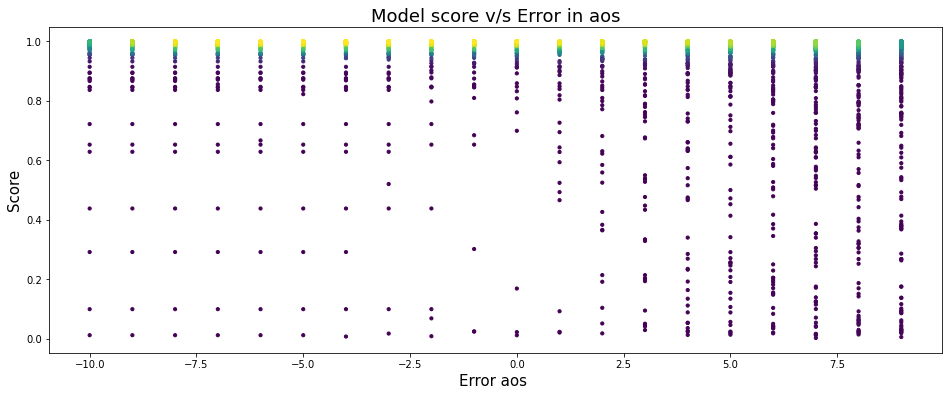

In [76]:
# Calculate the point density
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density
x = difference_aos_list_full_concat
y = score_aos_list_full_concat
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

fig = plt.figure(figsize=(16, 6)) 
ax = fig.add_subplot(1, 1, 1)

plt.title(f"Model score v/s Error in aos", fontsize = 18)
plt.ylabel("Score", fontsize = 15)
plt.xlabel("Error aos ", fontsize = 15)

#plt.xlim([-10, 10])

#plt.axhline(y = 0.5, color = 'r', linestyle = '--', label = "Classification threshold 0.5") 
#plt.axvline(x = -25, color = '#ffaa00', linestyle = '--', label = "±25") 
#plt.axvline(x = 25, color = '#ffaa00', linestyle = '--') 
#plt.legend(prop={'size': 15})

density =  ax.scatter(x, y, c=z, s=10 )#, alpha=30*z)
#fig.colorbar(density, label='Number of points per pixel')
plt.show()
